<div style="
  width: 35%;
  height: 70px;
  margin: 40px auto;
  font-size: 48px;
  background: url('https://wallpaperaccess.ir/upload/picture-1500/QRvqbHs.jpg') no-repeat center center;
  background-size: cover;
  border-radius: 50px;
  text-shadow: 0px 0px 15px rgb(0, 127, 217);
  padding: 20px 40px;
  display: flex;
  align-items: center;
  justify-content: center;
  box-shadow: 0 8px 20px rgba(0,0,0,0.5);
  font-family: 'Segoe UI', sans-serif;
  color: white;
  gap: 20px;
">
  <span style="text-align:center;">S4E42</span>
</div>




 <div style="display: flex; align-items: center; justify-content: center; padding: 30px; border-radius: 20px; max-width: 1000px; margin: 40px auto;">
<img src="https://wallpaperaccess.ir/upload/picture-1500/wp1936869.jpg
" alt="Heart Disease" style="width: 45%; height: auto; border-radius: 15px; box-shadow: 0 0px 25px rgb(0, 255, 251); margin-right: 25px;">
</div>

In [342]:
import pandas as pd
import matplotlib.pyplot as plt 
import matplotlib.cm as cm
import matplotlib.colors as colors
import seaborn as sns
import numpy as np
import plotly as px
from geopy.geocoders import Nominatim
from countryinfo import CountryInfo
from geopy.geocoders import Nominatim
import time
import plotly.express as px
from plotly.offline import init_notebook_mode
init_notebook_mode(connected=True)
import geopandas as gpd
import mplcursors
import plotly.graph_objects as go
from IPython.core.display import display, HTML
from matplotlib.patches import Ellipse
import matplotlib.transforms as transforms
from matplotlib.patches import ConnectionPatch
from plotly.subplots import make_subplots
import itertools
import math


In [343]:
df=pd.read_csv("Country-data .csv")
display(df.head().style.background_gradient(cmap='magma'))

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
0,Afghanistan,90.200000,10.000000,7.580000,44.900000,1610,9.440000,56.200000,5.820000,553
1,Albania,16.600000,28.000000,6.550000,48.600000,9930,4.490000,76.300000,1.650000,4090
2,Algeria,27.300000,38.400000,4.170000,31.400000,12900,16.100000,76.500000,2.890000,4460
3,Angola,119.000000,62.300000,2.850000,42.900000,5900,22.400000,60.100000,6.160000,3530
4,Antigua and Barbuda,10.300000,45.500000,6.030000,58.900000,19100,1.440000,76.800000,2.130000,12200


In [344]:
unique_values = df.columns

html_code = """
<div style='
    background-color: #121212;
    border-radius: 16px;
    padding: 30px;
    box-shadow: 0 0 25px rgba(0,0,0,0.3);
    width: 95%;
    margin: 20px auto;
    display: grid;
    grid-template-columns: repeat(auto-fill, minmax(150px, 1fr));
    gap: 15px;
    font-family: "Segoe UI", Arial, sans-serif;
    color: white;
'>
"""

for value in unique_values:
    html_code += f"""
    <div style='
        background: linear-gradient(145deg, #1e1e2f, #2c2c44);
        color: #f1f1f1;
        padding: 18px;
        border-radius: 12px;
        font-size: 10px;
        font-weight: 500;
        box-shadow: 0 6px 12px rgba(0,0,0,0.25);
        text-align: center;
        display: flex;
        align-items: center;
        justify-content: center;
        height: 90px;
        transition: all 0.3s ease;
    ' 
onmouseover="this.style.transform='scale(1.05)'; this.style.fontSize='15px'; this.style.background='linear-gradient(145deg,#3a3a6a,#5050a1)';"
onmouseout="this.style.transform='scale(1)'; this.style.fontSize='10px'; this.style.background='linear-gradient(145deg,#1e1e2f,#2c2c44)';"

    >
        {value}
    </div>
    """

html_code += "</div>"

from IPython.display import display, HTML
display(HTML(html_code))


<div style="
    background: linear-gradient(145deg, #0d0d0d, #1a1a1a);
    border-left: 12px solid rgb(255, 0, 0);
    width: 30%;
    margin: 40px auto;
    padding: 24px 32px;
    border-radius: 20px;
    box-shadow: 0 0 25px rgba(255, 0, 0, 0.3), inset 0 0 20px rgrgba(255, 0, 0, 0.1)
    font-family: 'Segoe UI', Tahoma, Geneva, Verdana, sans-serif;
    position: relative;
    overflow: hidden;
    text-align: center;
">
  <div style="
      position: absolute;
      top: -22px;
      right: -20px;
      background: linear-gradient(135deg,rgb(56, 4, 4),rgb(2, 24, 56));
      color: white;
      font-size: 26px;
      padding: 10px 16px;
      border-radius: 50%;
      box-shadow: 0 0 15px rgba(255, 0, 0, 0.8);
      font-weight: bold;
  "></div>
  <p style="color:rgb(255, 0, 0); font-size: 21px; margin: 0; font-weight: bold; letter-spacing: 2px;">
    EDA
  </p>
</div>


In [345]:

row, col = df.shape

html_code = f"""
<div style="background:black; color: white; padding: 20px; border-radius: 15px; width: fit-content; box-shadow: 0px 0px 10px red; text-align: center;">
  <h2 style="margin-bottom: 10px;"> Dataset Dimensions</h2>
  <p style="font-size: 20px; margin: 5px 0;"> <strong>Number of Rows:</strong> <span style="color: #ffff66;">{row}</span></p>
  <p style="font-size: 20px; margin: 5px 0;"> <strong>Number of Columns:</strong> <span style="color: #ffff66;">{col}</span></p>
</div>
"""

display(HTML(html_code))


In [346]:
from IPython.display import HTML
import pandas as pd

columns_info = pd.DataFrame({
    "Column Name": df.columns,
    "Data Type": [str(dtype) for dtype in df.dtypes]
})

html_table = columns_info.to_html(index=False, border=0, classes='google-table')

styles = """
<style>
.google-table {
color:black;
    border-collapse: separate;
    border-spacing: 0;
    border-radius: 10px;
    overflow: hidden;
    font-family: 'Roboto', Arial, sans-serif;
    font-size: 14px;
    width: 60%;
    margin: 20px auto;
    box-shadow: 0 4px 15px rgba(0,0,0,0.1);
}
.google-table th {
    background-color: #0000;
    color: white;
    font-weight: 600;
    padding: 12px 20px;
    text-align: left;
}
.google-table td {
    background-color: #ffffff;
    padding: 12px 20px;
    text-align: left;
    border-bottom: 1px solid #e0e0e0;
}
.google-table tr:last-child td {
    border-bottom: none;
}
.google-table tr:hover td {
    background-color: #f1f3f4;
    transition: 0.3s;
}
</style>
"""

display(HTML(styles + html_table))


Column Name,Data Type
country,object
child_mort,float64
exports,float64
health,float64
imports,float64
income,int64
inflation,float64
life_expec,float64
total_fer,float64
gdpp,int64


In [347]:

def _fmt(v):
    if pd.isna(v):
        return "—"
    try:
        f = float(v)
        if f.is_integer():
            return f"{int(f)}"
        s = f"{f:.4g}"
        if "." in s:
            s = s.rstrip("0").rstrip(".")
        return s
    except Exception:
        return str(v)

rows_html = []
for col in df:
    s = pd.to_numeric(df[col], errors="coerce")
    mn, mx = s.min(), s.max()
    rows_html.append(f"""
      <tr>
        <td>{col}</td>
        <td>{_fmt(mn)}</td>
        <td>{_fmt(mx)}</td>
      </tr>
    """)

html_code = f"""
<style>
  table.custom-table {{
    width: 60%;
    border-collapse: collapse;
    font-family: "Tahoma", sans-serif;
    margin: 20px auto;
    border: 1px solid #555;
    color: #000;
  }}
  table.custom-table thead {{
    background: #555;
    color: white;
    font-size: 16px;
    text-align: center;
      color: #000;
  }}
  table.custom-table th, table.custom-table td {{
    padding: 10px 14px;
    text-align: center;
    border: 1px solid #ccc;
      color: #000;
  }}
  table.custom-table tbody tr:nth-child(even) {{
    background: #f2f2f2;
      color: #000;
  }}
  table.custom-table tbody tr:nth-child(odd) {{
    background: #ffffff;
      color: #000;
  }}
  table.custom-table tbody tr:hover {{
    background: #d9d9d9;
    transition: 0.2s;
      color: #000;
  }}
</style>

<table class="custom-table">
  <thead>
    <tr>
<th>Column</th>
<th>Minimum (min)</th>
<th>Maximum (max)</th>
    </tr>
  </thead>
  <tbody>
    {''.join(rows_html)}
  </tbody>
</table>
"""

display(HTML(html_code))


Column,Minimum (min),Maximum (max)
country,—,—
child_mort,2.6,208
exports,0.109,200
health,1.81,17.9
imports,0.0659,174
income,609,125000
inflation,-4.21,104
life_expec,32.1,82.8
total_fer,1.15,7.49
gdpp,231,105000



<div style="
    background: black;
    width: 30%;
    margin: 30px auto;
    border-radius: 20px;
    text-align: center;
    box-shadow: 0 0 5px rgba(255, 0, 0, 0.77);
    color:rgb(161, 13, 13);
    font-size: 26px;
    padding: 20px 30px;
    font-family: 'Segoe UI', Tahoma, Geneva, Verdana, sans-serif;
    font-weight: bold;
">
describe
</div>


In [348]:
numeric_df = df.select_dtypes(include=["number"])
numeric_df.describe()[1:].T.style.background_gradient(cmap='viridis', axis=1)

,mean,std,min,25%,50%,75%,max
child_mort,38.270060,40.328931,2.600000,8.250000,19.300000,62.100000,208.000000
exports,41.108976,27.412010,0.109000,23.800000,35.000000,51.350000,200.000000
health,6.815689,2.746837,1.810000,4.920000,6.320000,8.600000,17.900000
imports,46.890215,24.209589,0.065900,30.200000,43.300000,58.750000,174.000000
income,17144.688623,19278.067698,609.000000,3355.000000,9960.000000,22800.000000,125000.000000
inflation,7.781832,10.570704,-4.210000,1.810000,5.390000,10.750000,104.000000
life_expec,70.555689,8.893172,32.100000,65.300000,73.100000,76.800000,82.800000
total_fer,2.947964,1.513848,1.150000,1.795000,2.410000,3.880000,7.490000
gdpp,12964.155689,18328.704809,231.000000,1330.000000,4660.000000,14050.000000,105000.000000


In [349]:

# from scipy import stats

# Continuous=['child_mort', 'exports', 'health', 'imports', 'income', 'inflation',
#        'life_expec', 'total_fer', 'gdpp']


# for col in Continuous:
#     df_0[col] = pd.to_numeric(df_0[col], errors='coerce')

# numeric_cols = [col for col in Continuous if pd.api.types.is_numeric_dtype(df_0[col]) and df_0[col].notna().any()]


# def descriptive_stats(series):
#     if series.dropna().empty:
#         return {k: np.nan for k in [
#             'Mean','Median','Mode','Std','Variance','Range',
#             'Q1','Q3','IQR','Skewness','Kurtosis','Min','Max',
#             'Sum','Count','Coeff_of_Var_%','90th_Percentile'
#         ]}
#     return {
#         'Mean': series.mean(),
#         'Median': series.median(),
#         'Mode': series.mode()[0] if not series.mode().empty else np.nan,
#         'Std': series.std(),
#         'Variance': series.var(),
#         'Range': series.max() - series.min(),
#         'IQR': series.quantile(0.75) - series.quantile(0.25),
#         'Skewness': stats.skew(series.dropna()),
#         'Kurtosis': stats.kurtosis(series.dropna()),
#         'Min': series.min(),
#         'Max': series.max(),
#         'Sum': series.sum(),
#         'Count': series.count(),
#         'Coeff_of_Var_%': (series.std() / series.mean() * 100) if series.mean() != 0 else np.nan,
#         '90th_Percentile': series.quantile(0.9)
#     }


# stats_dict = {col: descriptive_stats(df_0[col]) for col in numeric_cols}

# stats_df_0s = {}
# for col, stats_d in stats_dict.items():
#     df_0_stats = pd.DataFrame(stats_d.items(), columns=['Metric', 'Value'])
#     df_0_stats['Value'] = df_0_stats['Value'].apply(lambda x: f"{x:.2f}" if pd.notnull(x) else "")
#     stats_df_0s[col] = df_0_stats

# def make_three_column_table(stats_df_0s):
#     cols = list(stats_df_0s.keys())
#     while len(cols) % 3 != 0:
#         cols.append(None)
#     rows = len(cols) // 3
    
#     html = """
#   <style>
#     .stats-table-container {
#         width: 100%;
#         border-collapse: collapse;
#         font-family: 'Segoe UI', Arial, sans-serif;
#     }
#     .stats-card {
#         vertical-align: top;
#         border: 1px solid #ff8800;
#         border-radius: 8px;
#         padding: 6px 8px;
#         width: 33%;
#         background: linear-gradient(145deg, #0d0d0d, #1a1a1a);
#         box-shadow: 0 2px 6px rgba(255,100,0,0.25);
#         color: #f0f0f0;
#     }
#     .stats-card h3 {
#         text-align: center;
#         background: linear-gradient(90deg, #ff8800, #ff0000);
#         -webkit-background-clip: text;
#         -webkit-text-fill-color: transparent;
#         font-size: 14px;
#         margin-bottom: 6px;
#         font-weight: bold;
#     }
#     .stats-card table {
#         width: 100%;
#         border-collapse: collapse;
#         font-size: 11px;
#         color: #f5f5f5;
#     }
#     .stats-card th {
#         background-color: #1a1a1a;
#         color: #ffcc00;
#         padding: 4px;
#         border-bottom: 1px solid #ff5500;
#         text-align: center;
#     }
#     .stats-card td {
#         padding: 4px;
#         text-align: center;
#         border-bottom: 1px solid #333;
#     }
#     .stats-card tr:hover {
#         background-color: rgba(255,50,50,0.15);
#     }
# </style>

#     <table class="stats-table-container">
#     """
    
#     for r in range(rows):
#         html += '<tr>'
#         for c in range(3):
#             idx = r*3 + c
#             col_name = cols[idx]
#             if col_name:
#                 raw_html = stats_df_0s[col_name].to_html(index=False, border=0)
#                 raw_html = raw_html.replace(
#                     '<table border="0" class="dataframe">', '<table>'
#                 )
#                 html += f'<td class="stats-card">'
#                 html += f'<h3>{col_name}</h3>'
#                 html += raw_html
#                 html += '</td>'
#             else:
#                 html += '<td></td>'
#         html += '</tr>'
#     html += '</table>'
#     return html

# display(HTML(make_three_column_table(stats_df_0s)))



In [350]:
df_model=df.copy()
df_model.drop("country",axis=1,inplace=True)

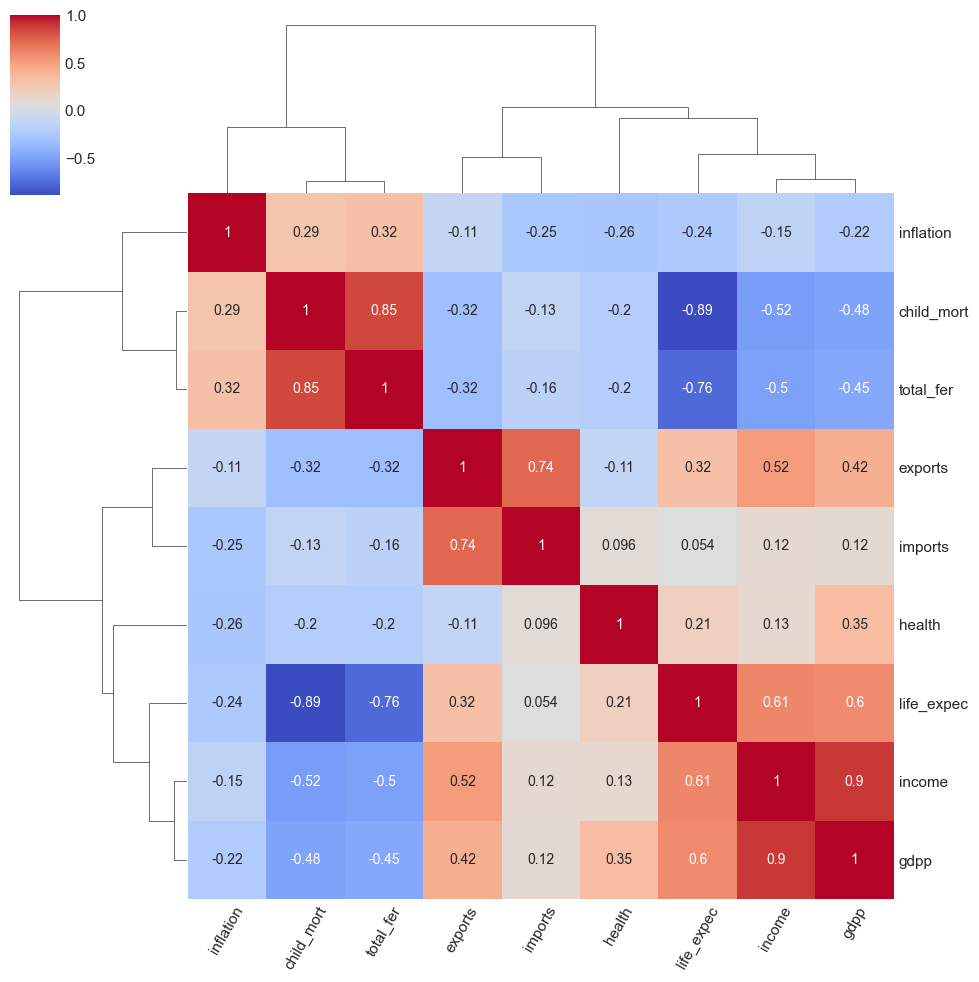

In [351]:

ax = sns.clustermap(df_model.corr(), 
                   method = 'complete', 
                   cmap   = 'coolwarm', 
                   annot  = True, 
                   annot_kws = {'size': 10})
plt.setp(ax.ax_heatmap.get_xticklabels(), rotation=60);

<!DOCTYPE html>
<html lang="en">
<head>
    <meta charset="UTF-8">
    <title>Most Related Features</title>
    <style>
        table {
            border-collapse: collapse;
            width: 50%;
            margin: 20px auto;
            font-family: Arial, sans-serif;
        }
        th, td {
            border: 1px solid #333;
            padding: 8px 12px;
            text-align: center;
        }
        th {
            background-color: #f2f2f2;
        }
    </style>
</head>
<body>
    <h2 style="text-align:center;">Most Related Features</h2>
    <table>
        <thead>
            <tr>
                <th>Feature 1</th>
                <th>Feature 2</th>
                <th>Correlation</th>
            </tr>
        </thead>
        <tbody>
            <tr>
                <td>income</td>
                <td>gdpp</td>
                <td>0.90</td>
            </tr>
            <tr>
                <td>life_expect</td>
                <td>child_mort</td>
                <td>-0.89</td>
            </tr>
            <tr>
                <td>total_fer</td>
                <td>child_mort</td>
                <td>0.85</td>
            </tr>
        </tbody>
    </table>
</body>
</html>


In [352]:
from scipy.cluster.hierarchy import linkage, fcluster


link = linkage(df_model.corr(), method='complete')


clusters = fcluster(link, t=3, criterion='maxclust')


for col, cluster_id in zip(df_model.columns, clusters):
    print(f"{col}: Cluster {cluster_id}")


child_mort: Cluster 1
exports: Cluster 2
health: Cluster 3
imports: Cluster 2
income: Cluster 3
inflation: Cluster 1
life_expec: Cluster 3
total_fer: Cluster 1
gdpp: Cluster 3


In [353]:
heat=df.copy()
# heat.drop(columns=["Longitude","Latitude",'Unnamed: 0.1', 'Unnamed: 0','rank_child_mort', 'rank_life_expec'],inplace=True)
df_numeric = heat.select_dtypes(include=['int64', 'float64'])
corr_matrix = df_numeric.corr()
corr_sum = corr_matrix.abs().sum() - 1 
most_correlated_column = corr_sum.idxmax()
max_value = corr_sum.max()
print("The column that has the highest correlation with the other columns:", most_correlated_column)

corr_sum_sorted = corr_sum.sort_values(ascending=False)

html = f"""
<h2>Most Correlated Column</h2>
<p><strong>{most_correlated_column}</strong> with total correlation = <strong>{max_value:.2f}</strong></p>

<h2>Correlation Sum for All Columns</h2>
<table border="1" cellspacing="0" cellpadding="5">
<tr><th>Column</th><th>Sum of Absolute Correlations</th></tr>
"""

for col, val in corr_sum_sorted.items():
    if col == most_correlated_column:
        html += f"<tr style='color:black;background-color: #b6fcb6; font-weight:bold;'><td>{col}</td><td>{val:.2f}</td></tr>"
    else:
        html += f"<tr><td>{col}</td><td>{val:.2f}</td></tr>"

html += "</table>"

from IPython.core.display import display, HTML
display(HTML(html))


The column that has the highest correlation with the other columns: life_expec


Column,Sum of Absolute Correlations
life_expec,3.68
child_mort,3.68
total_fer,3.56
gdpp,3.54
income,3.45
exports,2.85
inflation,1.82
imports,1.66
health,1.55



<div style="
    background: black;
    width: 30%;
    margin: 30px auto;
    border-radius: 20px;
    text-align: center;
    box-shadow: 0 0 5px rgba(255, 0, 0, 0.77);
    color:rgb(161, 13, 13);
    font-size: 26px;
    padding: 20px 30px;
    font-family: 'Segoe UI', Tahoma, Geneva, Verdana, sans-serif;
    font-weight: bold;
">
Missing values
</div>


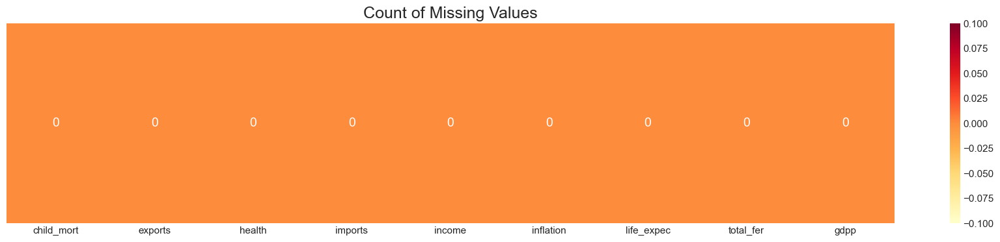

In [354]:
plt.figure(figsize=(22,4))
sns.heatmap((numeric_df.isna().sum()).to_frame(name='').T,cmap='YlOrRd', annot=True,
             fmt='0.0f').set_title('Count of Missing Values', fontsize=18)
plt.show()

In [355]:

columns_html = ""
for x in df.columns:
    columns_html += f"<li style='margin-bottom: 6px;'><strong>{x}</strong>: <span style='color:red;'>{df[x].isna().sum()*100/len(df)}%</span></li>"

html_code = f"""
<div style="background:black;box-shadow: 0 0 5px rgba(255, 0, 0, 0.77); color: white; padding: 20px; border-radius: 15px; width: fit-content; text-align: center;">
  <hr style="margin: 15px 0; border: 1px solid #aaa;">
  <h3 style="margin-bottom: 10px;">✅missing values </h3>
  <ul style="list-style: none; padding: 0; font-size: 18px; text-align: left;">
    {columns_html}
  </ul>
</div>
"""

display(HTML(html_code))


ok✅


 
<div style="
    background: black;
    width: 30%;
    margin: 30px auto;
    border-radius: 20px;
    text-align: center;
    box-shadow: 0 0 5px rgba(255, 0, 0, 0.77);
    color:rgb(161, 13, 13);
    font-size: 26px;
    padding: 20px 30px;
    font-family: 'Segoe UI', Tahoma, Geneva, Verdana, sans-serif;
    font-weight: bold;
">
 Outliers and noise
</div>


In [356]:
numeric_df = df.select_dtypes(include=["number"])

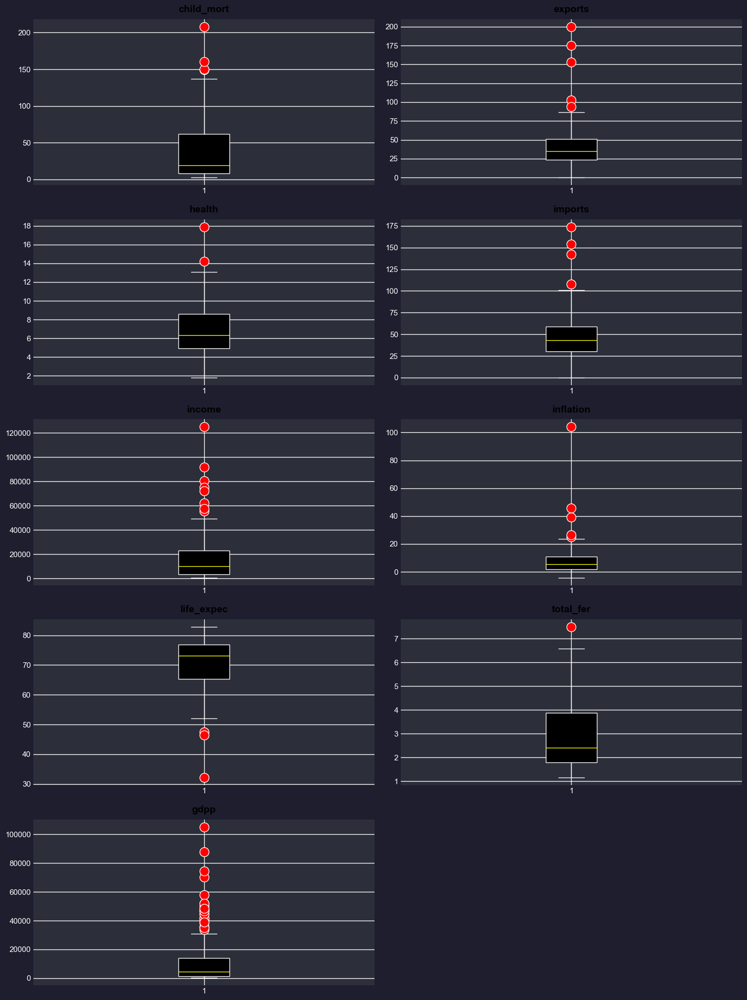

In [357]:
import matplotlib.pyplot as plt


fig, ax = plt.subplots(5, 2, figsize=(15, 20))  
fig.patch.set_facecolor("#1e1e2f")  

for i, x in enumerate(numeric_df.columns):
    row = i // 2 
    col = i % 2
    ax_current = ax[row, col]
    
    ax_current.patch.set_facecolor("#2c2f3a")
    ax_current.boxplot(df[x], patch_artist=True,
                       boxprops=dict(facecolor="#000000", color='white'),
                       capprops=dict(color='white'),
                       whiskerprops=dict(color='white'),
                       flierprops=dict(markerfacecolor='red', marker='o', markersize=13, linestyle='none'),
                       medianprops=dict(color='yellow'))
    
    ax_current.set_title(x, color="#000000", fontsize=14, pad=10, weight='bold')
    ax_current.tick_params(colors='white', labelsize=11)
    ax_current.spines['top'].set_visible(False)
    ax_current.spines['right'].set_visible(False)
    ax_current.spines['bottom'].set_color('white')
    ax_current.spines['left'].set_color('white')


for j in range(len(numeric_df.columns), 10):
    row = j // 2
    col = j % 2
    ax[row, col].axis('off')

plt.tight_layout()
plt.show()


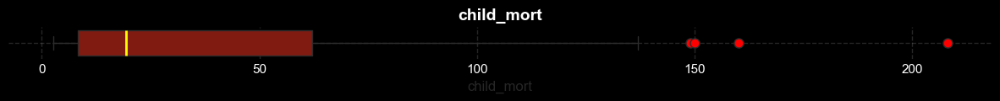

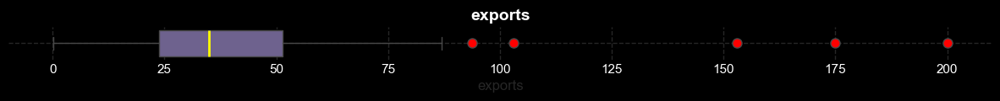

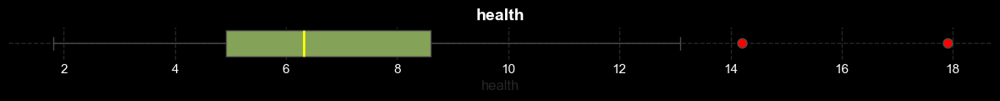

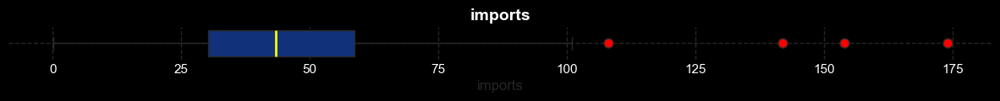

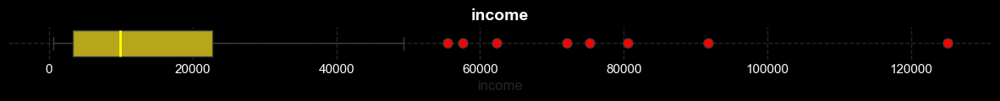

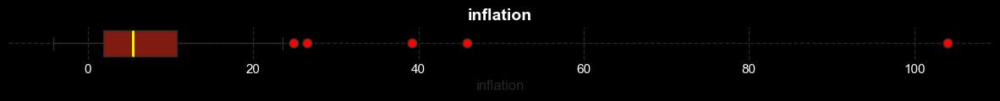

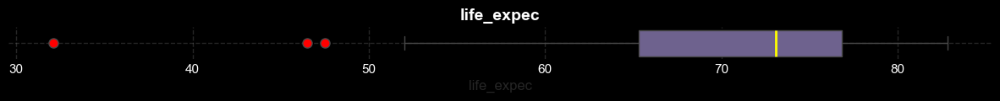

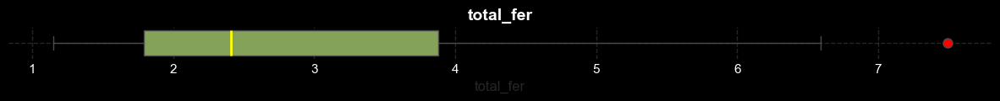

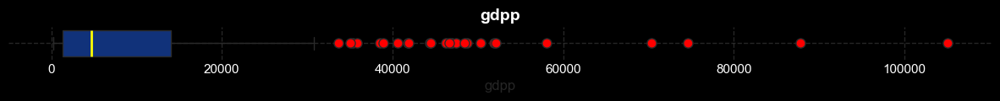

In [358]:


palette = ["#920C00", "#6B5B95", "#88B04B", "#002C8B", "#CFBB00"] 

for i, column in enumerate(numeric_df.columns):
    fig, ax = plt.subplots(figsize=(15, 0.5)) 
    fig.patch.set_facecolor("black")  
    ax.set_facecolor("black")  


    sns.boxplot(
        x=numeric_df[column],
        ax=ax,
        color=palette[i % len(palette)],  
        flierprops=dict(marker='o', markerfacecolor='red', markersize=8, linestyle='none'),
        medianprops=dict(color='yellow', linewidth=2)  
    )


    ax.set_title(column, color="white", fontsize=14, fontweight="bold")
    ax.tick_params(colors='white')  
    ax.spines['bottom'].set_color('white')
    ax.spines['top'].set_color('white')
    ax.spines['left'].set_color('white')
    ax.spines['right'].set_color('white')
    ax.grid(True, color="gray", linestyle="--", alpha=0.3)  

    plt.show()


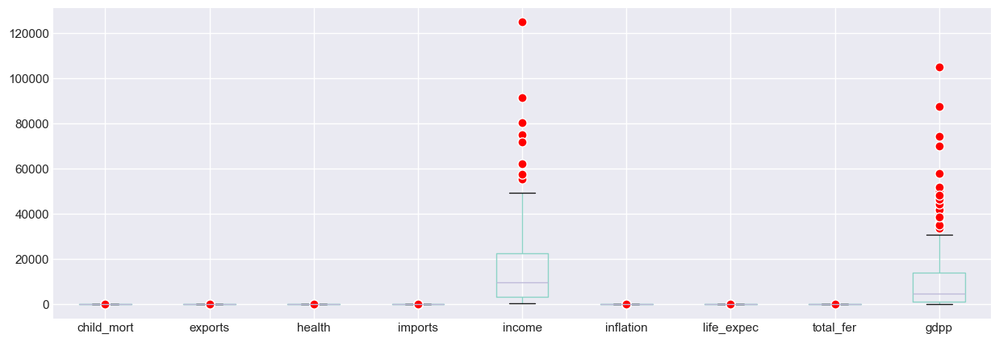

In [359]:

flierprops = dict(marker='o', markerfacecolor='red', markersize=8, linestyle='none')
numeric_df.boxplot( figsize=(15,5), flierprops=flierprops)
plt.show()


In [360]:

html_content = """
<style>
.container {
    display: flex;
    flex-wrap: wrap;
    gap: 20px;
    justify-content: center;
}
.card {
    color:white;
    background-color: black;
    border-radius: 15px;
    box-shadow: 0 6px 20px rgba(0,0,0,0.1);
    padding: 20px;
    width: 300px;
    transition: transform 0.3s, box-shadow 0.3s;
    margin-bottom: 20px;
}
.card:hover {
    transform: translateY(-5px);
    box-shadow: 0 12px 25px rgba(0,0,0,0.15);
}
.card h2 {
    font-size: 18px;
    color: white;
    margin-bottom: 10px;
    text-align: center;
}
.card p {
    font-size: 14px;
    color: white;
    margin: 5px 0 10px 0;
}
.progress {
    background-color: #e0e0e0;
    border-radius: 10px;
    height: 20px;
    width: 100%;
    overflow: hidden;
}
.progress-bar {
    height: 100%;
    background-color: red;
    text-align: right;
    padding-right: 5px;
    color: white;
    font-weight: bold;
    border-radius: 10px 0 0 10px;
}
</style>
<div class="container">
"""

for col in numeric_df.select_dtypes(include=['int64','float64']).columns:
    Q1 = numeric_df[col].quantile(0.25)
    Q3 = numeric_df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    outliers = numeric_df[(numeric_df[col] < lower_bound) | (numeric_df[col] > upper_bound)][col]
    percentage = (len(outliers) / len(numeric_df)) * 100
    
    html_content += f"""
    <div class="card">
        <h2>Column: {col}</h2>
        <p>Outliers: {len(outliers)} ({percentage:.2f}%)</p>
        <div class="progress">
            <div class="progress-bar" style="width:{percentage}%"></div>
        </div>
    </div>
    """

html_content += "</div>"

display(HTML(html_content))


  <div style="background-color:rgb(0, 5, 10); border-left: 5px solid #3cd9e7; padding: 10px 15px; margin: 15px 0;width:70%;color:white;border-radius:20px;">
    <p style="margin: 0;">
       <strong><span style="color:cyan; font-size: 18px;">outliers :</span></strong> 
  From above box-plots we can see that their are so many outliers in our dataset.</br>
  Most of the outliers are in inflation  income per person,GDP per captia and Exports.
    </p>
  </div>




 
<div style="
    background: black;
    width: 30%;
    margin: 30px auto;
    border-radius: 20px;
    text-align: center;
    box-shadow: 0 0 5px rgba(255, 0, 0, 0.77);
    color:rgb(161, 13, 13);
    font-size: 26px;
    padding: 20px 30px;
    font-family: 'Segoe UI', Tahoma, Geneva, Verdana, sans-serif;
    font-weight: bold;
">
Checking distributions
</div>


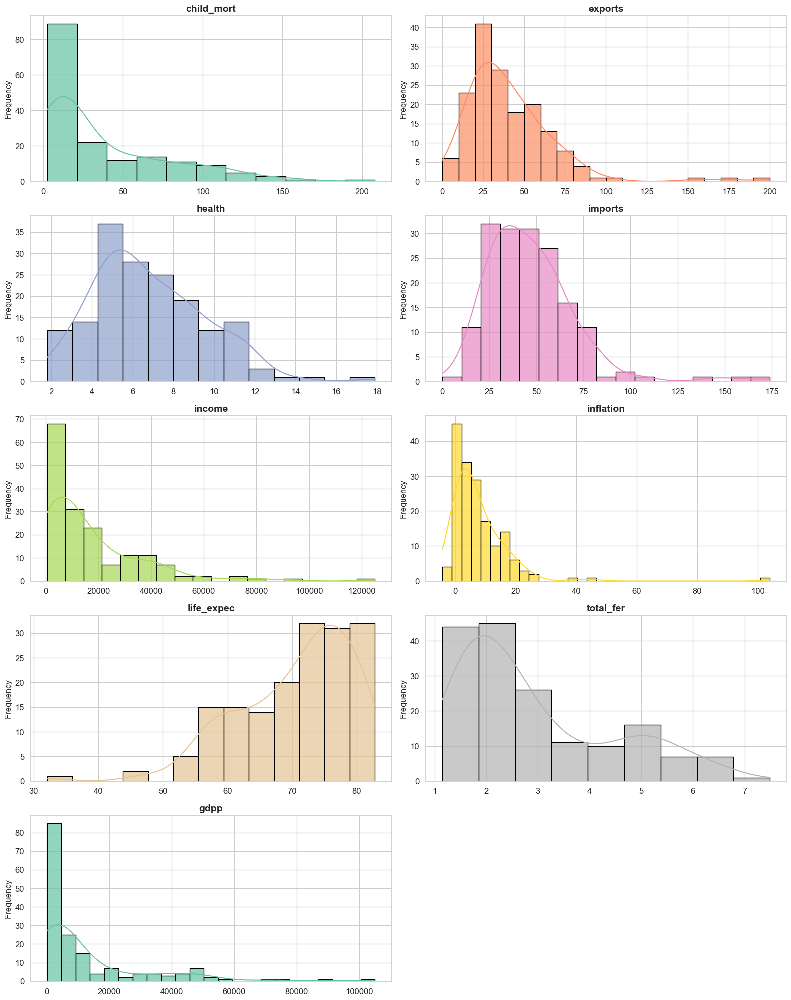

In [361]:

cols = numeric_df
n = len(cols)
rows = int(np.ceil(n / 2))


sns.set(style="whitegrid")
palette = sns.color_palette("Set2", n_colors=n)


fig, axes = plt.subplots(rows, 2, figsize=(16, rows * 4))
axes = axes.flatten()


for i, col in enumerate(cols):
    sns.histplot(df[col], kde=True, ax=axes[i], color=palette[i], edgecolor='black', alpha=0.7)
    axes[i].set_title(col, fontsize=14, fontweight='bold')
    axes[i].set_xlabel('')
    axes[i].set_ylabel('Frequency')
    axes[i].tick_params(axis='both', labelsize=12)


for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()  

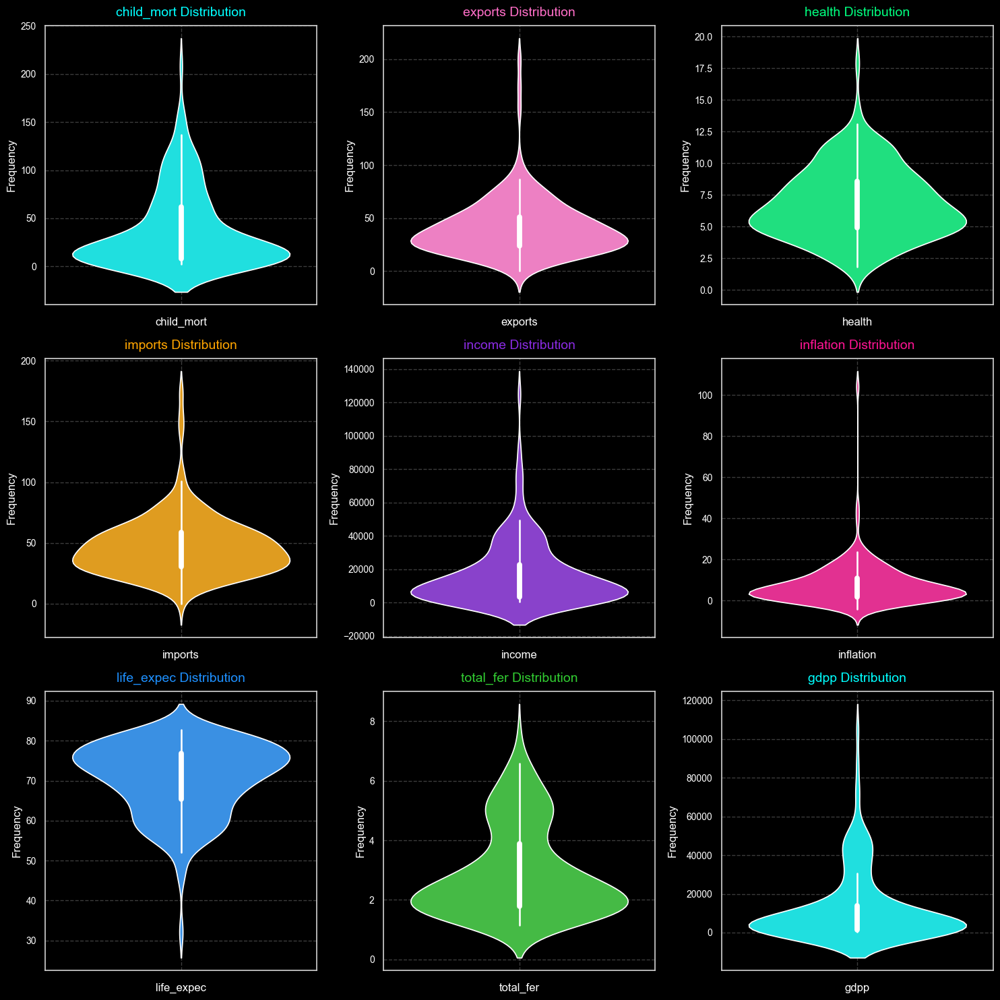

In [362]:

colors = [
    "#00ffff",  
    "#ff6ec7", 
    "#00ff7f",  
    "#ffa500", 
    "#8a2be2",  
    "#ff1493",  
    "#1e90ff", 
    "#32cd32",  
]


n = len(numeric_df.columns)
cols = 3
rows = (n + cols - 1) // cols


fig, axes = plt.subplots(rows, cols, figsize=(15, 15))
fig.patch.set_facecolor("black")
axes = axes.flatten()

for i, col in enumerate(numeric_df.columns):
    ax = axes[i]
    ax.set_facecolor("black")



    if col in df.columns:
        sns.violinplot(data=df, y=col, color=colors[i % len(colors)], edgecolor='white', ax=ax)
    else:
        ax.text(0.5, 0.5, f"Column {col} not found", ha='center', va='center', color='white')

    ax.set_title(f"{col} Distribution", fontsize=14, color=colors[i % len(colors)], pad=10)
    ax.set_xlabel(col, fontsize=12, color="white")
    ax.set_ylabel("Frequency", fontsize=12, color="white")
    ax.tick_params(axis='x', colors='white', labelsize=10)
    ax.tick_params(axis='y', colors='white', labelsize=10)
    ax.grid(True, linestyle='--', alpha=0.3)


for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

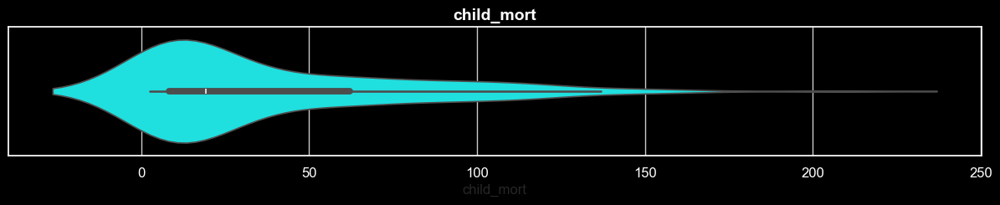

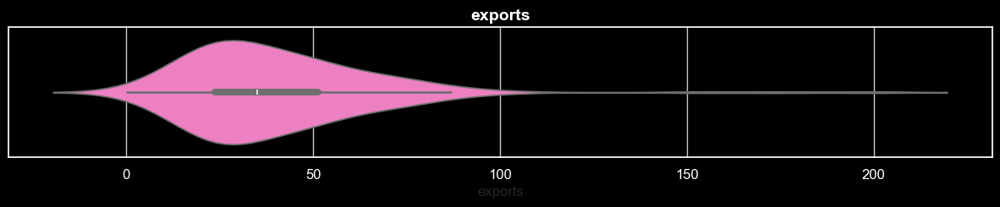

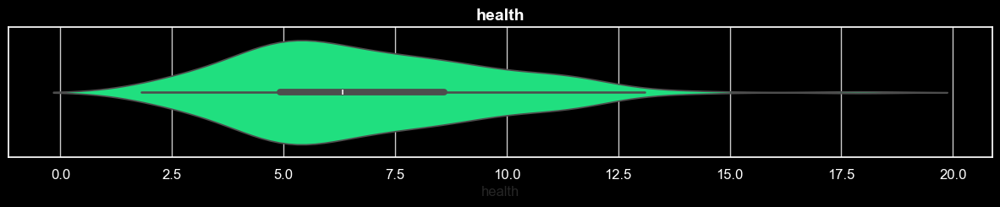

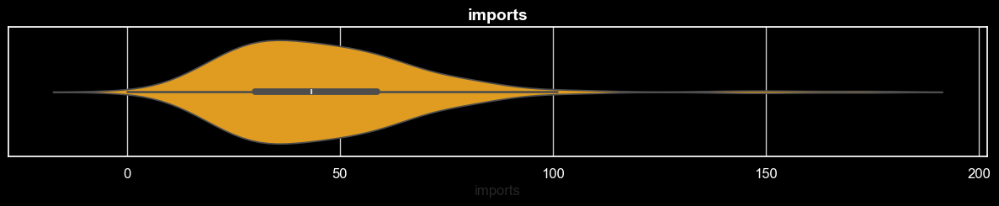

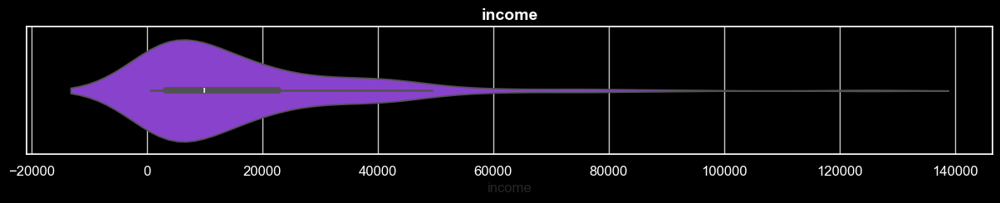

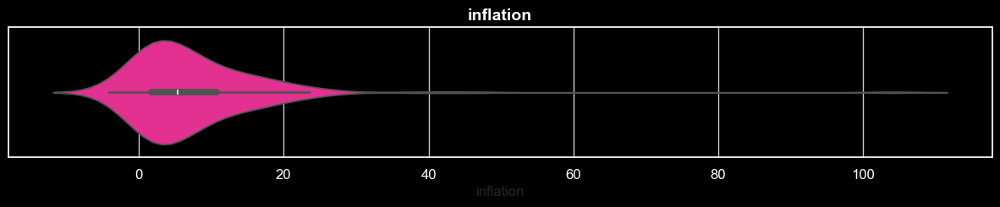

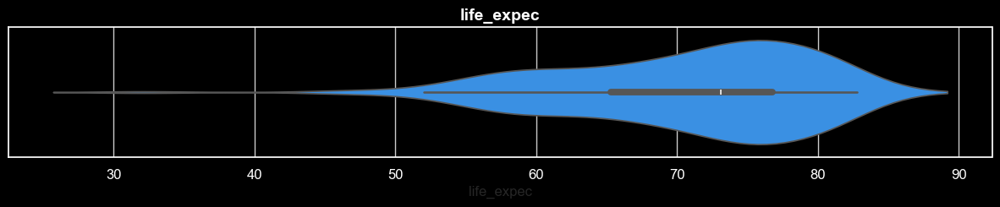

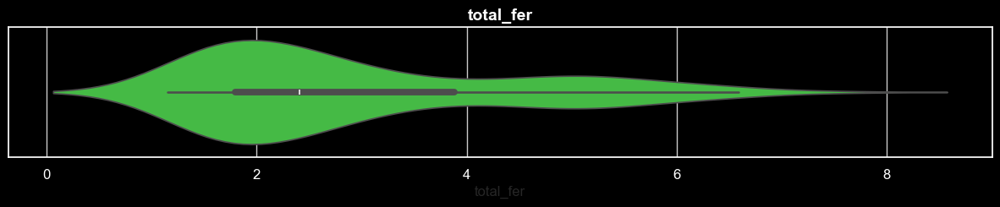

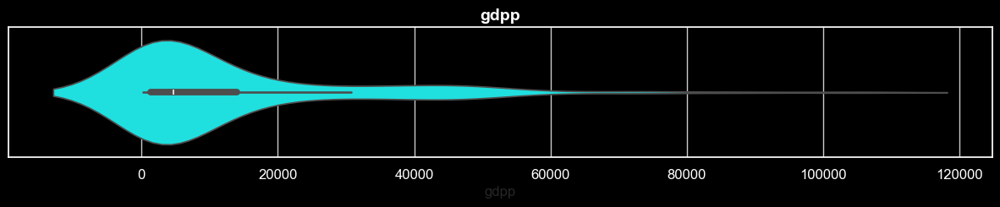

In [363]:

colors = [
    "#00ffff",  
    "#ff6ec7", 
    "#00ff7f",  
    "#ffa500", 
    "#8a2be2",  
    "#ff1493",  
    "#1e90ff", 
    "#32cd32",  
]


sns.set_style("whitegrid")

for i, column in enumerate(numeric_df.columns):
    fig, ax = plt.subplots(figsize=(15, 2))

    fig.patch.set_facecolor("black")
    ax.set_facecolor("black")
    

    sns.violinplot(x=df[column], color=colors[i % len(colors)], ax=ax)
    

    ax.set_title(column, fontsize=14, fontweight='bold', color="white")
    ax.tick_params(colors='white', labelsize=12) 
    ax.spines['bottom'].set_color('white')  
    ax.spines['top'].set_color('white')
    ax.spines['left'].set_color('white')
    ax.spines['right'].set_color('white')
    
    plt.show()


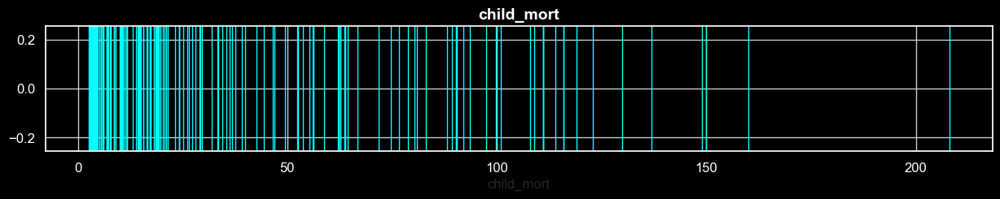

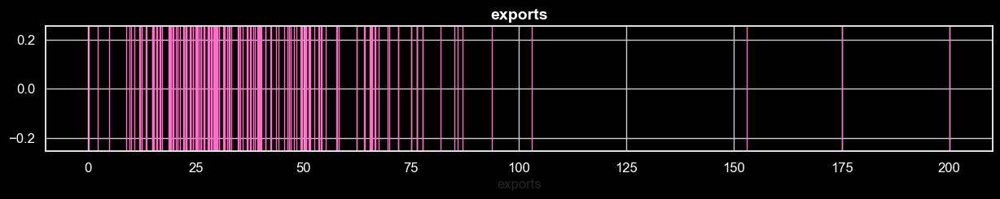

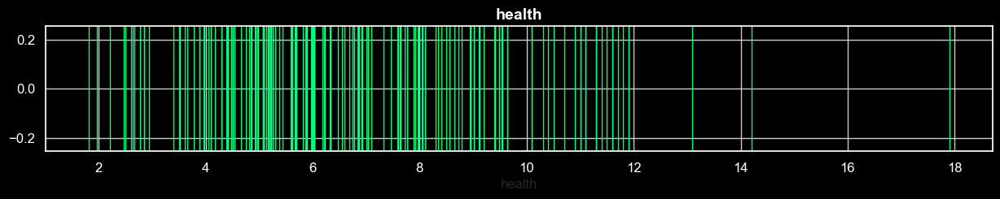

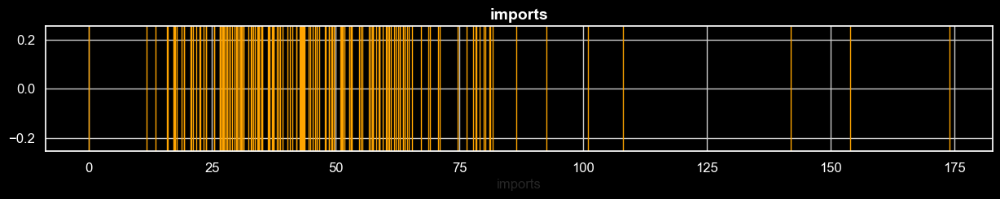

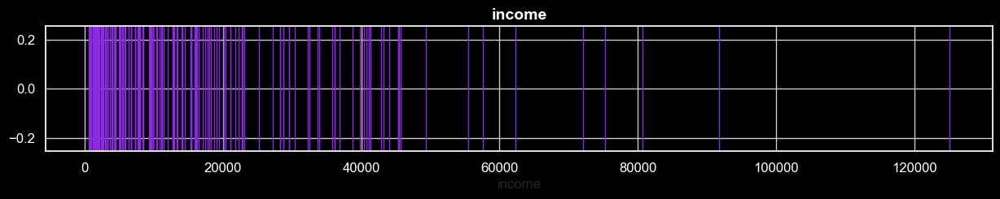

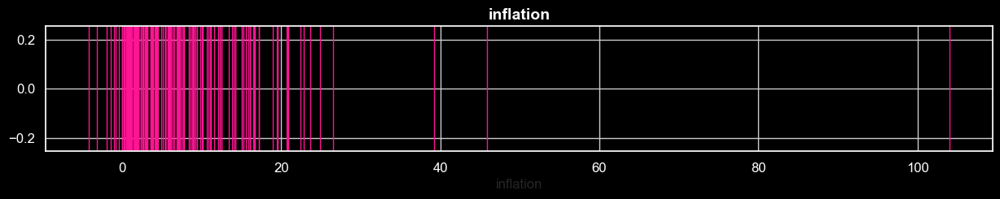

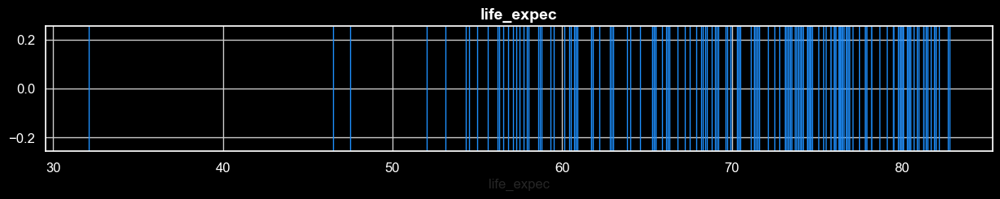

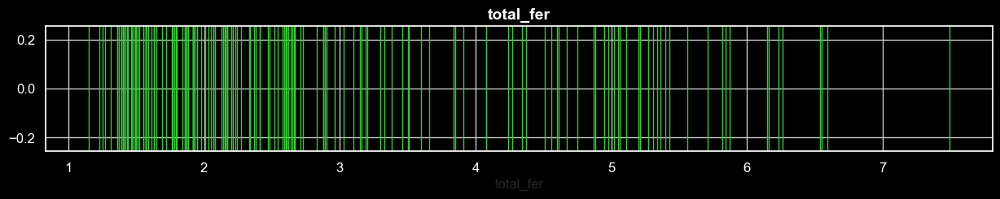

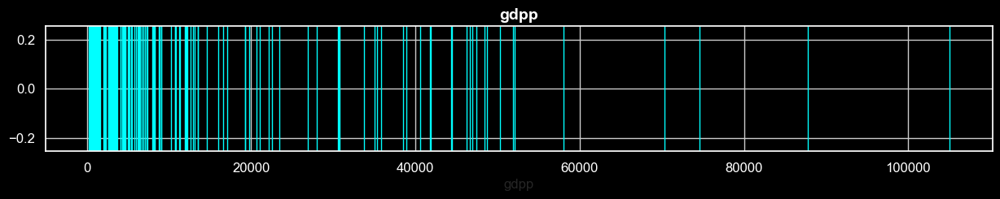

In [364]:





colors = [
    "#00ffff",  
    "#ff6ec7", 
    "#00ff7f",  
    "#ffa500", 
    "#8a2be2",  
    "#ff1493",  
    "#1e90ff", 
    "#32cd32",  
]


sns.set_style("whitegrid")

for i, column in enumerate(numeric_df.columns):
    fig, ax = plt.subplots(figsize=(15, 2))

    fig.patch.set_facecolor("black")
    ax.set_facecolor("black")
    

    sns.rugplot(df[column], height=1, color=colors[i % len(colors)], ax=ax)

    ax.set_title(column, fontsize=14, fontweight='bold', color="white")
    ax.tick_params(colors='white', labelsize=12) 
    ax.spines['bottom'].set_color('white')  
    ax.spines['top'].set_color('white')
    ax.spines['left'].set_color('white')
    ax.spines['right'].set_color('white')
    
    plt.show()


<style>
 .note {
    width:fit-content;
      font-size: 20px;
      color:rgb(43, 153, 0);
      background:rgb(0, 0, 0);
      padding:20px;
      border-radius: 10px;
    } 
</style>
 <div class="note">
      <strong>Note:</strong> Skewness values greater than ±1 indicate a substantial departure from normality.
    </div>

In [365]:
x=["child_mort","inflation","income","gdpp"]
for i in x :
    print(i,df[i].skew())

child_mort 1.4507735387555047
inflation 5.154049359697971
income 2.231479607767527
gdpp 2.2180514519497163



  <title>Normality Check — Column Distributions</title>
  <style>
    body {
      font-family: -apple-system, BlinkMacSystemFont, "Segoe UI", Roboto, "Helvetica Neue", Arial;
      background: #f7fafc;
      color: #0f172a;
      margin: 30px;
      line-height: 1.5;
    }
    .card {
      color:black;
      background: #ffffff;
      border-radius: 10px;
      box-shadow: 0 6px 18px rgba(15,23,42,0.08);
      padding: 22px;
      max-width: 820px;
    }
    h1 {
      font-size: 20px;
      margin: 0 0 12px 0;
    }
    p.lead {
      margin: 0 0 18px 0;
      color: #334155;
    }
    table {
      width: 100%;
      border-collapse: collapse;
      margin-top: 16px;
    }
    th, td {
      padding: 10px 12px;
      border: 1px solid #e2e8f0;
      text-align: left;
    }
    th {
      background:rgb(0, 128, 255);
    }
    code {
      background:#eef2ff;
      padding:2px 6px;
      border-radius:4px;
      font-family: ui-monospace, SFMono-Regular, Menlo, Monaco, "Roboto Mono", monospace;
    }
  </style>

  <div class="card" role="main">
    <h1>Normality Assessment of Columns</h1>
    <p class="lead">
      Based on the conducted analysis, the following columns <strong>do not</strong> follow a normal distribution:
    </p>

  <table>
      <thead>
        <tr>
          <th>Column</th>
          <th>Skewness</th>
          <th>Normality</th>
        </tr>
      </thead>
      <tbody>
        <tr>
          <td>child_mort</td>
          <td>1.451</td>
          <td>Not Normal</td>
        </tr>
        <tr style="background:red;">
          <td>inflation</td>
          <td>5.154</td>
          <td>Not Normal</td>
        </tr>
        <tr>
          <td>income</td>
          <td>2.231</td>
          <td>Not Normal</td>
        </tr>
        <tr>
          <td>gdpp</td>
          <td>2.218</td>
          <td>Not Normal</td>
        </tr>
      </tbody>
    </table>

  <p class="lead" style="margin-top:18px;">
      The remaining columns generally exhibit behavior consistent with a normal distribution, although slight deviations may be present.
    </p>
  </div>



 
<div style="
    background: black;
    width: 30%;
    margin: 30px auto;
    border-radius: 20px;
    text-align: center;
    box-shadow: 0 0 5px rgba(255, 0, 0, 0.77);
    color:rgb(161, 13, 13);
    font-size: 26px;
    padding: 20px 30px;
    font-family: 'Segoe UI', Tahoma, Geneva, Verdana, sans-serif;
    font-weight: bold;
">
Relationship between Variables
</div>


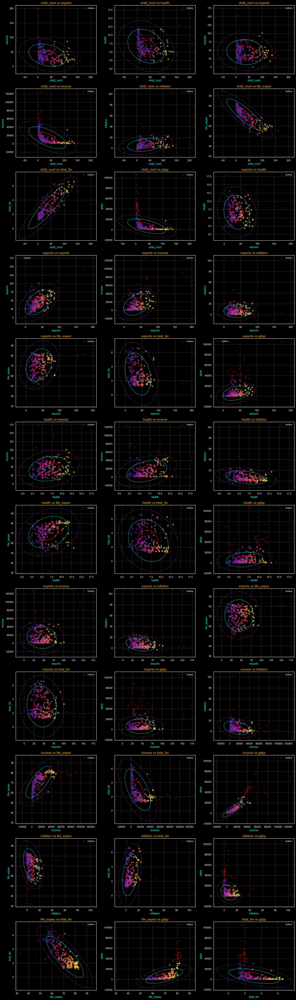

In [366]:



def confidence_ellipse(x, y, ax, n_std=1.0, facecolor='none', **kwargs):
    """
    رسم confidence ellipse برای داده‌های دوبعدی.
    n_std = چند انحراف معیار (1=68% , 2=95% , 3=99.7%)
    """
    if x.size != y.size:
        raise ValueError("x و y باید هم‌اندازه باشند")

    cov = np.cov(x, y) 
    vals, vecs = np.linalg.eigh(cov)  
    order = vals.argsort()[::-1]
    vals, vecs = vals[order], vecs[:, order]

    theta = np.degrees(np.arctan2(*vecs[:, 0][::-1])) 
    width, height = 2 * n_std * np.sqrt(vals)

    ellipse = Ellipse((np.mean(x), np.mean(y)),
                      width, height,
                      angle=theta, facecolor=facecolor, **kwargs)

    ax.add_patch(ellipse)
    return ellipse



cols = ['child_mort', 'exports', 'health', 'imports', 'income',
        'inflation', 'life_expec', 'total_fer', 'gdpp']


pairs = list(itertools.combinations(cols, 2))

plt.style.use("dark_background")
sns.set_palette("viridis")

ncols = 3
nrows = int(np.ceil(len(pairs) / ncols))

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(18, 5*nrows))
axes = axes.flatten()

outlier_factor = 1.5

for i, (x, y) in enumerate(pairs):

    Q1_x, Q3_x = df[x].quantile([0.25, 0.75])
    IQR_x = Q3_x - Q1_x
    lower_x, upper_x = Q1_x - outlier_factor * IQR_x, Q3_x + outlier_factor * IQR_x

    Q1_y, Q3_y = df[y].quantile([0.25, 0.75])
    IQR_y = Q3_y - Q1_y
    lower_y, upper_y = Q1_y - outlier_factor * IQR_y, Q3_y + outlier_factor * IQR_y

    outliers = (df[x] < lower_x) | (df[x] > upper_x) | (df[y] < lower_y) | (df[y] > upper_y)

    axes[i].scatter(
        df.loc[~outliers, x], df.loc[~outliers, y],
        c=df.loc[~outliers, x], cmap="plasma",
        alpha=0.6, edgecolors="w", linewidths=0.3, s=40
    )

    axes[i].scatter(
        df.loc[outliers, x], df.loc[outliers, y],
        c="red", marker="o", s=50, alpha=0.2, label="Outliers"
    )


    confidence_ellipse(df.loc[~outliers, x].values,
                       df.loc[~outliers, y].values,
                       axes[i], n_std=1, edgecolor='red', linewidth=1.5)
    confidence_ellipse(df.loc[~outliers, x].values,
                       df.loc[~outliers, y].values,
                       axes[i], n_std=2, edgecolor='cyan', linestyle='--', linewidth=1.2)
    confidence_ellipse(df.loc[~outliers, x].values,
                       df.loc[~outliers, y].values,
                       axes[i], n_std=3, edgecolor='magenta', linestyle=':', linewidth=1)

    axes[i].set_xlabel(x, fontsize=12, color="cyan")
    axes[i].set_ylabel(y, fontsize=12, color="cyan")
    axes[i].set_title(f"{x} vs {y}", fontsize=14, color="orange")
    axes[i].grid(True, linestyle="--", alpha=0.3)
    axes[i].legend(facecolor="black", fontsize=9, loc="best")

for j in range(len(pairs), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


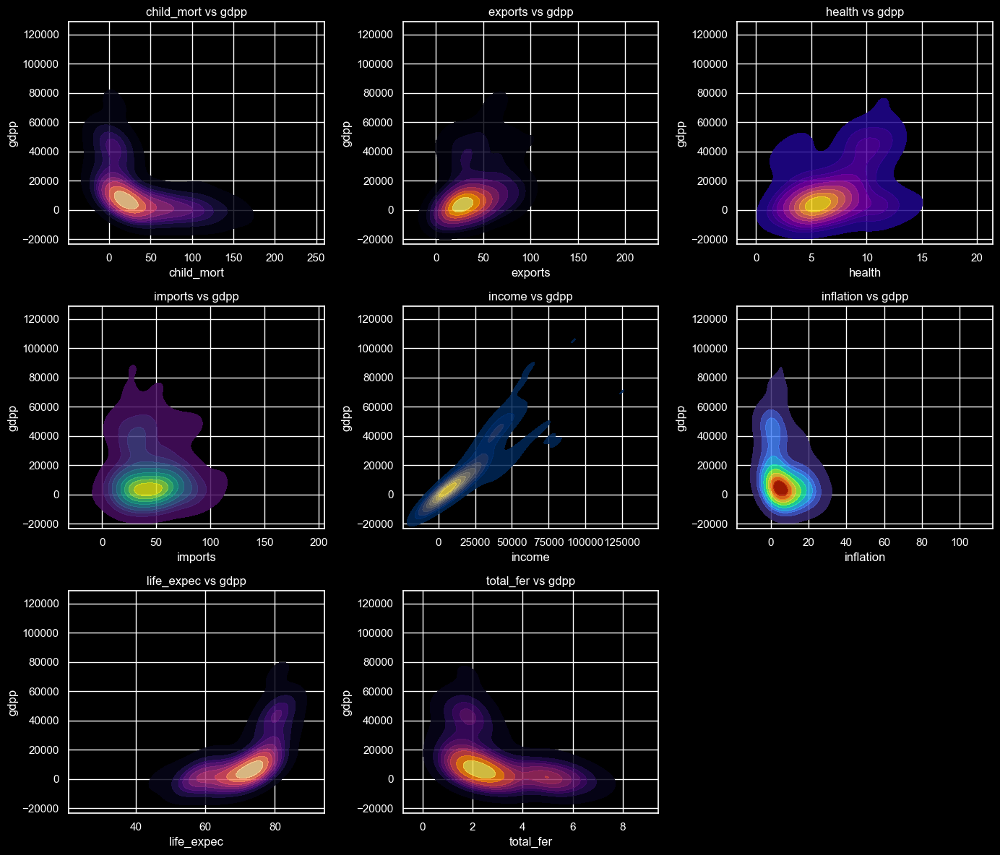

In [367]:
cmaps = ["magma", "inferno", "plasma", 
         "viridis", "cividis", "turbo"]

fig, axes = plt.subplots(3, 3, figsize=(14, 12))
fig.patch.set_facecolor("black")
axes = axes.flatten()

cols = [c for c in numeric_df.columns if c != "gdpp"]

for i, (x, cmap) in enumerate(zip(cols, cmaps * 2)):  
    ax = axes[i]
    sns.kdeplot(
        data=numeric_df, x=x, y="gdpp",
        fill=True, cmap=cmap, alpha=0.85, ax=ax
    )
    ax.set_title(f"{x} vs gdpp", color="white")
    ax.set_facecolor("black")


for j in range(len(cols), len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()


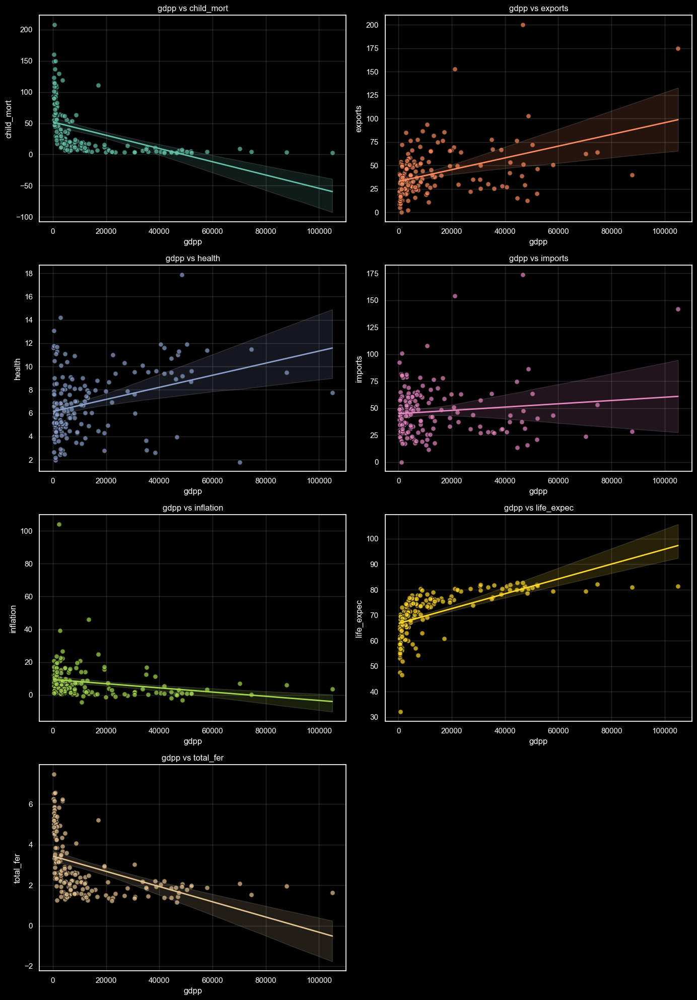

In [368]:

cols = [c for c in numeric_df.columns if c not in ["gdpp", "income"]]

ncols = 2
nrows = (len(cols) + 1) // ncols


colors = sns.color_palette("Set2", len(cols))

fig, axes = plt.subplots(nrows, ncols, figsize=(14, 5*nrows))
axes = axes.flatten()

for i, x in enumerate(cols):
    ax = axes[i]
    color = colors[i % len(colors)] 

    sns.regplot(
        data=numeric_df, x="gdpp", y=x,
        scatter_kws={'alpha':0.7, 's':50, 'color':color, 'edgecolor':'black'},
        line_kws={'color':color, 'linewidth':2},
        ax=ax
    )
    ax.set_facecolor("black")
    ax.set_title(f"gdpp vs {x}", color="white")
    ax.grid(alpha=0.3, color="gray")
    ax.tick_params(colors="white")


for j in range(len(cols), len(axes)):
    axes[j].set_visible(False)

fig.patch.set_facecolor("black")
plt.tight_layout()
plt.show()


In [369]:
df_x=df.copy()
df_x=df_x.iloc[:,2:-6]


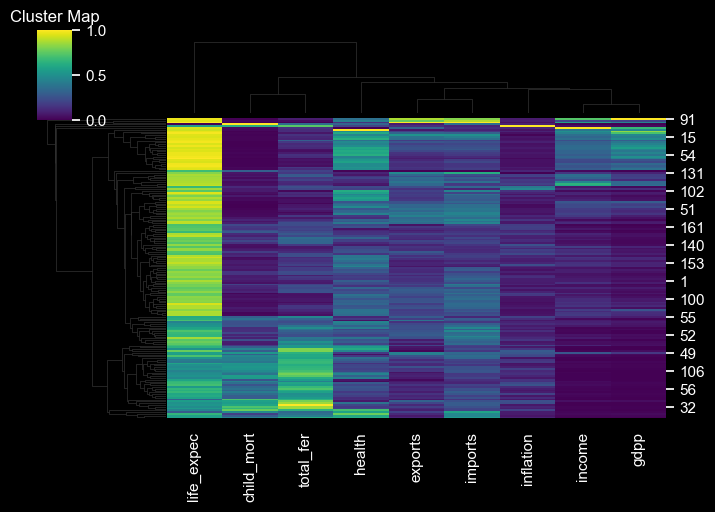

In [370]:
sns.clustermap(numeric_df, cmap='viridis', standard_scale=1, figsize=(7,5))
plt.title("Cluster Map")
plt.show()


# انالیز کل ستون ها و بررسی ها 

<p style="color: white; text-shadow: 0px 0px 4px cyan;">
  At this stage, we aim to add the geographical location of each country along with the continent it belongs to into the dataset.
</p>



<div style="
    margin: 40px auto;
    background: linear-gradient(135deg,rgb(0, 5, 15),rgb(18, 0, 46));
    border-radius: 25px;
    text-align: center;
    box-shadow: 0 0 10px rgba(0, 95, 90, 0.5);
    color: #2d3436;
    font-size: 17px;
    padding: 22px 40px;
    font-family: 'Segoe UI', Tahoma, Geneva, Verdana, sans-serif;
    font-weight: 600;
    width: fit-content;
    transition: all 0.3s ease-in-out;
    letter-spacing: 1px;
">
Finding the geographical location of each country🌍
</div>


In [371]:
df_lan_lan=df.copy()
df_lan = pd.read_csv('unique.csv')
def get_coordinates(country_name):
    try:
        country = CountryInfo(country_name)
        latlng = country.capital_latlng()
        if latlng:
            return latlng[0], latlng[1] 
        else:
         
            geolocator = Nominatim(user_agent="country_locator")
            location = geolocator.geocode(country_name)
            time.sleep(1) 
            if location:
                return location.latitude, location.longitude
            else:
                return None, None
    except:
        return None, None

df_lan['Latitude'] = None
df_lan['Longitude'] = None


for index, row in df_lan.iterrows():
    country = row['Country']
    lat, lon = get_coordinates(country)
    df_lan.at[index, 'Latitude'] = lat
    df_lan.at[index, 'Longitude'] = lon

df_lan["Latitude"]=df_lan["Latitude"].astype(float)
df_lan["Longitude"]=df_lan["Longitude"].astype(float)
df_lan.to_csv('unique_with_coordinates.csv', index=False)
df_lan.head()

,Country,Latitude,Longitude
0,Afghanistan,34.526011,69.177684
1,Albania,41.326873,19.818791
2,Algeria,36.775361,3.060188
3,Angola,-8.827270,13.243951
4,Antigua and Barbuda,47.561701,-52.715149



<div style="
    margin: 40px auto;
    background: linear-gradient(135deg,rgb(0, 5, 15),rgb(18, 0, 46));
    border-radius: 25px;
    text-align: center;
    box-shadow: 0 0 10px rgba(0, 95, 90, 0.5);
    color: #2d3436;
    font-size: 17px;
    padding: 22px 40px;
    font-family: 'Segoe UI', Tahoma, Geneva, Verdana, sans-serif;
    font-weight: 600;
    width: fit-content;
    transition: all 0.3s ease-in-out;
    letter-spacing: 1px;
">
Creating a continental shelf🌍
</div>


In [372]:
df = pd.concat([df, df_lan], axis=1)

In [373]:

shapefile_path = r"ne_10m_admin_0_countries.zip"
world = gpd.read_file(shapefile_path)
gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df['Longitude'], df['Latitude']), crs=world.crs)
gdf = gpd.sjoin(gdf, world[['CONTINENT', 'geometry']], how='left', predicate='within')

df['continent'] = gdf['CONTINENT']
df['continent'].value_counts()


continent
Asia                       42
Africa                     40
Europe                     36
North America              13
South America              11
Oceania                     7
Seven seas (open ocean)     1
Name: count, dtype: int64

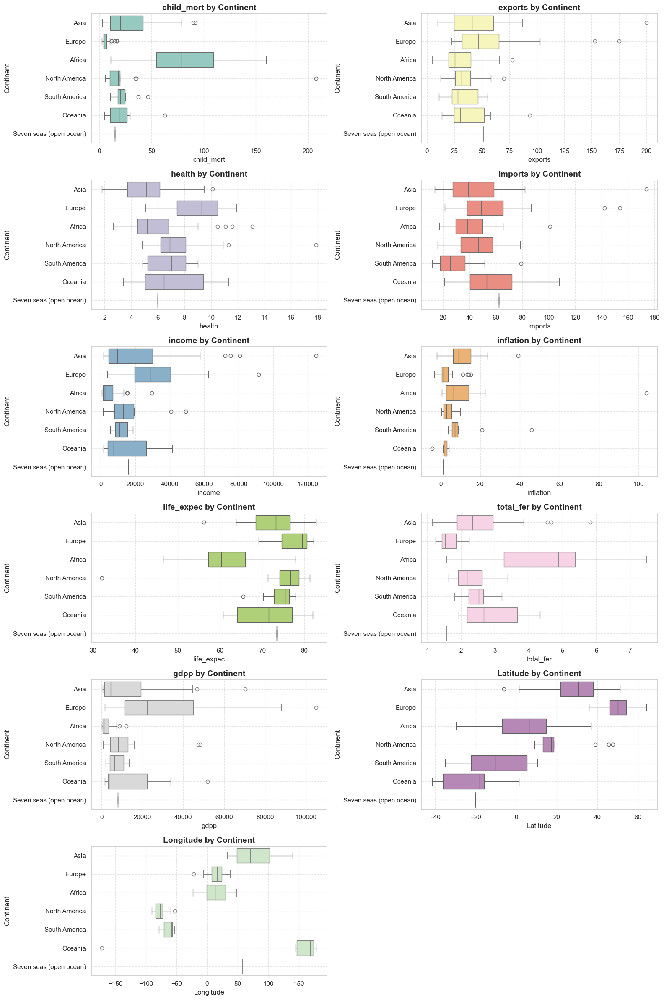

In [374]:
df_an=df.copy()
# df_an = df_an.drop(columns=['Country', 'Latitude','Longitude','rank_child_mort','rank_life_expec','Unnamed: 0.1', 'Unnamed: 0'])

sns.set(style="whitegrid")
numeric_features = df_an.select_dtypes(include='number').columns.tolist()
ncols = 2
nrows = math.ceil(len(numeric_features) / ncols)
colors = sns.color_palette("Set3", len(numeric_features))
fig, axes = plt.subplots(nrows, ncols, figsize=(16, 4*nrows))
axes = axes.flatten() 
for i, feature in enumerate(numeric_features):
    sns.boxplot(
        data=df_an, 
        x=feature, 
        y='continent', 
        orient='h', 
        color=colors[i], 
        ax=axes[i]
    )
    axes[i].set_title(f'{feature} by Continent', fontsize=14, fontweight='bold')
    axes[i].set_xlabel(feature, fontsize=12)
    axes[i].set_ylabel("Continent", fontsize=12)
    axes[i].grid(True, linestyle='--', alpha=0.5)

for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


توضیحات

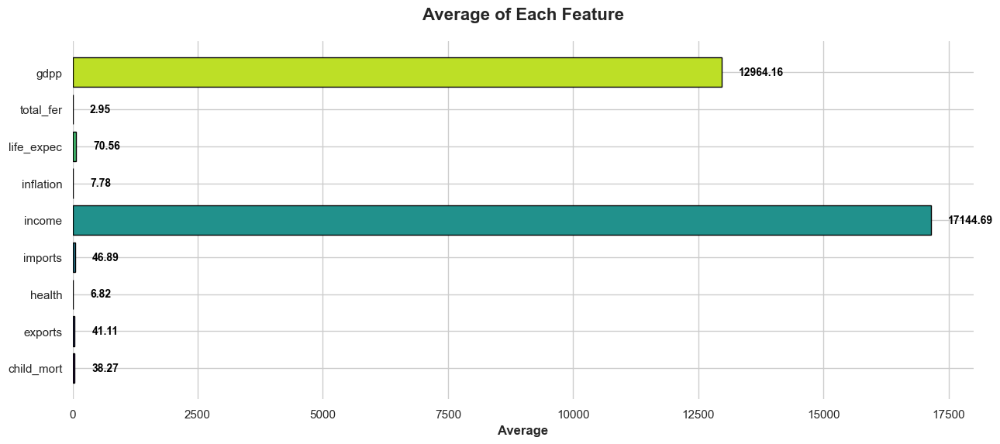

In [375]:

df_mean = numeric_df.mean()


sns.set(style="whitegrid")


fig, ax = plt.subplots(figsize=(15, 6))


colors = sns.color_palette("viridis", len(df_mean))
bars = ax.barh(df_mean.index, df_mean.values, color=colors, edgecolor='black')

for bar in bars:
    width = bar.get_width()
    ax.text(width + 0.02*max(df_mean.values), bar.get_y() + bar.get_height()/2,
            f'{width:.2f}', va='center', fontsize=10, fontweight='bold', color='black')


ax.set_xlabel('Average', fontsize=12, fontweight='bold')
ax.set_title('Average of Each Feature', fontsize=16, fontweight='bold', pad=20)
ax.tick_params(axis='y', labelsize=11)


sns.despine(left=True, bottom=True)

plt.show()


<title>Descriptive Analysis of Feature Means</title>
    <style>
        body {
            font-family: Arial, sans-serif;
            background-color:rgb(244, 244, 244);
            color: black;
            padding: 30px;
        }
        .container {
            background-color: #ffffff;
            border-radius: 12px;
            box-shadow: 0 6px 15px rgba(0,0,0,0.1);
            padding: 25px 30px;
            max-width: 800px;
            margin: auto;
            color: black;
        }
        h2 {
            text-align: center;
            font-weight: bold;
            margin-bottom: 20px;
        }
        ul {
            line-height: 1.8;
        }
        li {
            margin-bottom: 12px;
        }
        .feature {
            font-weight: bold;
        }
    </style>
    <div class="container">
        <h2>Descriptive Analysis of Feature Means</h2>
        <ul>
            <li style="background:#00a5b1; border-radius:20px;padding:10px"><span style="color:white;"   class="feature">gdpp (Gross Domestic Product per capita):</span> Very high. Indicates that, on average, countries have a relatively high economic level.</li>
            <li style="background:#00a5b1; border-radius:20px;padding:10px"><span style="color:white;" class="feature">income:</span> The highest mean value. Most countries have relatively high income, and this feature shows a wide range in the data.</li>
            <li style="background:#00a5b1; border-radius:20px;padding:10px"><span style="color:white;" class="feature">life_expec (Life expectancy):</span> Small but significant. On average, life expectancy is relatively good, but numerically much lower compared to income and GDP.</li>
            <li style="background:#00a5b1; border-radius:20px;padding:10px"><span style="color:white;" class="feature">inflation:</span> Very low mean. Most countries have inflation rates within small ranges.</li>
            <li style="background:#00a5b1; border-radius:20px;padding:10px"><span style="color:white;" class="feature">imports:</span> Low value. Countries have very low import volumes compared to production and income.</li>
            <li style="background:#00a5b1; border-radius:20px;padding:10px"><span style="color:white;" class="feature">health (Healthcare expenditure):</span> Low but notable. Healthcare spending is lower than other economic indicators.</li>
            <li style="background:#00a5b1; border-radius:20px;padding:10px"><span style="color:white;" class="feature">exports:</span> Similar to imports, low mean. Countries’ dependence on exports is moderate to low.</li>
            <li style="background:#00a5b1; border-radius:20px;padding:10px"><span style="color:white;" class="feature">child_mort (Child mortality):</span> Low, but still indicates some regions have healthcare challenges.</li>
            <li style="background:#00a5b1; border-radius:20px;padding:10px"><span style="color:white;" class="feature">total_fer (Total fertility rate):</span> Moderate value. Average number of children per family is at a balanced level.</li>
        </ul>
    </div>



In [376]:
analiz=df_an.copy()
analiz.drop(columns=["Longitude","Latitude"],inplace=True)

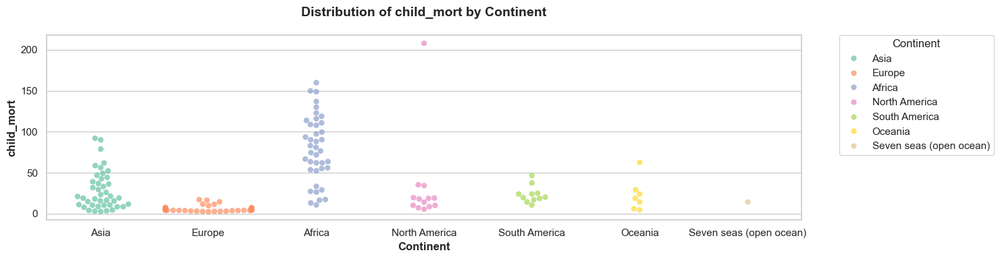

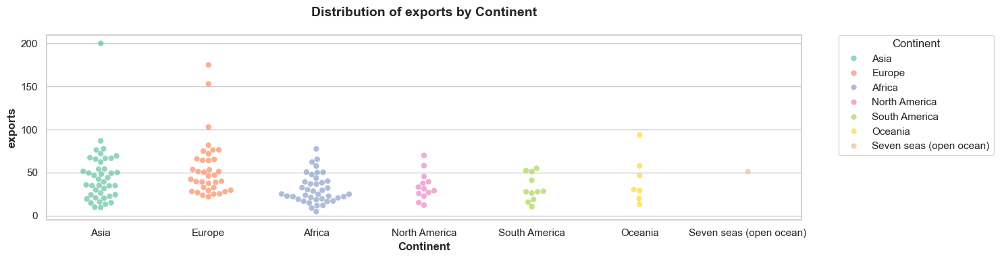

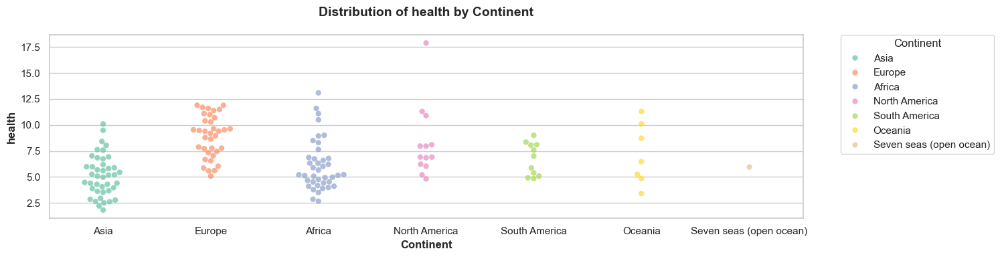

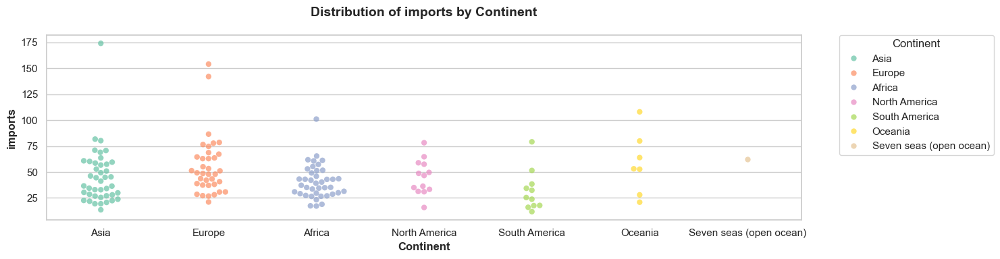

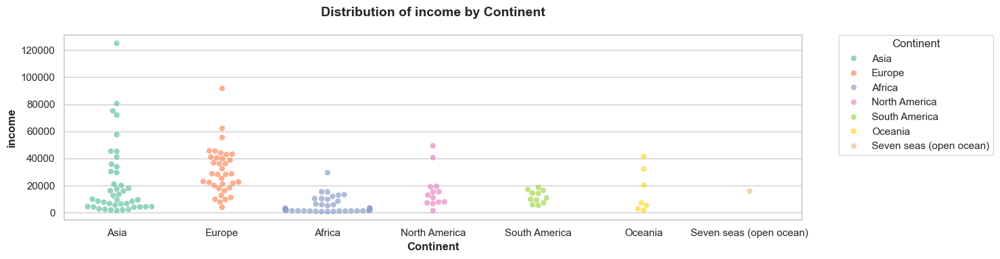

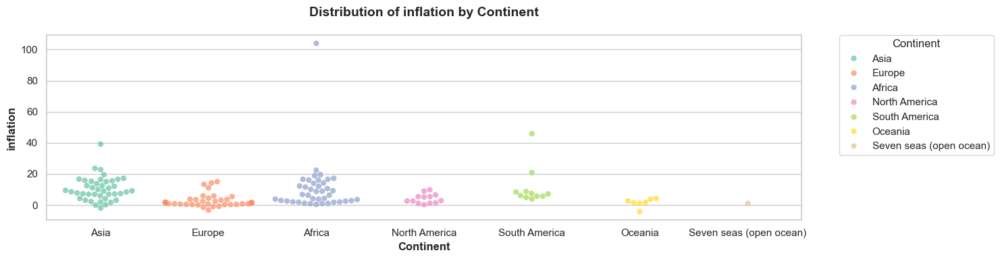

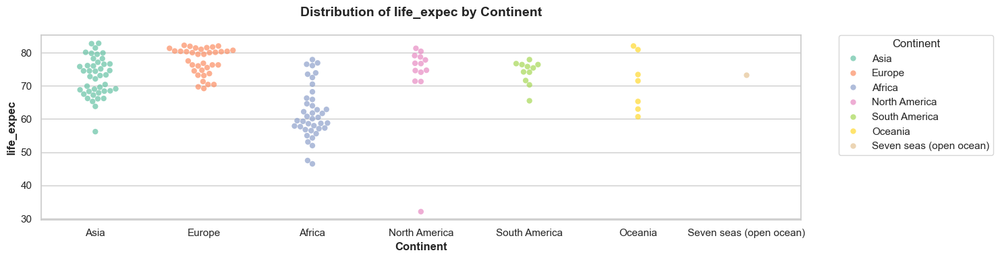

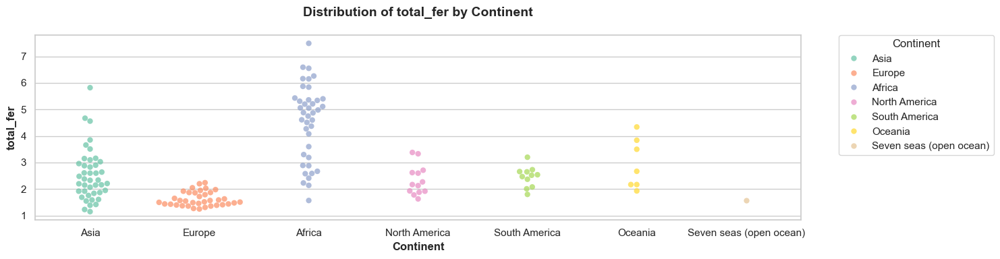

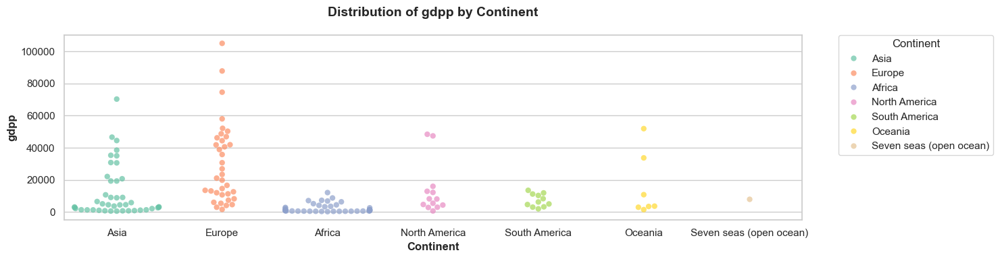

In [377]:


int_df = df_an.copy()
number_data = int_df.select_dtypes(include=["number"])
number_data.drop(columns=["Longitude","Latitude"],inplace=True)
sns.set_theme(style="whitegrid")

for x in number_data:
    plt.figure(figsize=(15,4))
    
    sns.swarmplot(
        x=analiz["continent"],
        y=number_data[x],
        hue=analiz["continent"],
        palette="Set2",
        size=6,
        alpha=0.7
    )
    
    plt.title(f"Distribution of {x} by Continent", fontsize=14, fontweight="bold", pad=20)
    plt.xlabel("Continent", fontsize=12, fontweight="bold")
    plt.ylabel(x, fontsize=12, fontweight="bold")
    
    plt.legend(
        loc="upper left",
        title="Continent",
        bbox_to_anchor=(1.05, 1),
        borderaxespad=0,
        frameon=True
    )
    
    plt.tight_layout()
    plt.show()


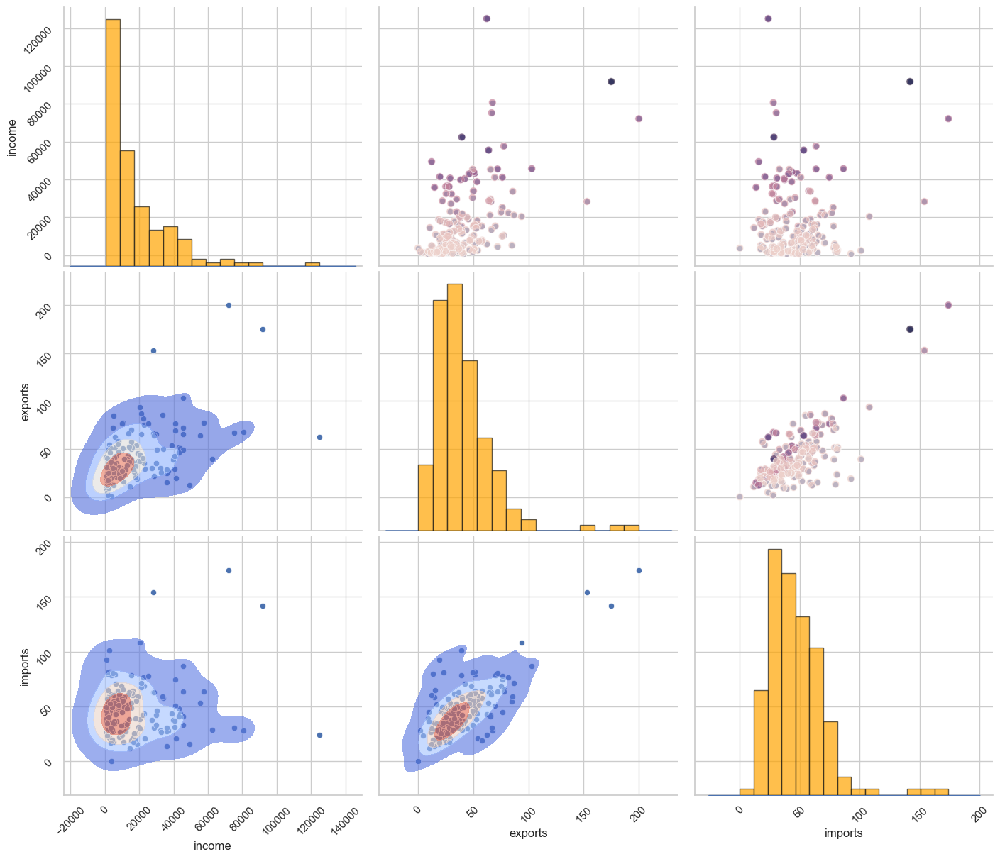

In [378]:

import warnings
warnings.filterwarnings("ignore")
new_df = pd.DataFrame(df, columns=['income','exports','imports'])


g = sns.pairplot(
    new_df,
    diag_kind="kde",
    height=4,   
    aspect=1.2,     
    corner=False, 
    palette="Set2"  
)


g.map_upper(sns.scatterplot, s=60, alpha=0.7,hue=df['gdpp'])

g.map_lower(sns.kdeplot, fill=True, cmap="coolwarm", thresh=0.05, levels=5, alpha=0.6)
g.map_diag(plt.hist, color="orange", alpha=0.7, bins=15, edgecolor="k")


for ax in g.axes.flatten():
    if ax is not None:
        ax.tick_params(labelrotation=45)

# plt.suptitle("Pairplot  و ", fontsize=18, y=1.02)
plt.show()


<p style="font-family: Arial, sans-serif;text-shadow:0px 0px 10px red; font-size: 23px; line-height: 1.6; color: white;">
  Specialized analysis will be conducted to examine each column and relationships, ultimately leading to a final conclusion. 
  <span style="font-size:18px;">🌸❤️</span>
</p>


<p style="color: white; text-shadow: 0px 0px 3px orange; font-size:18px;">
For the analysis, we will start with the child_mort column.😊
</p>



<h3>I want to take the analyses forward, one by one, according to these.   </h3>

<table border="1" cellpadding="8" cellspacing="0">
  <tr>
    <th>Feature</th>
    <th>correlation</th>
  </tr>
  <tr>
    <td>life_expec</td>
    <td>3.68</td>
  </tr>
  <tr>
    <td>child_mort</td>
    <td>3.68</td>
  </tr>
  <tr>
    <td>total_fer</td>
    <td>3.56</td>
  </tr>
  <tr>
    <td>gdpp</td>
    <td>3.54</td>
  </tr>
  <tr>
    <td>income</td>
    <td>3.45</td>
  </tr>
  <tr>
    <td>exports</td>
    <td>2.85</td>
  </tr>
  <tr>
    <td>inflation</td>
    <td>1.82</td>
  </tr>
  <tr>
    <td>imports</td>
    <td>1.66</td>
  </tr>
  <tr>
    <td>health</td>
    <td>1.55</td>
  </tr>
</table>


<div style="color: red; padding: 10px; text-align: center; height: 70px;">
    <div style="
    padding:0 50px 0 50px;
        margin: auto;
        width: fit-content;
        border-top-left-radius: 25px;
        background: black
        border-bottom-right-radius: 25px;
        border-top-right-radius: 50px;
        border-bottom-left-radius: 50px;
        color: #ffffff;
        height: 90%;
        font-size: 30px;
        line-height: 70px;
        box-shadow: 0 0 5px rgb(103, 39, 0), 0 0 15px #b3a400;
        font-family: 'Segoe UI', Tahoma, Geneva, Verdana, sans-serif;
        text-shadow: 1px 1px 3px black;
    ">
        child_mort
    </div>
</div>


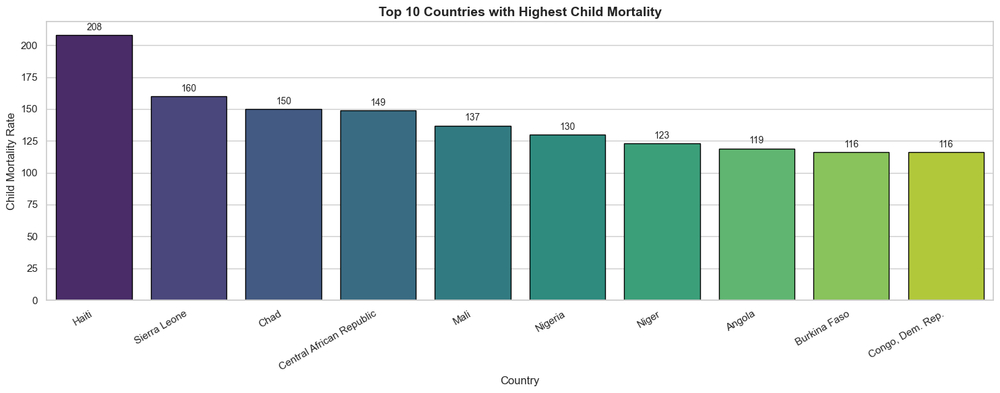

In [379]:

plt.figure(figsize=(15,6))
x = df.groupby("country")["child_mort"].max().sort_values(ascending=False)[:10]


palette = sns.color_palette("viridis", n_colors=len(x))

bars = sns.barplot(x=x.index, y=x.values, palette=palette)

for container in bars.containers:
    bars.bar_label(container, fontsize=10, padding=3)


for p in bars.patches:
    p.set_edgecolor("black")

plt.xticks(rotation=30, ha="right")
plt.title("Top 10 Countries with Highest Child Mortality", fontsize=14, weight="bold")
plt.xlabel("Country", fontsize=12)
plt.ylabel("Child Mortality Rate", fontsize=12)

plt.tight_layout()
plt.show()


<style>
:root{
  --bg: #0b1220;
  --accent: #7c3aed;
  --muted: #94a3b8;
  --text: #e6eef8;
}
.container{
  max-width:760px;
  margin:12px auto;
  padding:16px;
  border-radius:10px;
  background:linear-gradient(180deg, rgba(255,255,255,0.02), transparent);
  font-family: Inter, system-ui, "Segoe UI", Roboto, Arial;
  color:var(--text);
  border:1px solid rgba(124,58,237,0.06);
}
.h1{font-size:20px; font-weight:700; margin-bottom:8px}
.lead{background:rgba(124,58,237,0.04); padding:10px; border-radius:8px; margin-bottom:12px}
.ol{padding-left:18px}
.li{margin:8px 0; padding:10px; border-radius:8px; background:rgba(255,255,255,0.01)}
.note{color:var(--muted); font-size:13px; margin-top:10px}
.highlight{color:var(--accent); font-weight:700}
</style>

<div class="container">
  <div class="h1">Under-five child mortality </div>

  <div class="lead">
    I looked into which countries have the highest under-five child mortality rates per 1,000 live births. Below I list them in order and add a short note about the leading country.
  </div>

  <ol class="ol">
    <li class="li"><span class="highlight">Haiti</span> — about 208 deaths per 1,000 live births (≈20%). Haiti is an independent country in the Americas and has the highest rate on this list.</li>
    <li class="li">Sierra Leone</li>
    <li class="li">Chad</li>
    <li class="li">Central African Republic</li>
    <li class="li">Mali</li>
    <li class="li">Nigeria</li>
    <li class="li">Niger</li>
    <li class="li">Angola</li>
    <li class="li">Burkina Faso</li>
    <li class="li">Congo, Dem. Rep. (Democratic Republic of the Congo)</li>
  </ol>

  <div class="note">
    <strong>Note:</strong> All the countries listed above are located in <strong>Africa</strong>, <em>except</em> <strong>Haiti</strong>, which is in the Americas. Factors such as <strong>disease</strong>, <strong>malnutrition</strong>, and <strong>limited access to healthcare</strong> contribute to these high mortality rates.
  </div>
</div>



<p style="color: white; text-shadow: 0px 0px 3px purple; font-size:20px;border-top:10px solid purple">
</p>


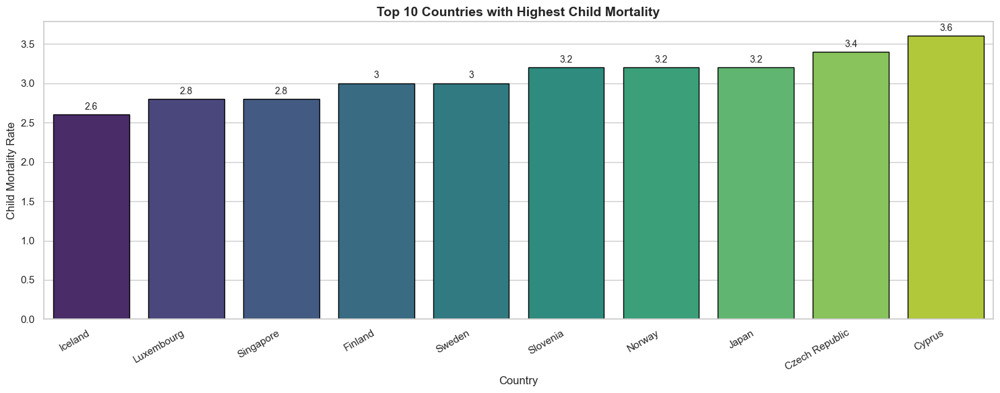

In [380]:

plt.figure(figsize=(15,6))
x = df.groupby("country")["child_mort"].max().sort_values(ascending=True)[:10]


palette = sns.color_palette("viridis", n_colors=len(x))

bars = sns.barplot(x=x.index, y=x.values, palette=palette)

for container in bars.containers:
    bars.bar_label(container, fontsize=10, padding=3)


for p in bars.patches:
    p.set_edgecolor("black")

plt.xticks(rotation=30, ha="right")
plt.title("Top 10 Countries with Highest Child Mortality", fontsize=14, weight="bold")
plt.xlabel("Country", fontsize=12)
plt.ylabel("Child Mortality Rate", fontsize=12)

plt.tight_layout()
plt.show()


<style>
:root{
  --bg: #0b1220;
  --accent: #7c3aed;
  --muted: #94a3b8;
  --text: #e6eef8;
}
.container{
  max-width:760px;
  margin:12px auto;
  padding:16px;
  border-radius:10px;
  background:linear-gradient(180deg, rgba(255,255,255,0.02), transparent);
  font-family: Inter, system-ui, "Segoe UI", Roboto, Arial;
  color:var(--text);
  border:1px solid rgba(124,58,237,0.06);
}
.h1{font-size:20px; font-weight:700; margin-bottom:8px}
.lead{background:rgba(124,58,237,0.04); padding:10px; border-radius:8px; margin-bottom:12px}
.ol{padding-left:18px}
.li{margin:8px 0; padding:10px; border-radius:8px; background:rgba(255,255,255,0.01)}
.note{color:var(--muted); font-size:13px; margin-top:10px}
.highlight{color:var(--accent); font-weight:700}
</style>

<div class="container">
  <div class="h1">Under-five child mortality</div>

  <div class="lead">
    The country with the lowest under-5 child mortality in this dataset is <span class="highlight">Iceland</span>, with a rate of <strong>2.6</strong>, which is located in <strong>Europe</strong>. The following ten countries represent those with the <strong>lowest child mortality rates</strong> in the dataset, sorted in ascending order. Notably, <strong>European countries dominate</strong> this list, showing the lowest child mortality among these ten nations:
  </div>

  <ol class="ol">
    <li class="li"><span class="highlight">Iceland</span> – Europe – 2.6</li>
    <li class="li"><span class="highlight">Luxembourg</span> – Europe – 2.8</li>
    <li class="li"><span class="highlight">Singapore</span> – Asia – 2.8</li>
    <li class="li"><span class="highlight">Finland</span> – Europe – 3.0</li>
    <li class="li"><span class="highlight">Sweden</span> – Europe – 3.0</li>
    <li class="li"><span class="highlight">Slovenia</span> – Europe – 3.2</li>
    <li class="li"><span class="highlight">Norway</span> – Europe – 3.2</li>
    <li class="li"><span class="highlight">Japan</span> – Asia – 3.2</li>
    <li class="li"><span class="highlight">Czech Republic</span> – Europe – 3.4</li>
    <li class="li"><span class="highlight">Cyprus</span> – Europe – 3.6</li>
  </ol>

  <div class="note">
    <strong>Note:</strong> European countries in this list show the lowest under-five child mortality rates among the top ten countries.
  </div>
</div>



<p style="color: white; text-shadow: 0px 0px 3px purple; font-size:20px;border-top:3px solid red">
Here, I have ranked these columns.⬇️
</p>


In [381]:
analiz1 = analiz.select_dtypes(include=["number"])
for x in analiz1:
    analiz = analiz.sort_values(by=x, ascending=False).reset_index(drop=True)
    analiz[f'rank_{x}'] = df.index + 1


analiz1 = df.select_dtypes(include=["number"])
for x in analiz1:
    df = df.sort_values(by=x, ascending=False).reset_index(drop=True)
    df[f'rank_{x}'] = df.index + 1

In [382]:
h = pd.DataFrame({
    'country': df["country"],
    'value': df["rank_child_mort"],
    'continent': df["continent"]  
})

fig = px.strip(h, x='value', hover_name='country', 
               title='"Ranking of countries by life expectancy and longevity', 
               stripmode='overlay', 
               color='continent')  

fig.update_traces(marker=dict(size=12, line=dict(width=1, color='DarkSlateGrey')))
fig.update_xaxes(dtick=5)
fig.show()






<p style="font-family: Arial, sans-serif;text-shadow:0px 0px 10px blue; font-size: 23px; line-height: 1.6; color: white;">
Here we can clearly see that the orange range is at the top ranks, which represents Africa — meaning these countries have the highest death rates. We also see that the pink range is at the bottom ranks, which represents Europe. Asia and America are positioned in the middle.
  <span style="font-size:18px;"></span>
</p>


In [383]:


continents = ["Asia", "Europe", "Africa", "North America", "South America", "Oceania"]
mean_child_mort = []

for cont in continents:
    mean_value = df[df["continent"] == cont]["child_mort"].mean()
    mean_child_mort.append(mean_value)

html_content = f"""
<div style='
    background-color:#0b1220; 
    color:#e6eef8; 
    padding:20px; 
    border-radius:15px; 
    font-family:sans-serif; 
    width:600px;
    box-shadow: 0 8px 16px rgba(0,0,0,0.3);
'>
<h2 style='color:#7c3aed; text-align:center;'>Average Child Mortality by Continent</h2>
<ul style='list-style:none; padding:0; font-size:16px;'>
"""
for cont, val in zip(continents, mean_child_mort):
    html_content += f"<li><strong>{cont}:</strong> {val:.2f}</li>"
html_content += "</ul></div>"

display(HTML(html_content))

fig = go.Figure(data=[go.Bar(
    x=continents,
    y=mean_child_mort,
    marker_color=['#7c3aed', '#e11d48', '#f97316', '#22d3ee', '#fde68a', '#34d399']
)])

fig.update_layout(
    title='Average Child Mortality by Continent',
    title_font_size=20,
    xaxis_title='Continent',
    yaxis_title='Average Child Mortality',
    template='plotly_dark',
    plot_bgcolor='#0b1220',
    paper_bgcolor='#0b1220',
    font=dict(color='white')
)

fig.show()


<p style="font-family: Arial, sans-serif;text-shadow:0px 0px 10px yellow; font-size: 23px; line-height: 1.6; color: black;">
Now let's see what columns are related to this.  
</p>


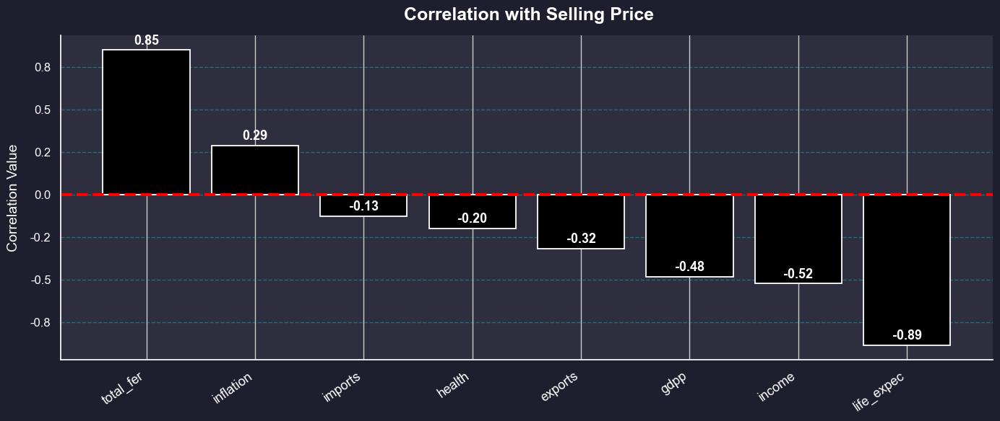

In [384]:

not_rank=analiz.iloc[:,:-9]

numeric_df = not_rank.select_dtypes(include='number')
correlations = numeric_df.corr()["child_mort"].drop("child_mort")
correlations = correlations.sort_values(ascending=False)

fig, ax = plt.subplots(figsize=(14, 6))
fig.patch.set_facecolor("#1e1e2f")
ax.set_facecolor("#2e2e3f")

bars = ax.bar(
    correlations.index,
    correlations.values,
    color="black",
    edgecolor='white',
    linewidth=1.3
)

for bar in bars:
    yval = bar.get_height()
    ax.text(
        bar.get_x() + bar.get_width()/2,
        yval + 0.015,
        f"{yval:.2f}",
        ha='center',
        va='bottom',
        fontsize=13,
        color='white',
        fontweight='bold'
    )

ax.set_xticks(range(len(correlations.index)))
ax.set_xticklabels(correlations.index, rotation=35, ha='right', fontsize=13, color='white')
ax.set_yticklabels([f"{y:.1f}" for y in ax.get_yticks()], fontsize=12, color='white')

ax.set_title(" Correlation with Selling Price", fontsize=18, color='white', pad=15, weight='bold')
ax.set_ylabel("Correlation Value", fontsize=14, color='white', labelpad=10)

ax.grid(axis='y', linestyle='--', alpha=0.3, color='cyan')
plt.axhline(0,color='red', linestyle='--', linewidth=3)
for spine in ['top', 'right']:
    ax.spines[spine].set_visible(False)

ax.spines['left'].set_color('white')
ax.spines['bottom'].set_color('white')

plt.tight_layout()
plt.show()



In [385]:
numeric_df = not_rank.select_dtypes(include='number')
correlations = numeric_df.corr()["child_mort"].drop("child_mort").sort_values(ascending=False)

corr_table = correlations.reset_index()
corr_table.columns = ["Column", "Correlation with child_mort"]
html_code = corr_table.to_html(index=False)


display(HTML(html_code))

Column,Correlation with child_mort
total_fer,0.848478
inflation,0.288276
imports,-0.127211
health,-0.200402
exports,-0.318093
gdpp,-0.483032
income,-0.524315
life_expec,-0.886676



  <style>
    body {margin:0;font-family:Arial, sans-serif;background:#0f172a;color:#fff;padding:20px}
    .card{background:rgba(255,255,255,0.05);border-radius:12px;padding:22px;max-width:720px;margin:auto;line-height:1.6}
    h2{margin-top:0;color:#ffefa6}
    .summary{background:rgba(255,255,255,0.08);padding:14px 16px;border-left:4px solid #ff7a18;
             border-radius:8px;margin-bottom:20px;font-size:15px;color:#f3f4f6}
    .summary b{color:#ffefa6}
    .bar{margin:12px 0;background:#222;border-radius:8px;overflow:hidden;position:relative;height:20px}
    .bar span{display:block;height:100%;border-radius:8px}
    .life{background:linear-gradient(90deg,#ffc371,#ff5f6d);width:88.7%}
    .fer{background:linear-gradient(90deg,#7ee8fa,#80ff72);width:84.8%}
    .income{background:linear-gradient(90deg,#a18cd1,#fbc2eb);width:52.4%}
    .gdpp{background:linear-gradient(90deg,#f68b1e,#f5af19);width:48.3%}
    .exports{background:linear-gradient(90deg,#4facfe,#00f2fe);width:31.8%}
    .label{margin-bottom:4px;font-size:14px;color:#eee;display:flex;justify-content:space-between}
    .val{color:#ffefa6;font-weight:bold}
  </style>

  <div class="card">
    <h2>Correlation with Child Mortality</h2>
    
  <div class="summary">
      We can see that the <b>life_expec</b> and <b>total_fer</b> columns are <b>highly correlated</b> and closely related.<br>
      Additionally, these columns show a <b>moderate correlation</b> with <b>income</b>, <b>gdpp</b>, and <b>exports</b>.<br>
      Next, we plan to examine these columns in detail to fully understand the information each one provides.
    </div>

  <div class="label"><span>life_expec</span><span class="val">-0.886676</span></div>
    <div class="bar"><span class="life"></span></div>

  <div class="label"><span>total_fer</span><span class="val">0.848478</span></div>
    <div class="bar"><span class="fer"></span></div>

  <div class="label"><span>income</span><span class="val">-0.524315</span></div>
    <div class="bar"><span class="income"></span></div>

  <div class="label"><span>gdpp</span><span class="val">-0.483032</span></div>
    <div class="bar"><span class="gdpp"></span></div>

   <div class="label"><span>exports</span><span class="val">-0.318093</span></div>
    <div class="bar"><span class="exports"></span></div>

  </div>



<p style="color:white; text-shadow: 0px 0px 2px green;box-shadow: 0px 0px 10px green;width:fit-content;padding:10px;border-radius:10px">
    Analyze the relationship between the <code>child_mort</code> column and other columns that have moderate to high correlation with it.
</p>


In [386]:
x = ["total_fer", "life_expec", "income", "gdpp", "exports"]
n = [0.848478, -0.886676, -0.524315, -0.483032, -0.318093]

html_code = """
<div style='
    background-color: #121212;
    border-radius: 16px;
    padding: 30px;
    box-shadow: 0 0 25px rgba(0,0,0,0.3);
    width: 95%;
    margin: 20px auto;
    display: grid;
    grid-template-columns: repeat(auto-fill, minmax(150px, 1fr));
    gap: 15px;
    font-family: "Segoe UI", Arial, sans-serif;
    color: white;
'>
"""

for i in range(len(x)):
    html_code += f"""
    <div style='
        background: linear-gradient(145deg, #1e1e2f, #2c2c44);
        color: #f1f1f1;
        padding: 18px;
        border-radius: 12px;
        font-size: 12px;
        font-weight: 500;
        box-shadow: 0 6px 12px rgba(0,0,0,0.25);
        text-align: center;
        display: flex;
        flex-direction: column;
        align-items: center;
        justify-content: center;
        height: 90px;
        transition: all 0.3s ease;
    '
    onmouseover="this.style.transform='scale(1.05)'; this.style.fontSize='15px'; this.style.background='linear-gradient(145deg,#3a3a6a,#5050a1)';"
    onmouseout="this.style.transform='scale(1)'; this.style.fontSize='12px'; this.style.background='linear-gradient(145deg,#1e1e2f,#2c2c44)';">
        <strong>{x[i]}</strong>
        <br>
        <strong style="color:green;font-size:15px">{n[i]:.3f}</strong>
    </div>
    """

html_code += "</div>"

from IPython.display import display, HTML
display(HTML(html_code))


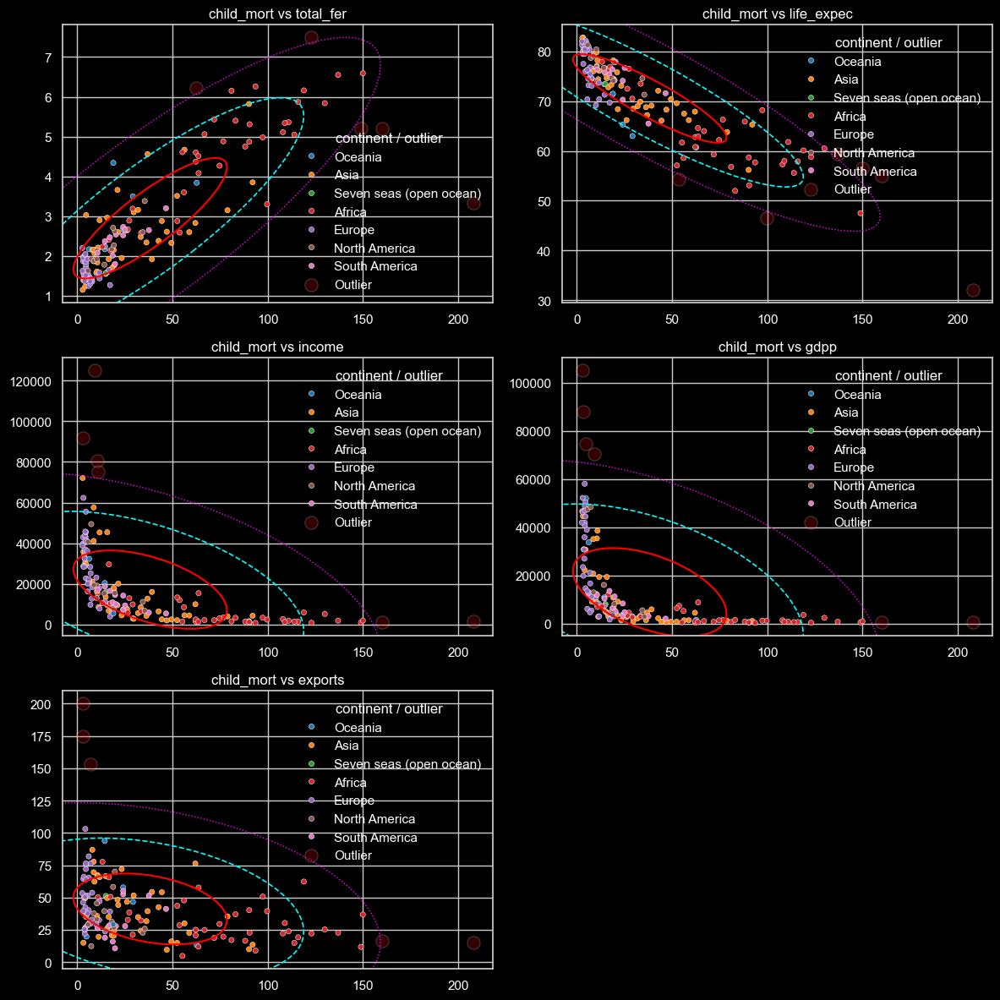

In [387]:

def confidence_ellipse(x, y, ax, n_std=3.0, facecolor='none', **kwargs):
    cov = np.cov(x, y)
    pearson = cov[0, 1] / np.sqrt(cov[0, 0] * cov[1, 1])
    
    ell_radius_x = np.sqrt(1 + pearson)
    ell_radius_y = np.sqrt(1 - pearson)
    ellipse = Ellipse((0, 0), width=ell_radius_x * 2, height=ell_radius_y * 2,
                      facecolor=facecolor, **kwargs)

    scale_x = np.sqrt(cov[0, 0]) * n_std
    mean_x = np.mean(x)
    scale_y = np.sqrt(cov[1, 1]) * n_std
    mean_y = np.mean(y)

    transf = transforms.Affine2D().rotate_deg(45).scale(scale_x, scale_y).translate(mean_x, mean_y)
    ellipse.set_transform(transf + ax.transData)
    return ax.add_patch(ellipse)


arr = ["total_fer", "life_expec", "income", "gdpp", "exports"]
n = len(arr)
cols = 2
rows = (n + 1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(12, rows*4))
fig.patch.set_facecolor("black")
axes = axes.flatten()

for i, x in enumerate(arr):

    x_data = df['child_mort'].values
    y_data = df[x].values
    

    mean_x = np.mean(x_data)
    mean_y = np.mean(y_data)
    cov = np.cov(x_data, y_data)
    diff = np.column_stack((x_data - mean_x, y_data - mean_y))
    
    inv_cov = np.linalg.inv(cov)
    mahalanobis_dist = np.array([d.T @ inv_cov @ d for d in diff])
    outliers = mahalanobis_dist > 3**2  


    sns.scatterplot(
        x=x_data[~outliers],
        y=y_data[~outliers],
        hue=df['continent'][~outliers],
        palette='tab10',
        s=20,
        ax=axes[i],
        legend='full'
    )


    sns.scatterplot(
        x=x_data[outliers],
        y=y_data[outliers],
        color='red', 
        edgecolor='white',
        alpha=0.2,
        s=120,
        ax=axes[i],
        label='Outlier'
    )

   
    confidence_ellipse(x_data, y_data, axes[i], n_std=1, edgecolor='red', linewidth=1.5)
    confidence_ellipse(x_data, y_data, axes[i], n_std=2, edgecolor='cyan', linestyle='--', linewidth=1.2)
    confidence_ellipse(x_data, y_data, axes[i], n_std=3, edgecolor='magenta', linestyle=':', linewidth=1)

    axes[i].set_facecolor("black")
    axes[i].set_title(f'child_mort vs {x}', fontsize=12, color='white')
    axes[i].tick_params(colors='white')
    axes[i].xaxis.label.set_color('white')
    axes[i].yaxis.label.set_color('white')

    legend = axes[i].legend()
    legend.set_title("continent / outlier")
    plt.setp(legend.get_texts(), color='white')
    plt.setp(legend.get_title(), color='white')
    legend.get_frame().set_facecolor('black') 
    legend.get_frame().set_edgecolor('white') 


for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


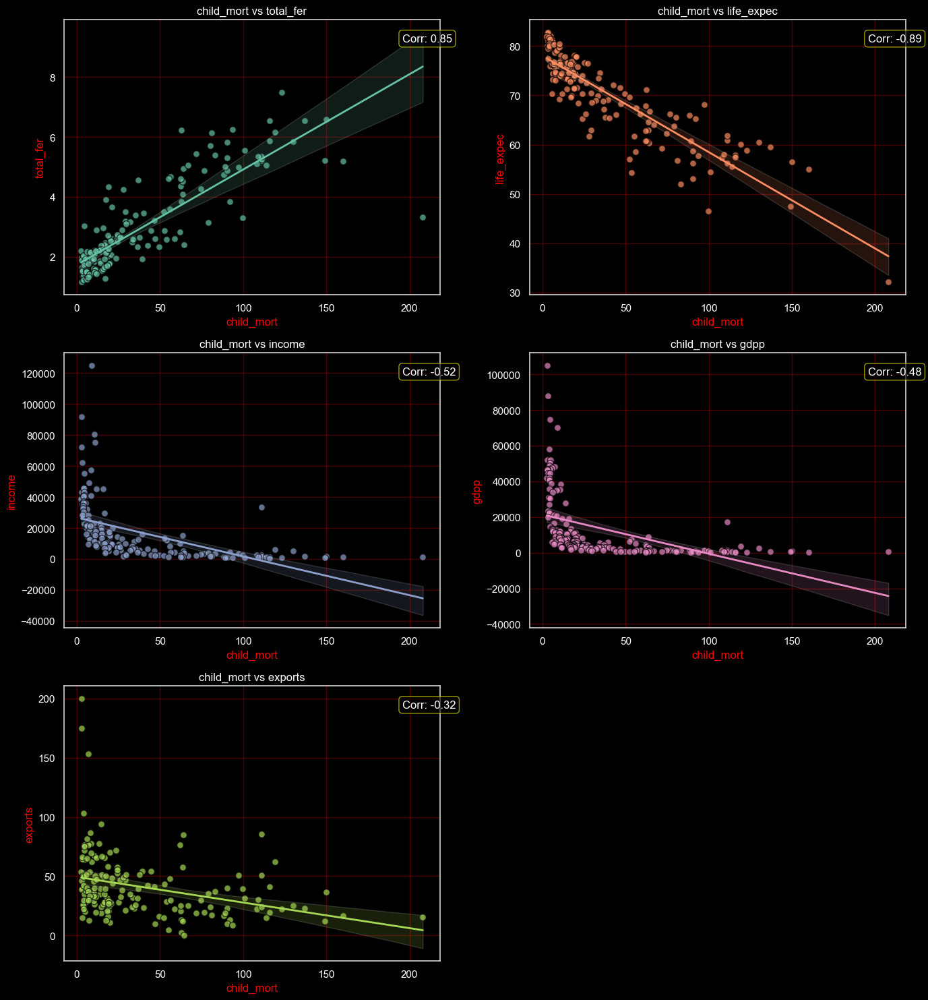

In [388]:
arr1=["total_fer", "life_expec", "income", "gdpp", "exports"]
correlations = [0.848478, -0.886676, -0.524315, -0.483032, -0.318093]
cols = [c for c in numeric_df[arr1] if c not in ["child_mort"]]

ncols = 2
nrows = (len(cols) + 1) // ncols


colors = sns.color_palette("Set2", len(cols))

fig, axes = plt.subplots(nrows, ncols, figsize=(14, 5*nrows))
axes = axes.flatten()

for i, x in enumerate(cols):
    ax = axes[i]
    color = colors[i % len(colors)] 
    ax.text(
        0.9, 0.95, f"Corr: {correlations[i]:.2f}", 
        transform=ax.transAxes,
        fontsize=12, color="white",
        ha="left", va="top",
        bbox=dict(facecolor="black", alpha=0.6, boxstyle="round,pad=0.3",edgecolor="yellow")
    )

    sns.regplot(
        data=numeric_df, x="child_mort", y=x,
        scatter_kws={'alpha':0.7, 's':50, 'color':color, 'edgecolor':'black'},
        line_kws={'color':color, 'linewidth':2},
        ax=ax
    )
    ax.set_xlabel("child_mort", color="red", fontsize=12)
    ax.set_ylabel(x, color="red", fontsize=12)
    ax.set_facecolor("black")
    ax.set_title(f"child_mort vs {x}", color="white")
    ax.grid(alpha=0.3, color="red")
    ax.tick_params(axis='y',colors="white")
    ax.tick_params(axis='x', colors="white")



for j in range(len(cols), len(axes)):
    axes[j].set_visible(False)

fig.patch.set_facecolor("black")
plt.tight_layout()
plt.show()



<p style=" box-shadow: 0px 0px 15px purple;border-top:20px solid white">
</p>


<div style="color: red; padding: 10px; text-align: center; height: 70px;">
    <div style="
    padding:0 50px 0 50px;
        margin: auto;
        width: fit-content;
        border-top-left-radius: 25px;
        background: black
        border-bottom-right-radius: 25px;
        border-top-right-radius: 50px;
        border-bottom-left-radius: 50px;
        color: #ffffff;
        height: 90%;
        font-size: 30px;
        line-height: 70px;
        box-shadow: 0 0 5px rgb(103, 0, 0), 0 0 15px rgb(179, 0, 0);
        font-family: 'Segoe UI', Tahoma, Geneva, Verdana, sans-serif;
        text-shadow: 1px 1px 3px black;
    ">
        life_expec
    </div>
</div>


In [389]:

x_low = df.groupby(["country", "continent"])["life_expec"].max().reset_index().sort_values("life_expec", ascending=True).head(20)
x_high = df.groupby(["country", "continent"])["life_expec"].max().reset_index().sort_values("life_expec", ascending=False).head(20)


warm_palette_low = ["#78001C", "#F00000", "#FFC300"]
warm_palette_high = ["#460075", "#00D0F0", "#00FF4C"]

fig_low = px.bar(
    x_low,
    x="life_expec",
    y="country",
    color="continent",
    orientation="h",
    color_discrete_sequence=warm_palette_low,
    title="Top 10 Countries with Lowest Life Expectancy"
)
fig_low.update_traces(marker=dict(line=dict(width=1, color="black")))
fig_low.update_layout(
    xaxis_title="Life Expectancy",
    yaxis_title="Country",
    title_font=dict(size=16, family="Arial", color="black"),
    xaxis=dict(tickangle=30)
)


fig_high = px.bar(
    x_high,
    x="life_expec",
    y="country",
    color="continent",
    orientation="h",
    color_discrete_sequence=warm_palette_high,
    title="Top 10 Countries with Highest Life Expectancy"
)
fig_high.update_traces(marker=dict(line=dict(width=1, color="black")))
fig_high.update_layout(
    xaxis_title="Life Expectancy",
    yaxis_title="Country",
    title_font=dict(size=16, family="Arial", color="black"),
    xaxis=dict(tickangle=30)
)


from plotly.subplots import make_subplots
import plotly.graph_objects as go

fig = make_subplots(rows=1, cols=2, subplot_titles=(
    "Top 10 Countries with Lowest Life Expectancy",
    "Top 10 Countries with Highest Life Expectancy"
))

for trace in fig_low.data:
    fig.add_trace(trace, row=1, col=1)

for trace in fig_high.data:
    fig.add_trace(trace, row=1, col=2)

fig.update_layout(
    height=600, width=1200,
    showlegend=True,
    title_text="Comparison of Life Expectancy Across Countries"
)

fig.show()



<p style="color: white; text-shadow: 0px 0px 3px purple; font-size:20px;border-top:3px solid blue">
Here, I have ranked these columns.⬇️
</p>


In [390]:

df = df.sort_values(by='life_expec', ascending=False).reset_index(drop=True)
df['rank_life_expec'] = df.index + 1

In [391]:
h = pd.DataFrame({
    'country': df["country"],
    'value': df["rank_life_expec"],
    'continent': df["continent"]  
})

fig = px.strip(h, x='value', hover_name='country', 
               title='"Ranking of countries by life expectancy and longevity', 
               stripmode='overlay', 
               color='continent')  

fig.update_traces(marker=dict(size=12, line=dict(width=1, color='DarkSlateGrey')))
fig.update_xaxes(dtick=5)
fig.show()


In [392]:


continents = ["Asia", "Europe", "Africa", "North America", "South America", "Oceania"]
mean_life_expec = []

for cont in continents:
    mean_value = df[df["continent"] == cont]["life_expec"].mean()
    mean_life_expec.append(mean_value)

html_content = f"""
<div style='
    background-color:#0b1220; 
    color:#e6eef8; 
    padding:20px; 
    border-radius:15px; 
    font-family:sans-serif; 
    width:600px;
    box-shadow: 0 8px 16px rgba(0,0,0,0.3);
'>
<h2 style='color:#7c3aed; text-align:center;'>Average Child Mortality by Continent</h2>
<ul style='list-style:none; padding:0; font-size:16px;'>
"""
for cont, val in zip(continents, mean_life_expec):
    html_content += f"<li><strong>{cont}:</strong> {val:.2f}</li>"
html_content += "</ul></div>"

display(HTML(html_content))

fig = go.Figure(data=[go.Bar(
    x=continents,
    y=mean_life_expec,
    marker_color=['#7c3aed', '#e11d48', '#f97316', '#22d3ee', '#fde68a', '#34d399']
)])

fig.update_layout(
    title='Average Child Mortality by Continent',
    title_font_size=20,
    xaxis_title='Continent',
    yaxis_title='Average Child Mortality',
    template='plotly_dark',
    plot_bgcolor='#0b1220',
    paper_bgcolor='#0b1220',
    font=dict(color='white')
)

fig.show()


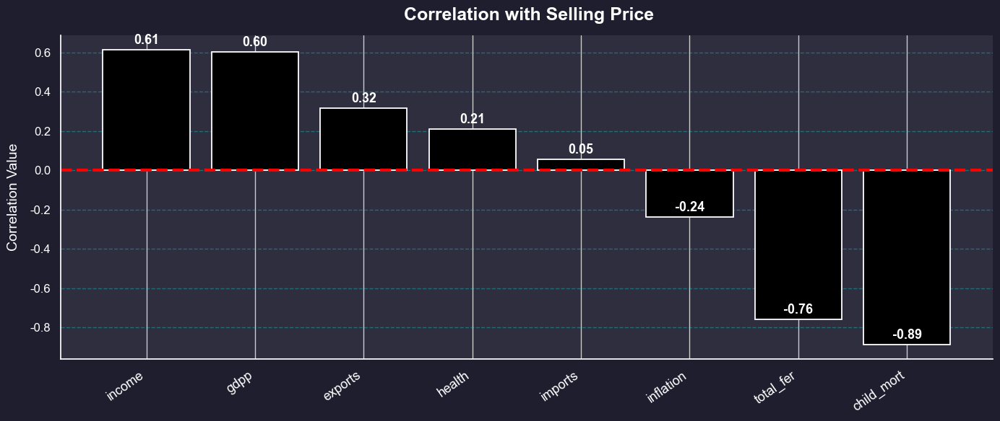

In [393]:

not_rank=analiz.iloc[:,:-9]

numeric_df = not_rank.select_dtypes(include='number')
correlations = numeric_df.corr()["life_expec"].drop("life_expec")
correlations = correlations.sort_values(ascending=False)

fig, ax = plt.subplots(figsize=(14, 6))
fig.patch.set_facecolor("#1e1e2f")
ax.set_facecolor("#2e2e3f")

bars = ax.bar(
    correlations.index,
    correlations.values,
    color="black",
    edgecolor='white',
    linewidth=1.3
)

for bar in bars:
    yval = bar.get_height()
    ax.text(
        bar.get_x() + bar.get_width()/2,
        yval + 0.015,
        f"{yval:.2f}",
        ha='center',
        va='bottom',
        fontsize=13,
        color='white',
        fontweight='bold'
    )

ax.set_xticks(range(len(correlations.index)))
ax.set_xticklabels(correlations.index, rotation=35, ha='right', fontsize=13, color='white')
ax.set_yticklabels([f"{y:.1f}" for y in ax.get_yticks()], fontsize=12, color='white')

ax.set_title(" Correlation with Selling Price", fontsize=18, color='white', pad=15, weight='bold')
ax.set_ylabel("Correlation Value", fontsize=14, color='white', labelpad=10)

ax.grid(axis='y', linestyle='--', alpha=0.3, color='cyan')
plt.axhline(0,color='red', linestyle='--', linewidth=3)
for spine in ['top', 'right']:
    ax.spines[spine].set_visible(False)

ax.spines['left'].set_color('white')
ax.spines['bottom'].set_color('white')

plt.tight_layout()
plt.show()



In [394]:
numeric_df = not_rank.select_dtypes(include='number')
correlations = numeric_df.corr()["life_expec"].drop("life_expec").sort_values(ascending=False)

corr_table = correlations.reset_index()
corr_table.columns = ["Column", "Correlation with life_expec"]
html_code = corr_table.to_html(index=False)


display(HTML(html_code))

Column,Correlation with life_expec
income,0.611962
gdpp,0.600089
exports,0.316313
health,0.210692
imports,0.054391
inflation,-0.239705
total_fer,-0.760875
child_mort,-0.886676



<div style='
    background-color:#0b1220;
    color:#e6eef8;
    padding:25px;
    border-radius:15px;
    font-family:sans-serif;
    width:700px;
    box-shadow: 0 10px 25px rgba(0,0,0,0.4);
    line-height:1.6;
'>
<h2 style='color:#7c3aed; text-align:center; margin-bottom:15px;'>Life Expectancy & Child Mortality</h2>
<p style='font-size:16px;'>
The <strong>life_expec</strong> column represents the life expectancy at birth, i.e., the average number of years people in a country are expected to live. This metric is an indicator of the quality of life, healthcare level, and socio-economic conditions.
</p>
<p style='font-size:16px;'>
Based on the dataset, there is a clear relationship between <strong>life_expec</strong> (life expectancy) and <strong>child_mort</strong> (under-5 child mortality rate). Generally, countries with higher life expectancy (e.g., Iceland with 82 years or Japan with 82.8 years) tend to have lower child mortality rates (e.g., Iceland with 2.6 or Japan with 3.2). Conversely, countries with lower life expectancy (e.g., Haiti with 32.1 years or Central African Republic with 47.5 years) have higher child mortality rates (e.g., Haiti with 208 or Central African Republic with 149).
</p>
</div>



<p style="color:white; text-shadow: 0px 0px 2px green;box-shadow: 0px 0px 10px green;width:fit-content;padding:10px;border-radius:10px">
    Analyze the relationship between the <code>life_expec</code> column and other columns that have moderate to high correlation with it.
</p>


In [395]:
x=["income","child_mort","total_fer","gdpp","exports"]
n = [0.611962, -0.886676, -0.760875, 0.600089, 0.316313]

html_code = """
<div style='
    background-color: #121212;
    border-radius: 16px;
    padding: 30px;
    box-shadow: 0 0 25px rgba(0,0,0,0.3);
    width: 95%;
    margin: 20px auto;
    display: grid;
    grid-template-columns: repeat(auto-fill, minmax(150px, 1fr));
    gap: 15px;
    font-family: "Segoe UI", Arial, sans-serif;
    color: white;
'>
"""

for i in range(len(x)):
    html_code += f"""
    <div style='
        background: linear-gradient(145deg, #1e1e2f, #2c2c44);
        color: #f1f1f1;
        padding: 18px;
        border-radius: 12px;
        font-size: 12px;
        font-weight: 500;
        box-shadow: 0 6px 12px rgba(0,0,0,0.25);
        text-align: center;
        display: flex;
        flex-direction: column;
        align-items: center;
        justify-content: center;
        height: 90px;
        transition: all 0.3s ease;
    '
    onmouseover="this.style.transform='scale(1.05)'; this.style.fontSize='15px'; this.style.background='linear-gradient(145deg,#3a3a6a,#5050a1)';"
    onmouseout="this.style.transform='scale(1)'; this.style.fontSize='12px'; this.style.background='linear-gradient(145deg,#1e1e2f,#2c2c44)';">
        <strong>{x[i]}</strong>
        <br>
        <strong style="color:green;font-size:15px">{n[i]:.3f}</strong>
    </div>
    """

html_code += "</div>"

from IPython.display import display, HTML
display(HTML(html_code))


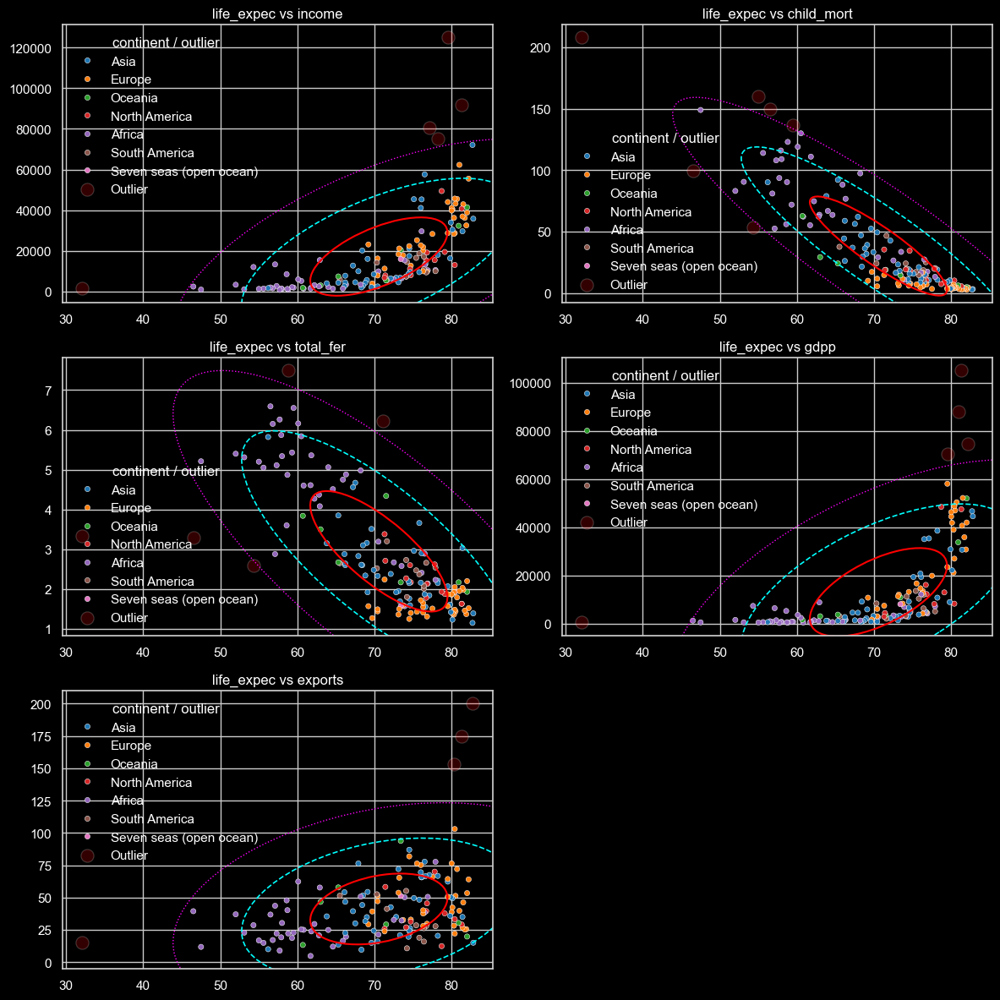

In [396]:

def confidence_ellipse(x, y, ax, n_std=3.0, facecolor='none', **kwargs):
    cov = np.cov(x, y)
    pearson = cov[0, 1] / np.sqrt(cov[0, 0] * cov[1, 1])
    
    ell_radius_x = np.sqrt(1 + pearson)
    ell_radius_y = np.sqrt(1 - pearson)
    ellipse = Ellipse((0, 0), width=ell_radius_x * 2, height=ell_radius_y * 2,
                      facecolor=facecolor, **kwargs)

    scale_x = np.sqrt(cov[0, 0]) * n_std
    mean_x = np.mean(x)
    scale_y = np.sqrt(cov[1, 1]) * n_std
    mean_y = np.mean(y)

    transf = transforms.Affine2D().rotate_deg(45).scale(scale_x, scale_y).translate(mean_x, mean_y)
    ellipse.set_transform(transf + ax.transData)
    return ax.add_patch(ellipse)


arr = ["income","child_mort","total_fer","gdpp","exports"]
n = len(arr)
cols = 2
rows = (n + 1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(12, rows*4))
fig.patch.set_facecolor("black")
axes = axes.flatten()

for i, x in enumerate(arr):

    x_data = df['life_expec'].values
    y_data = df[x].values
    

    mean_x = np.mean(x_data)
    mean_y = np.mean(y_data)
    cov = np.cov(x_data, y_data)
    diff = np.column_stack((x_data - mean_x, y_data - mean_y))
    
    inv_cov = np.linalg.inv(cov)
    mahalanobis_dist = np.array([d.T @ inv_cov @ d for d in diff])
    outliers = mahalanobis_dist > 3**2  


    sns.scatterplot(
        x=x_data[~outliers],
        y=y_data[~outliers],
        hue=df['continent'][~outliers],
        palette='tab10',
        s=20,
        ax=axes[i],
        legend='full'
    )


    sns.scatterplot(
        x=x_data[outliers],
        y=y_data[outliers],
        color='red', 
        edgecolor='white',
        alpha=0.2,
        s=120,
        ax=axes[i],
        label='Outlier'
    )

   
    confidence_ellipse(x_data, y_data, axes[i], n_std=1, edgecolor='red', linewidth=1.5)
    confidence_ellipse(x_data, y_data, axes[i], n_std=2, edgecolor='cyan', linestyle='--', linewidth=1.2)
    confidence_ellipse(x_data, y_data, axes[i], n_std=3, edgecolor='magenta', linestyle=':', linewidth=1)

    axes[i].set_facecolor("black")
    axes[i].set_title(f'life_expec vs {x}', fontsize=12, color='white')
    axes[i].tick_params(colors='white')
    axes[i].xaxis.label.set_color('white')
    axes[i].yaxis.label.set_color('white')

    legend = axes[i].legend()
    legend.set_title("continent / outlier")
    plt.setp(legend.get_texts(), color='white')
    plt.setp(legend.get_title(), color='white')
    legend.get_frame().set_facecolor('black') 
    legend.get_frame().set_edgecolor('white') 


for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


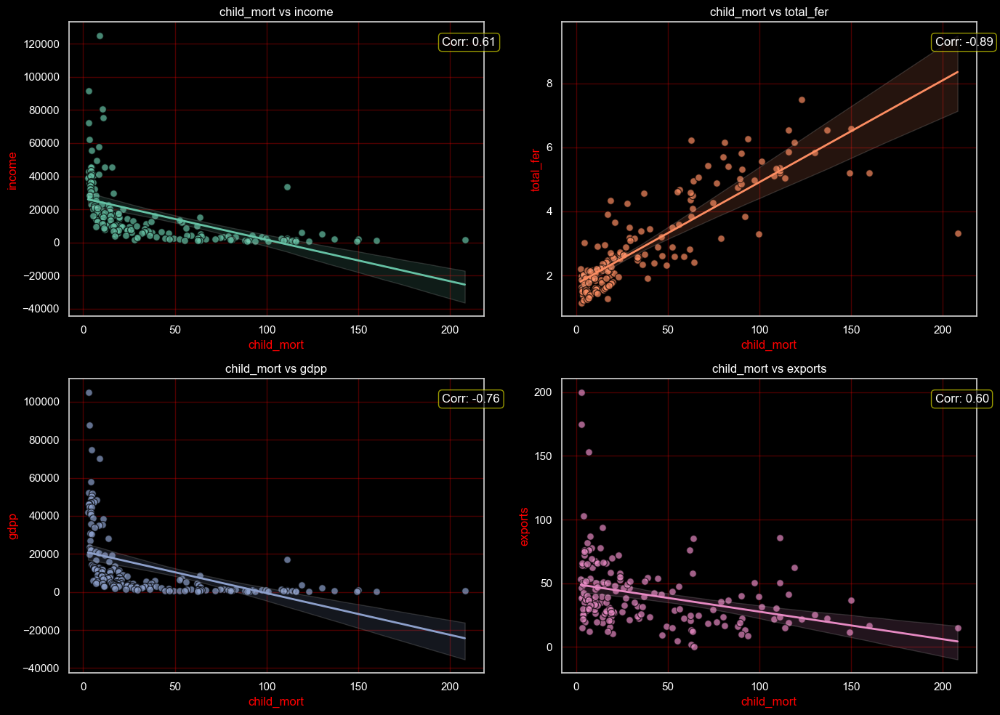

In [397]:
arr1=["income","child_mort","total_fer","gdpp","exports"]
correlations = [0.611962, -0.886676, -0.760875, 0.600089, 0.3163133]
cols = [c for c in numeric_df[arr1] if c not in ["child_mort"]]

ncols = 2
nrows = (len(cols) + 1) // ncols


colors = sns.color_palette("Set2", len(cols))

fig, axes = plt.subplots(nrows, ncols, figsize=(14, 5*nrows))
axes = axes.flatten()

for i, x in enumerate(cols):
    ax = axes[i]
    color = colors[i % len(colors)] 
    ax.text(
        0.9, 0.95, f"Corr: {correlations[i]:.2f}", 
        transform=ax.transAxes,
        fontsize=12, color="white",
        ha="left", va="top",
        bbox=dict(facecolor="black", alpha=0.6, boxstyle="round,pad=0.3",edgecolor="yellow")
    )

    sns.regplot(
        data=numeric_df, x="child_mort", y=x,
        scatter_kws={'alpha':0.7, 's':50, 'color':color, 'edgecolor':'black'},
        line_kws={'color':color, 'linewidth':2},
        ax=ax
    )
    ax.set_xlabel("child_mort", color="red", fontsize=12)
    ax.set_ylabel(x, color="red", fontsize=12)
    ax.set_facecolor("black")
    ax.set_title(f"child_mort vs {x}", color="white")
    ax.grid(alpha=0.3, color="red")
    ax.tick_params(axis='y',colors="white")
    ax.tick_params(axis='x', colors="white")



for j in range(len(cols), len(axes)):
    axes[j].set_visible(False)

fig.patch.set_facecolor("black")
plt.tight_layout()
plt.show()



<p style=" box-shadow: 0px 0px 15px purple;border-top:20px solid white">
</p>



<div style="color: red; padding: 10px; text-align: center; height: 70px;">
    <div style="
    padding:0 50px 0 50px;
        margin: auto;
        width: fit-content;
        border-top-left-radius: 25px;
        background: black
        border-bottom-right-radius: 25px;
        border-top-right-radius: 50px;
        border-bottom-left-radius: 50px;
        color: #ffffff;
        height: 90%;
        font-size: 30px;
        line-height: 70px;
        box-shadow: 0 0 5px rgb(103, 0, 0), 0 0 15px rgb(179, 0, 0);
        font-family: 'Segoe UI', Tahoma, Geneva, Verdana, sans-serif;
        text-shadow: 1px 1px 3px black;
    ">
         total_fer

    </div>
</div>


<div style="box-shadow:0 0 10px red;padding:5px;width:fit-content;">
    <strong style="color:red;">total_fer:</strong> Total Fertility Rate (number of children per woman). 
    This indicator shows the average number of children a woman would have over her reproductive lifetime.
</div>


In [398]:

x_low = df.groupby(["country", "continent"])["total_fer"].max().reset_index().sort_values("total_fer", ascending=True).head(20)
x_high = df.groupby(["country", "continent"])["total_fer"].max().reset_index().sort_values("total_fer", ascending=False).head(20)


warm_palette_low = ["#78001C", "#F00000", "#FFC300"]
warm_palette_high = ["#460075", "#00D0F0", "#00FF4C"]

fig_low = px.bar(
    x_low,
    x="total_fer",
    y="country",
    color="continent",
    orientation="h",
    color_discrete_sequence=warm_palette_low,
    title="Top 10 Countries with Lowest Life Expectancy"
)
fig_low.update_traces(marker=dict(line=dict(width=1, color="black")))
fig_low.update_layout(
    xaxis_title="Life Expectancy",
    yaxis_title="Country",
    title_font=dict(size=16, family="Arial", color="black"),
    xaxis=dict(tickangle=30)
)


fig_high = px.bar(
    x_high,
    x="total_fer",
    y="country",
    color="continent",
    orientation="h",
    color_discrete_sequence=warm_palette_high,
    title="Top 10 Countries with Highest Life Expectancy"
)
fig_high.update_traces(marker=dict(line=dict(width=1, color="black")))
fig_high.update_layout(
    xaxis_title="Life Expectancy",
    yaxis_title="Country",
    title_font=dict(size=16, family="Arial", color="black"),
    xaxis=dict(tickangle=30)
)


from plotly.subplots import make_subplots
import plotly.graph_objects as go

fig = make_subplots(rows=1, cols=2, subplot_titles=(
    "Top 10 Countries with Lowest Life Expectancy",
    "Top 10 Countries with Highest Life Expectancy"
))

for trace in fig_low.data:
    fig.add_trace(trace, row=1, col=1)

for trace in fig_high.data:
    fig.add_trace(trace, row=1, col=2)

fig.update_layout(
    height=600, width=1200,
    showlegend=True,
    title_text="Comparison of Life Expectancy Across Countries"
)

fig.show()


In [399]:
h = pd.DataFrame({
    'country': df["country"],
    'value': df["rank_total_fer"],
    'continent': df["continent"]  
})

fig = px.strip(h, x='value', hover_name='country', 
               title='"Ranking of countries by life expectancy and longevity', 
               stripmode='overlay', 
               color='continent')  

fig.update_traces(marker=dict(size=12, line=dict(width=1, color='DarkSlateGrey')))
fig.update_xaxes(dtick=5)
fig.show()


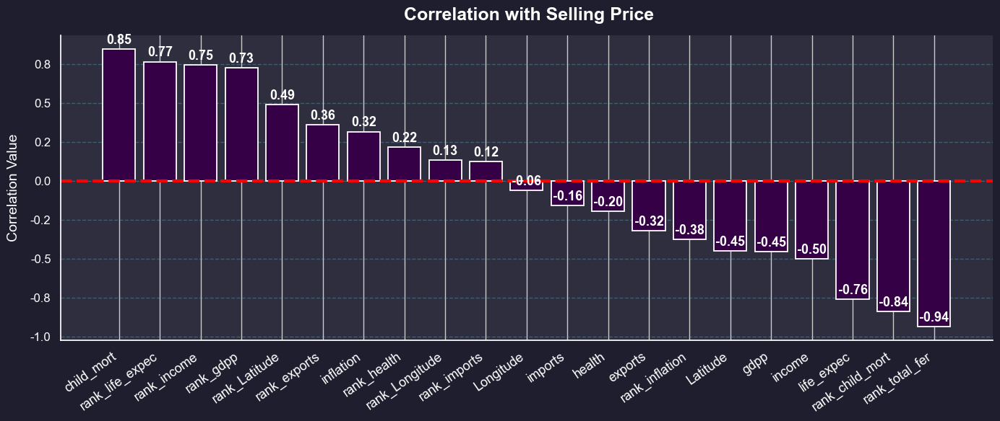

In [400]:



numeric_df = df.select_dtypes(include='number')
correlations = numeric_df.corr()["total_fer"].drop("total_fer")
correlations = correlations.sort_values(ascending=False)

fig, ax = plt.subplots(figsize=(14, 6))
fig.patch.set_facecolor("#1e1e2f")
ax.set_facecolor("#2e2e3f")

bars = ax.bar(
    correlations.index,
    correlations.values,
    color="#360046",
    edgecolor='white',
    linewidth=1.3
)

for bar in bars:
    yval = bar.get_height()
    ax.text(
        bar.get_x() + bar.get_width()/2,
        yval + 0.015,
        f"{yval:.2f}",
        ha='center',
        va='bottom',
        fontsize=13,
        color='white',
        fontweight='bold'
    )

ax.set_xticks(range(len(correlations.index)))
ax.set_xticklabels(correlations.index, rotation=35, ha='right', fontsize=13, color='white')
ax.set_yticklabels([f"{y:.1f}" for y in ax.get_yticks()], fontsize=12, color='white')

ax.set_title(" Correlation with Selling Price", fontsize=18, color='white', pad=15, weight='bold')
ax.set_ylabel("Correlation Value", fontsize=14, color='white', labelpad=10)

ax.grid(axis='y', linestyle='--', alpha=0.3, color='cyan')
plt.axhline(0,color='red', linestyle='--', linewidth=3)
for spine in ['top', 'right']:
    ax.spines[spine].set_visible(False)

ax.spines['left'].set_color('white')
ax.spines['bottom'].set_color('white')

plt.tight_layout()
plt.show()



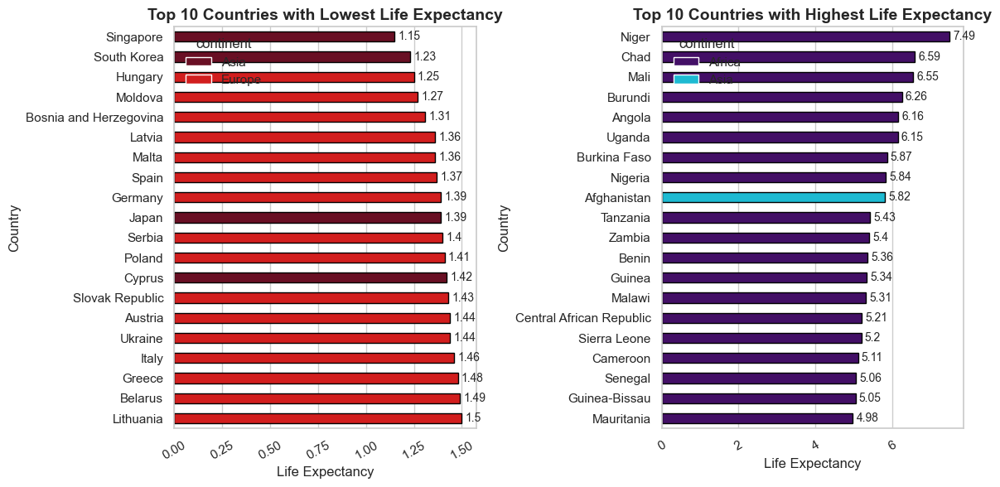

In [401]:

x_low = df.groupby(["country","continent"])["total_fer"].max().reset_index().sort_values("total_fer", ascending=True).head(20)
x_high = df.groupby(["country","continent"])["total_fer"].max().reset_index().sort_values("total_fer", ascending=False).head(20)

warm_palette_low = ["#78001C", "#F00000", "#FFC300"]
warm_palette_high = ["#460075", "#00D0F0", "#00FF4C"]

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12,6))


bars_low = sns.barplot(
    data=x_low,
    x="total_fer",
    y="country",
    hue="continent",
    palette=warm_palette_low,
    ax=axes[0],
    width=0.5
)
for container in bars_low.containers:
    bars_low.bar_label(container, fontsize=10, padding=3)
for p in bars_low.patches:
    p.set_edgecolor("black")
axes[0].set_title("Top 10 Countries with Lowest Life Expectancy", fontsize=14, weight="bold")
axes[0].set_xlabel("Life Expectancy", fontsize=12)
axes[0].set_ylabel("Country", fontsize=12)
axes[0].tick_params(axis='x', rotation=30)


bars_high = sns.barplot(
    data=x_high,
    x="total_fer",
    y="country",
    hue="continent",
    palette=warm_palette_high,
    ax=axes[1],
     width=0.5
)
for container in bars_high.containers:
    bars_high.bar_label(container, fontsize=10, padding=3)
for p in bars_high.patches:
    p.set_edgecolor("black")
axes[1].set_title("Top 10 Countries with Highest Life Expectancy", fontsize=14, weight="bold")
axes[1].set_xlabel("Life Expectancy", fontsize=12)
axes[1].set_ylabel("Country", fontsize=12)
axes[1].tick_params(axis='x', rotation=30)

plt.tight_layout()
plt.show()


رنک این ستون

In [402]:

df = df.sort_values(by='total_fer', ascending=False).reset_index(drop=True)
df['rank_total_fer'] = df.index + 1

In [403]:
countries = [
    'Haiti', 'Lesotho', 'Central African Republic', 'Zambia', 'Malawi',
    'South Africa', 'Mozambique', 'Sierra Leone', 'Guinea-Bissau', 'Afghanistan'
]
df_ranks = df[df['country'].isin(countries)][['country','rank_child_mort','rank_life_expec','rank_total_fer']]
df_ranks = df_ranks.sort_values('rank_total_fer', ascending=True)

html_table = """
<div style='background-color:#0b1220;text-align:center; padding:20px; border-radius:15px; width:750px; font-family:sans-serif; color:#e6eef8;'>
<h2 style='color:#7c3aed; text-align:center;'>Country Rankings</h2>
<table style='border-collapse: collapse; width:100%;'>
<tr>
<th style='padding:8px; border-bottom:2px solid white;'>Country</th>
<th style='padding:8px; border-bottom:2px solid white;'>Rank (rank_total_fer)</th>
<th style='padding:8px; border-bottom:2px solid white;'>Rank (Child Mortality)</th>
<th style='padding:8px; border-bottom:2px solid white;'>Rank (Life Expectancy)</th>
<th style='padding:8px; border-bottom:2px solid white;'>Trend</th>
</tr>
"""

for i, row in df_ranks.iterrows():
    if row['rank_life_expec'] < row['rank_child_mort']:
        trend = "&#9650;" 
        color = "#4CAF50"
    elif row['rank_life_expec'] > row['rank_child_mort']:
        trend = "&#9660;"  
        color = "#FF4D4D"
    elif row['rank_total_fer'] > row['rank_total_fer']:
        trend = "&#9660;"  
        color = "#4D62FF"
    else:
        trend = "&#8212;" 
        color = "#FFFFFF"

    html_table += f"""
    <tr style='text-align:center;'>
        <td style='padding:8px;text-align:center'>{row['country']}</td>
        <td style='padding:8px;'>{int(row['rank_total_fer'])}</td>
        <td style='padding:8px;'>{int(row['rank_child_mort'])}</td>
        <td style='padding:8px;'>{int(row['rank_life_expec'])}</td>
        <td style='padding:8px; color:{color}; font-weight:bold;'>{trend}</td>
    </tr>
    """

html_table += "</table></div>"

display(HTML(html_table))


Country,Rank (rank_total_fer),Rank (Child Mortality),Rank (Life Expectancy),Trend
Afghanistan,11,24,158,▼
Mozambique,13,17,161,▼
Zambia,15,27,164,▼
Malawi,18,22,163,▼
Central African Republic,21,4,165,▼
Sierra Leone,22,2,160,▼
Guinea-Bissau,25,11,159,▼
Haiti,51,1,167,▼
Lesotho,52,18,166,▼
South Africa,77,48,162,▼


<html>
  <body>
    <h3>کارهای انجام شده</h3>
    <p>بررسی ستون مرگ زیر ۵ سال و دو ستون مرتبط</p>

  <h3>مرحله بعد</h3>
    <p>بررسی دو ستون با همبستگی معمولی</p>
  </body>
</html>


# income

ستون income نشان‌دهنده درآمد سرانه (Net Income per Capita) به دلار آمریکا است، یعنی میانگین درآمدی که هر فرد در یک کشور در طول یک سال کسب می‌کند

In [404]:
df["income"].describe()

count       167.000000
mean      17144.688623
std       19278.067698
min         609.000000
25%        3355.000000
50%        9960.000000
75%       22800.000000
max      125000.000000
Name: income, dtype: float64

<Axes: xlabel='income', ylabel='Count'>

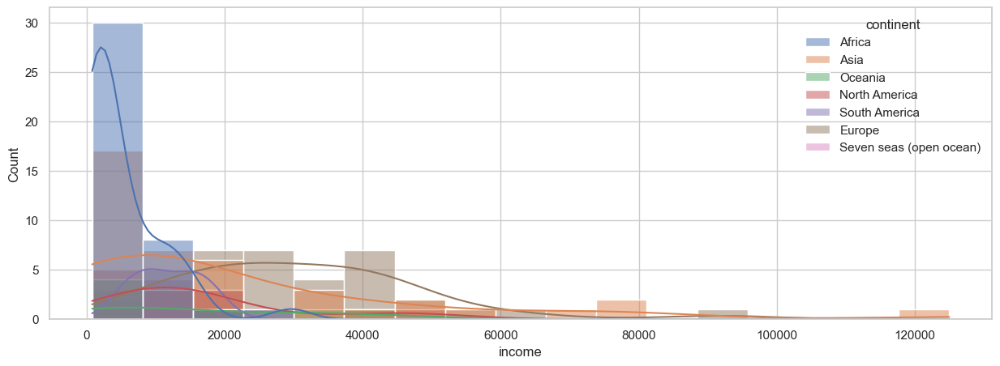

In [405]:
plt.figure(figsize=(15,5))
sns.histplot(x=df["income"],kde=True,hue=df["continent"])

In [406]:

df = df.sort_values(by='income', ascending=False).reset_index(drop=True)
df['rank_income'] = df.index + 1

In [407]:
h = pd.DataFrame({
    'country': df["country"],
    'value': df["rank_income"],
    'continent': df["continent"]  
})

fig = px.strip(h, x='value', hover_name='country', 
               title='"Ranking of countries by life expectancy and longevity', 
               stripmode='overlay', 
               color='continent')  

fig.update_traces(marker=dict(size=12, line=dict(width=1, color='DarkSlateGrey')))
fig.update_xaxes(dtick=5)
fig.show()


In [408]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go


x_low = df.groupby(["country","continent"])["income"].max().reset_index().sort_values("income", ascending=True).head(10)
x_high = df.groupby(["country","continent"])["income"].max().reset_index().sort_values("income", ascending=False).head(10)

continents = df["continent"].unique().tolist()

modern_palette = [
    "#FF6F61", "#4E79A7", "#59A14F", 
    "#76B7B2", "#F28E2B", "#E15759", "#BAB0AC"
]

continent_colors = {cont: modern_palette[i % len(modern_palette)] for i, cont in enumerate(continents)}

fig = make_subplots(
    rows=1, cols=2,
    subplot_titles=("Top 10 Countries with Lowest Income", 
                    "Top 10 Countries with Highest Income"),
    horizontal_spacing=0.15
)


for continent in x_low["continent"].unique():
    subset = x_low[x_low["continent"] == continent]
    fig.add_trace(
        go.Bar(
            x=subset["income"],
            y=subset["country"],
            orientation="h",
            name=continent,
            marker=dict(color=continent_colors[continent], line=dict(color="black", width=0.6)),
            text=subset["income"],
            textposition="outside",
            hovertemplate="<b>%{y}</b><br>Income: %{x}<br>Continent: "+continent
        ),
        row=1, col=1
    )


for continent in x_high["continent"].unique():
    subset = x_high[x_high["continent"] == continent]
    fig.add_trace(
        go.Bar(
            x=subset["income"],
            y=subset["country"],
            orientation="h",
            name=continent,
            marker=dict(color=continent_colors[continent], line=dict(color="black", width=0.6)),
            text=subset["income"],
            textposition="outside",
            hovertemplate="<b>%{y}</b><br>Income: %{x}<br>Continent: "+continent
        ),
        row=1, col=2
    )


fig.update_layout(
    template="plotly_white",
    title=dict(text="Income Analysis by Continent", x=0.5, font=dict(size=20, family="Arial Black")),
    legend=dict(title="Continent", orientation="h", yanchor="bottom", y=-0.2, xanchor="center", x=0.5),
    height=700, width=1200,
    bargap=0.25,
)


fig.update_yaxes(
    autorange="reversed",
    title_text="Country",
    categoryorder="array",
    categoryarray=x_low.sort_values("income", ascending=False)["country"],
    row=1, col=1
)
fig.update_xaxes(title_text="Income", row=1, col=1)

fig.update_yaxes(
    autorange="reversed",
    title_text="Country",
    categoryorder="array",
    categoryarray=x_high.sort_values("income", ascending=False)["country"],
    row=1, col=2
)
fig.update_xaxes(title_text="Income", row=1, col=2)

fig.show()


10 تا از قدرتمند ترین کشور ها در حوده میانگین درامد دلاری 

<!DOCTYPE html>
<html lang="en">
<head>
  <meta charset="UTF-8">
  <title>Country Income Bars</title>
  <style>
    body {
      font-family: Arial, sans-serif;
      display: flex;
      flex-direction: column;
      align-items: center;
      gap: 20px;
      margin: 20px;
    }
    .row {
      display: flex;
      justify-content: center;
      gap: 20px;
    }
    .country {
      width: 220px;
      border: 1px solid #ccc;
      border-radius: 10px;
      padding: 10px;
      box-shadow: 2px 2px 6px rgba(0,0,0,0.1);
      text-align: center;
    }
    .rank {
      font-weight: bold;
      color: #444;
      margin-bottom: 5px;
    }
    .country img {
      width: 50px;
      display: block;
      margin: 0 auto 5px;
    }
    .bar-container {
     style="text-shadow:0px 0px 12px;color:black;background:#eee;",
      border-radius: 6px;
      overflow: hidden;
      height: 20px;
      margin-top: 8px;
    }
    .bar {
      height: 100%;
      background: linear-gradient(90deg, #4CAF50, #81C784);
      text-align: right;
      color: white;
      font-size: 12px;
      padding-right: 5px;
      line-height: 20px;
    }
  </style>
</head>
<body>

  <!-- Row 1 -->
  <div class="row">
    <div class="country">
      <div style="text-shadow:0px 0px 12px cyan;color:black;" class="rank">1</div>
      <img src="https://www.countryflags.com/wp-content/uploads/qatar-flag-png-large.png" alt="Qatar">
      <strong>Qatar</strong>
      <div class="bar-container">
        <div class="bar" style="width:100%;">125000</div>
      </div>
    </div>

  <div class="country">
      <div style="text-shadow:0px 0px 12px cyan;color:black;" class="rank">2</div>
      <img src="https://www.countryflags.com/wp-content/uploads/luxembourg-flag-png-large.png" alt="Luxembourg">
      <strong>Luxembourg</strong>
      <div class="bar-container">
        <div class="bar" style="width:73%;">91700</div>
      </div>
    </div>

  <div class="country">
      <div style="text-shadow:0px 0px 12px cyan;color:black;" class="rank">3</div>
      <img src="https://www.countryflags.com/wp-content/uploads/brunei-flag-png-large.png" alt="Brunei">
      <strong>Brunei</strong>
      <div class="bar-container">
        <div class="bar" style="width:65%;">80600</div>
      </div>
    </div>

  <div class="country">
      <div style="text-shadow:0px 0px 12px cyan;color:black;" class="rank">4</div>
      <img src="https://www.countryflags.com/wp-content/uploads/kuwait-flag-png-large.png" alt="Kuwait">
      <strong>Kuwait</strong>
      <div class="bar-container">
        <div class="bar" style="width:60%;">75200</div>
      </div>
    </div>

  <div class="country">
      <div style="text-shadow:0px 0px 12px cyan;color:black;" class="rank">5</div>
      <img src="https://www.countryflags.com/wp-content/uploads/singapore-flag-png-large.png" alt="Singapore">
      <strong>Singapore</strong>
      <div class="bar-container">
        <div class="bar" style="width:58%;">72100</div>
      </div>
    </div>
  </div>

  <!-- Row 2 -->
  <div class="row">
    <div class="country">
      <div style="text-shadow:0px 0px 12px cyan;color:black;" class="rank">6</div>
      <img src="https://www.countryflags.com/wp-content/uploads/norway-flag-png-large.png" alt="Norway">
      <strong>Norway</strong>
      <div class="bar-container">
        <div class="bar" style="width:50%;">62300</div>
      </div>
    </div>

   <div class="country">
      <div style="text-shadow:0px 0px 12px cyan;color:black;" class="rank">7</div>
      <img src="https://www.countryflags.com/wp-content/uploads/united-arab-emirates-flag-png-large.png" alt="UAE">
      <strong>UAE</strong>
      <div class="bar-container">
        <div class="bar" style="width:46%;">57600</div>
      </div>
    </div>

   <div class="country">
      <div style="text-shadow:0px 0px 12px cyan;color:black;" class="rank">8</div>
      <img src="https://www.countryflags.com/wp-content/uploads/switzerland-flag-png-large.png" alt="Switzerland">
      <strong>Switzerland</strong>
      <div class="bar-container">
        <div class="bar" style="width:44%;">55500</div>
      </div>
    </div>

   <div class="country">
      <div style="text-shadow:0px 0px 12px cyan;color:black;" class="rank">9</div>
      <img src="https://www.emojiall.com/en/header-svg/%F0%9F%87%BA%F0%9F%87%B8.svg" alt="United States">
      <strong>United States</strong>
      <div class="bar-container">
        <div class="bar" style="width:39%;">49400</div>
      </div>
    </div>

  <div class="country">
      <div style="text-shadow:0px 0px 12px;color:black;" class="rank">10</div>
      <img src="https://www.countryflags.com/wp-content/uploads/ireland-flag-png-large.png" alt="Ireland">
      <strong>Ireland</strong>
      <div class="bar-container">
        <div class="bar" style="width:36%;">45700</div>
      </div>
    </div>
  </div>

</body>
</html>


ضفیف ترین کشور ها از نظر میانگین درامد 

<!DOCTYPE html>
<html lang="en">
<head>
  <meta charset="UTF-8">
  <title>Lowest Income Countries</title>
  <style>
    body {
      font-family: Arial, sans-serif;
      display: flex;
      flex-direction: column;
      align-items: center;
      gap: 20px;
      margin: 20px;
    }
    .row {
      display: flex;
      justify-content: center;
      gap: 20px;
    }
    .country {
      width: 220px;
      border: 1px solid #ccc;
      border-radius: 10px;
      padding: 10px;
      box-shadow: 2px 2px 6px rgba(0,0,0,0.1);
      text-align: center;
    }
    .rank {
      font-weight: bold;
      color: #444;
      margin-bottom: 5px;
    }
    .country img {
      width: 50px;
      display: block;
      margin: 0 auto 5px;
    }
    .bar-container {
      background: #eee;
      border-radius: 6px;
      overflow: hidden;
      height: 20px;
      margin-top: 8px;
    }
    .bar {
      height: 100%;
      background: linear-gradient(90deg, #f44336, #e57373);
      text-align: right;
      color: white;
      font-size: 12px;
      padding-right: 5px;
      line-height: 20px;
    }
  </style>
</head>
<body>

  <!-- Row 1 -->
  <div class="row">
    <div class="country">
      <div class="rank">#1</div>
      <img src="https://www.emojiall.com/images/60/twitter/1f1e8-1f1e9.png" alt="Congo, Dem. Rep.">
      <strong>Congo, Dem. Rep.</strong>
      <div class="bar-container">
        <div class="bar" style="width:50%;">609</div>
      </div>
    </div>

<div class="country">
      <div class="rank">#2</div>
      <img src="https://www.countryflags.com/wp-content/uploads/liberia-flag-png-large.png" alt="Liberia">
      <strong>Liberia</strong>
      <div class="bar-container">
        <div class="bar" style="width:57%;">700</div>
      </div>
</div>

<div class="country">
      <div class="rank">#3</div>
      <img src="https://www.countryflags.com/wp-content/uploads/burundi-flag-png-large.png" alt="Burundi">
      <strong>Burundi</strong>
      <div class="bar-container">
        <div class="bar" style="width:63%;">764</div>
      </div>
    </div>

<div class="country">
      <div class="rank">#4</div>
      <img src="https://www.countryflags.com/wp-content/uploads/niger-flag-png-large.png" alt="Niger">
      <strong>Niger</strong>
      <div class="bar-container">
        <div class="bar" style="width:67%;">814</div>
      </div>
    </div>

<div class="country">
      <div class="rank">#5</div>
      <img src="https://www.countryflags.com/wp-content/uploads/central-african-republic-flag-png-large.png" alt="CAR">
      <strong>Central African Republic</strong>
      <div class="bar-container">
        <div class="bar" style="width:73%;">888</div>
      </div>
    </div>
  </div>

  <!-- Row 2 -->
  <div class="row">
    <div class="country">
      <div class="rank">#6</div>
      <img src="https://www.countryflags.com/wp-content/uploads/mozambique-flag-png-large.png" alt="Mozambique">
      <strong>Mozambique</strong>
      <div class="bar-container">
        <div class="bar" style="width:75%;">918</div>
      </div>
    </div>

<div class="country">
      <div class="rank">#7</div>
      <img src="https://www.countryflags.com/wp-content/uploads/malawi-flag-png-large.png" alt="Malawi">
      <strong>Malawi</strong>
      <div class="bar-container">
        <div class="bar" style="width:84%;">1030</div>
      </div>
    </div>

<div class="country">
      <div class="rank">#8</div>
      <img src="https://www.emojiall.com/images/60/skype/1f1ec-1f1f3.png" alt="Guinea">
      <strong>Guinea</strong>
      <div class="bar-container">
        <div class="bar" style="width:97%;">1190</div>
      </div>
    </div>

<div class="country">
      <div class="rank">#9</div>
      <img src="https://www.countryflags.com/wp-content/uploads/togo-flag-png-large.png" alt="Togo">
      <strong>Togo</strong>
      <div class="bar-container">
        <div class="bar" style="width:99%;">1210</div>
      </div>
    </div>
    <div class="country">
      <div class="rank">#10</div>
      <img src="https://www.countryflags.com/wp-content/uploads/sierra-leone-flag-png-large.png" alt="Sierra Leone">
      <strong>Sierra Leone</strong>
      <div class="bar-container">
        <div class="bar" style="width:100%;">1220</div>
      </div>
    </div>
  </div>

</body>
</html>


In [409]:
import plotly.express as px

x = df.groupby("continent")["income"].mean().sort_values(ascending=False)

fig = px.bar(
    x,
    x=x.index,
    y=x.values,
    color=x.values,
    color_continuous_scale="Viridis",
    text=x.values,
    title="Average Income by Continent"
)

fig.update_traces(texttemplate='%{text:.2f}', textposition='outside')
fig.update_layout(
    xaxis_title="Continent",
    yaxis_title="Average Income",
    template="plotly_white",
    uniformtext_minsize=8,
    uniformtext_mode='hide'
)

fig.show()


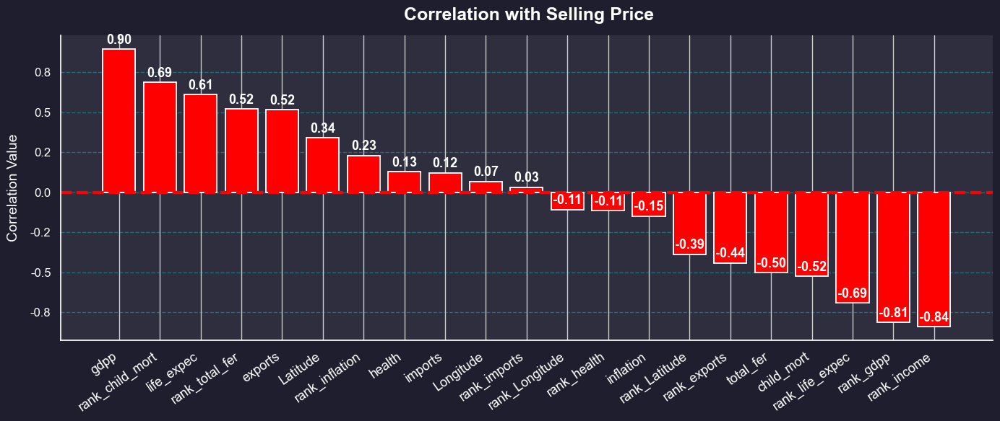

In [410]:
numeric_df = df.select_dtypes(include='number')
correlations = numeric_df.corr()["income"].drop("income")
correlations = correlations.sort_values(ascending=False)

fig, ax = plt.subplots(figsize=(14, 6))
fig.patch.set_facecolor("#1e1e2f")
ax.set_facecolor("#2e2e3f")

bars = ax.bar(
    correlations.index,
    correlations.values,
    color="#ff0000",
    edgecolor='white',
    linewidth=1.3
)

for bar in bars:
    yval = bar.get_height()
    ax.text(
        bar.get_x() + bar.get_width()/2,
        yval + 0.015,
        f"{yval:.2f}",
        ha='center',
        va='bottom',
        fontsize=13,
        color='white',
        fontweight='bold'
    )

ax.set_xticks(range(len(correlations.index)))
ax.set_xticklabels(correlations.index, rotation=35, ha='right', fontsize=13, color='white')
ax.set_yticklabels([f"{y:.1f}" for y in ax.get_yticks()], fontsize=12, color='white')

ax.set_title(" Correlation with Selling Price", fontsize=18, color='white', pad=15, weight='bold')
ax.set_ylabel("Correlation Value", fontsize=14, color='white', labelpad=10)

ax.grid(axis='y', linestyle='--', alpha=0.3, color='cyan')
plt.axhline(0,color='red', linestyle='--', linewidth=3)
for spine in ['top', 'right']:
    ax.spines[spine].set_visible(False)

ax.spines['left'].set_color('white')
ax.spines['bottom'].set_color('white')

plt.tight_layout()
plt.show()



حالا درامد یه فرد می تونه به چیز هایی بستگی و وابسته باشه 

اهان خب داریم می بینیم که اینجا یه رابطه خیلی مستقیم بین gdpp
90درصد

<!DOCTYPE html>
<html lang="fa">
<head>
    <meta charset="UTF-8">
    <title>شاخص GDP سرانه</title>
    <style>
        body {
            font-family: Tahoma, sans-serif;
            line-height: 1.6;
            margin: 40px;
            background-color: #f9f9f9;
            color: #333;
        }
        .container {
            max-width: 700px;
            background-color: #fff;
            padding: 30px;
            border-radius: 10px;
            box-shadow: 0 4px 10px rgba(0,0,0,0.1);
        }
        h1 {
            color: #2c3e50;
            text-align: center;
        }
        p {
            margin-bottom: 20px;
            text-align: justify;
        }
        strong {
            color: #e74c3c;
        }
    </style>
</head>
<body>
    <div class="container">
        <h1>توضیح شاخص GDP سرانه</h1>
        <p>
            ستون <strong>gdpp</strong> نشان‌دهنده تولید ناخالص داخلی سرانه (Gross Domestic Product per Capita) به دلار آمریکا است، 
            یعنی ارزش کل کالاها و خدمات تولیدشده در یک کشور در طول یک سال، تقسیم بر تعداد جمعیت آن کشور.
        </p>
        <p>
            این شاخص یکی از مهم‌ترین معیارهای سنجش سطح توسعه اقتصادی، بهره‌وری و ثروت تولیدشده به ازای هر فرد در یک کشور است.
        </p>
    </div>
</body>
</html>


In [411]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go
x_low = df.groupby(["country","continent"])["gdpp"].max().reset_index().sort_values("gdpp", ascending=True).head(20)
x_high = df.groupby(["country","continent"])["gdpp"].max().reset_index().sort_values("gdpp", ascending=False).head(20)


continents = df["continent"].unique().tolist()


modern_palette = [
    "#FF6F61",   
    "#4E79A7",   
    "#59A14F",   
    "#76B7B2",   
    "#F28E2B",   
    "#E15759",   
    "#BAB0AC"    
]


continent_colors = {cont: modern_palette[i % len(modern_palette)] for i, cont in enumerate(continents)}


fig = make_subplots(
    rows=1, cols=2,
    subplot_titles=("Top 20 Countries with Lowest Life Expectancy", 
                    "Top 20 Countries with Highest Life Expectancy"),
    horizontal_spacing=0.15
)


for continent in x_low["continent"].unique():
    subset = x_low[x_low["continent"] == continent]
    fig.add_trace(
        go.Bar(
            x=subset["gdpp"],
            y=subset["country"],
            orientation="h",
            name=continent,
            marker=dict(color=continent_colors[continent], line=dict(color="black", width=0.6)),
            text=subset["gdpp"],
            textposition="outside",
            hovertemplate="<b>%{y}</b><br>gdpp: %{x}<br>Continent: "+continent
        ),
        row=1, col=1
    )


for continent in x_high["continent"].unique():
    subset = x_high[x_high["continent"] == continent]
    fig.add_trace(
        go.Bar(
            x=subset["gdpp"],
            y=subset["country"],
            orientation="h",
            name=continent,
            marker=dict(color=continent_colors[continent], line=dict(color="black", width=0.6)),
            text=subset["gdpp"],
            textposition="outside",
            hovertemplate="<b>%{y}</b><br>gdpp: %{x}<br>Continent: "+continent
        ),
        row=1, col=2
    )


fig.update_layout(
    template="plotly_white",
    title=dict(text="Life Expectancy Analysis by Continent", x=0.5, font=dict(size=20, family="Arial Black")),
    legend=dict(title="Continent", orientation="h", yanchor="bottom", y=-0.2, xanchor="center", x=0.5),
    height=700, width=1200,
    bargap=0.25,
)


fig.update_yaxes(autorange="reversed", title_text="Country", row=1, col=1)
fig.update_xaxes(title_text="Life Expectancy", row=1, col=1)

fig.update_yaxes(autorange="reversed", title_text="Country", row=1, col=2)
fig.update_xaxes(title_text="Life Expectancy", row=1, col=2)

fig.show()


# export

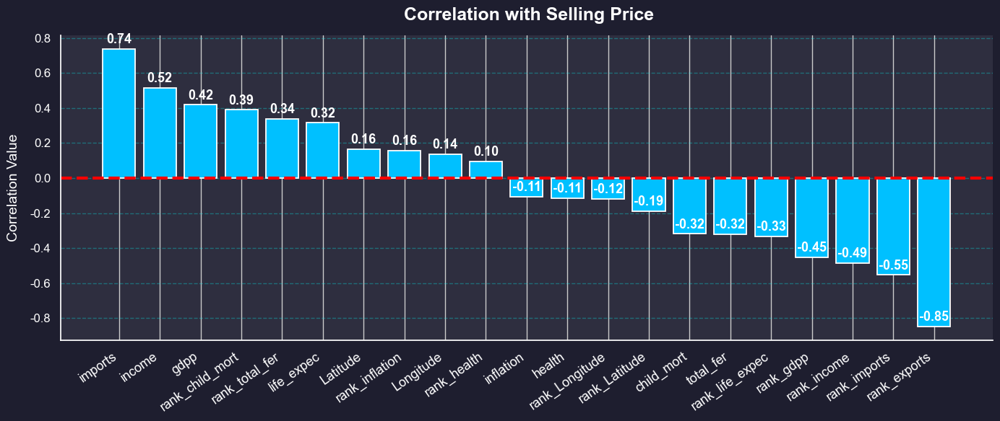

In [412]:



numeric_df = df.select_dtypes(include='number')
correlations = numeric_df.corr()["exports"].drop("exports")
correlations = correlations.sort_values(ascending=False)

fig, ax = plt.subplots(figsize=(14, 6))
fig.patch.set_facecolor("#1e1e2f")
ax.set_facecolor("#2e2e3f")

bars = ax.bar(
    correlations.index,
    correlations.values,
    color='#00c0ff',
    edgecolor='white',
    linewidth=1.3
)

for bar in bars:
    yval = bar.get_height()
    ax.text(
        bar.get_x() + bar.get_width()/2,
        yval + 0.015,
        f"{yval:.2f}",
        ha='center',
        va='bottom',
        fontsize=13,
        color='white',
        fontweight='bold'
    )

ax.set_xticks(range(len(correlations.index)))
ax.set_xticklabels(correlations.index, rotation=35, ha='right', fontsize=13, color='white')
ax.set_yticklabels([f"{y:.1f}" for y in ax.get_yticks()], fontsize=12, color='white')

ax.set_title(" Correlation with Selling Price", fontsize=18, color='white', pad=15, weight='bold')
ax.set_ylabel("Correlation Value", fontsize=14, color='white', labelpad=10)

ax.grid(axis='y', linestyle='--', alpha=0.3, color='cyan')
plt.axhline(0,color='red', linestyle='--', linewidth=3)
for spine in ['top', 'right']:
    ax.spines[spine].set_visible(False)

ax.spines['left'].set_color('white')
ax.spines['bottom'].set_color('white')

plt.tight_layout()
plt.show()



In [413]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go
x_low = df.groupby(["country","continent"])["exports"].max().reset_index().sort_values("exports", ascending=True).head(10)
x_high = df.groupby(["country","continent"])["exports"].max().reset_index().sort_values("exports", ascending=False).head(20)


continents = df["continent"].unique().tolist()


modern_palette = [
    "#FF6F61",   
    "#4E79A7",   
    "#59A14F",   
    "#76B7B2",   
    "#F28E2B",   
    "#E15759",   
    "#BAB0AC"    
]


continent_colors = {cont: modern_palette[i % len(modern_palette)] for i, cont in enumerate(continents)}


fig = make_subplots(
    rows=1, cols=2,
    subplot_titles=("Top 20 Countries with Lowest Life Expectancy", 
                    "Top 20 Countries with Highest Life Expectancy"),
    horizontal_spacing=0.15
)


for continent in x_low["continent"].unique():
    subset = x_low[x_low["continent"] == continent]
    fig.add_trace(
        go.Bar(
            x=subset["exports"],
            y=subset["country"],
            orientation="h",
            name=continent,
            marker=dict(color=continent_colors[continent], line=dict(color="black", width=0.6)),
            text=subset["exports"],
            textposition="outside",
            hovertemplate="<b>%{y}</b><br>exports: %{x}<br>Continent: "+continent
        ),
        row=1, col=1
    )


for continent in x_high["continent"].unique():
    subset = x_high[x_high["continent"] == continent]
    fig.add_trace(
        go.Bar(
            x=subset["exports"],
            y=subset["country"],
            orientation="h",
            name=continent,
            marker=dict(color=continent_colors[continent], line=dict(color="black", width=0.6)),
            text=subset["exports"],
            textposition="outside",
            hovertemplate="<b>%{y}</b><br>exports: %{x}<br>Continent: "+continent
        ),
        row=1, col=2
    )


fig.update_layout(
    template="plotly_white",
    title=dict(text="Life Expectancy Analysis by Continent", x=0.5, font=dict(size=20, family="Arial Black")),
    legend=dict(title="Continent", orientation="h", yanchor="bottom", y=-0.2, xanchor="center", x=0.5),
    height=700, width=1200,
    bargap=0.25,
)

fig.update_yaxes(autorange="reversed", title_text="Country", row=1, col=1)
fig.update_xaxes(title_text="Life Expectancy", row=1, col=1)

fig.update_yaxes(autorange="reversed", title_text="Country", row=1, col=2)
fig.update_xaxes(title_text="Life Expectancy", row=1, col=2)

fig.show()


In [414]:
import plotly.graph_objects as go

fig = go.Figure(data=[go.Scatter3d(
    x=df['life_expec'],
    y=df['total_fer'],
    z=df['child_mort'],
    mode='markers',
    marker=dict(
        size=5,
        color=df['income'],
        colorscale='Viridis',
        opacity=0.8,
        colorbar=dict(title='Income')
    ),
    text=df['continent']
)])

fig.update_layout(
    scene=dict(
        xaxis_title='Life Expectancy',
        yaxis_title='Total Fertility',
        zaxis_title='Child Mortality'
    ),
    margin=dict(l=0, r=0, b=0, t=50),
    title='Interactive 3D Scatter: life_expec vs total_fer vs child_mort'
)

fig.show()


In [415]:
df.groupby("country")["child_mort"].min().sort_values()[:10]

country
Iceland           2.6
Luxembourg        2.8
Singapore         2.8
Finland           3.0
Sweden            3.0
Slovenia          3.2
Norway            3.2
Japan             3.2
Czech Republic    3.4
Cyprus            3.6
Name: child_mort, dtype: float64

In [416]:
# df_lan_lan=df.copy()
# df_lan = pd.read_csv('unique.csv')
# def get_coordinates(country_name):
#     try:
#         country = CountryInfo(country_name)
#         latlng = country.capital_latlng()
#         if latlng:
#             return latlng[0], latlng[1] 
#         else:
         
#             geolocator = Nominatim(user_agent="country_locator")
#             location = geolocator.geocode(country_name)
#             time.sleep(1)  # برای جلوگیری از محدودیت درخواست API
#             if location:
#                 return location.latitude, location.longitude
#             else:
#                 return None, None
#     except:
#         return None, None

# df_lan['Latitude'] = None
# df_lan['Longitude'] = None


# for index, row in df_lan.iterrows():
#     country = row['Country']
#     lat, lon = get_coordinates(country)
#     df_lan.at[index, 'Latitude'] = lat
#     df_lan.at[index, 'Longitude'] = lon

# df_lan["Latitude"]=df_lan["Latitude"].astype(float)
# df_lan["Longitude"]=df_lan["Longitude"].astype(float)
# df_lan.to_csv('unique_with_coordinates.csv', index=False)
# print(df_lan.head())

In [417]:
# # df_lan.drop('Country',axis=1,inplace=True)
# df = pd.concat([df, df_lan], axis=1)


پیدا کردن قاره

In [418]:
# import pandas as pd
# import geopandas as gpd

# # فرض می‌کنیم df ستون‌های زیر را دارد:
# # 'country', 'Latitude', 'Longitude'
# # مثال:
# # df = pd.DataFrame({'country':['China','USA'], 'Latitude':[35.8617,37.0902],'Longitude':[104.1954,-95.7129]})

# # بارگذاری shapefile نقشه جهان
# shapefile_path = r"ne_10m_admin_0_countries.zip"
# world = gpd.read_file(shapefile_path)

# # تبدیل df به GeoDataFrame با مختصات
# gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df['Longitude'], df['Latitude']), crs=world.crs)

# # spatial join برای پیدا کردن قاره
# gdf = gpd.sjoin(gdf, world[['CONTINENT', 'geometry']], how='left', predicate='within')

# # ستون CONTINENT اضافه شد
# df['continent'] = gdf['CONTINENT']

# # نمایش نتیجه
# print(df[['country','Latitude','Longitude','continent']])


In [419]:
df.isna().sum()

country             0
child_mort          0
exports             0
health              0
imports             0
income              0
inflation           0
life_expec          0
total_fer           0
gdpp                0
Country             0
Latitude           11
Longitude          11
continent          17
rank_child_mort     0
rank_exports        0
rank_health         0
rank_imports        0
rank_income         0
rank_inflation      0
rank_life_expec     0
rank_total_fer      0
rank_gdpp           0
rank_Latitude       0
rank_Longitude      0
dtype: int64

In [420]:
import pandas as pd


coordinates = {
    'Bahamas': (25.0343, -77.3963),
    'Congo, Dem. Rep.': (-4.0383, 21.7587),
    'Congo, Rep.': (-0.2280, 15.8277),
    "Cote d'Ivoire": (7.539989, -5.547080),
    'Gambia': (13.4432, -15.3101),
    'Macedonia, FYR': (41.6086, 21.7453),
    'Micronesia, Fed. Sts.': (7.4256, 150.5508),
    'Montenegro': (42.7087, 19.3744),
    'Myanmar': (21.9162, 95.9558),
    'St. Vincent and the Grenadines': (12.9843, -61.2872),
    'Timor-Leste': (-8.8742, 125.7275)
}

for country, (lat, lon) in coordinates.items():
    df.loc[df['country'] == country, 'Latitude'] = lat
    df.loc[df['country'] == country, 'Longitude'] = lon



In [421]:
df.isna().sum()

country             0
child_mort          0
exports             0
health              0
imports             0
income              0
inflation           0
life_expec          0
total_fer           0
gdpp                0
Country             0
Latitude            0
Longitude           0
continent          17
rank_child_mort     0
rank_exports        0
rank_health         0
rank_imports        0
rank_income         0
rank_inflation      0
rank_life_expec     0
rank_total_fer      0
rank_gdpp           0
rank_Latitude       0
rank_Longitude      0
dtype: int64

In [422]:

country_to_continent = {
    'Bahamas': 'North America',
    'Congo, Dem. Rep.': 'Africa',
    'Congo, Rep.': 'Africa',
    "Cote d'Ivoire": 'Africa',
    'Equatorial Guinea': 'Africa',
    'Gambia': 'Africa',
    'Liberia': 'Africa',
    'Macedonia, FYR': 'Europe',
    'Micronesia, Fed. Sts.': 'Oceania',
    'Montenegro': 'Europe',
    'Mozambique': 'Africa',
    'Myanmar': 'Asia',
    'Portugal': 'Europe',
    'Solomon Islands': 'Oceania',
    'St. Vincent and the Grenadines': 'North America',
    'Timor-Leste': 'Asia',
    'Tonga': 'Oceania'
}


df["continent"] = df["continent"].fillna(df["country"].map(country_to_continent))




In [423]:
df.isna().sum()

country            0
child_mort         0
exports            0
health             0
imports            0
income             0
inflation          0
life_expec         0
total_fer          0
gdpp               0
Country            0
Latitude           0
Longitude          0
continent          0
rank_child_mort    0
rank_exports       0
rank_health        0
rank_imports       0
rank_income        0
rank_inflation     0
rank_life_expec    0
rank_total_fer     0
rank_gdpp          0
rank_Latitude      0
rank_Longitude     0
dtype: int64

In [424]:
import plotly.express as px

for i in analiz.columns[1:-4]:
    fig = px.choropleth(
        analiz,                    
        locationmode='country names',
        locations='country',          
        projection='albers',
        title=f'{i} Per Country',
        color=i,
        color_continuous_scale="Teal"
    )
    fig.update_geos(fitbounds="locations", visible=True)
    fig.show(engine='kaleido')


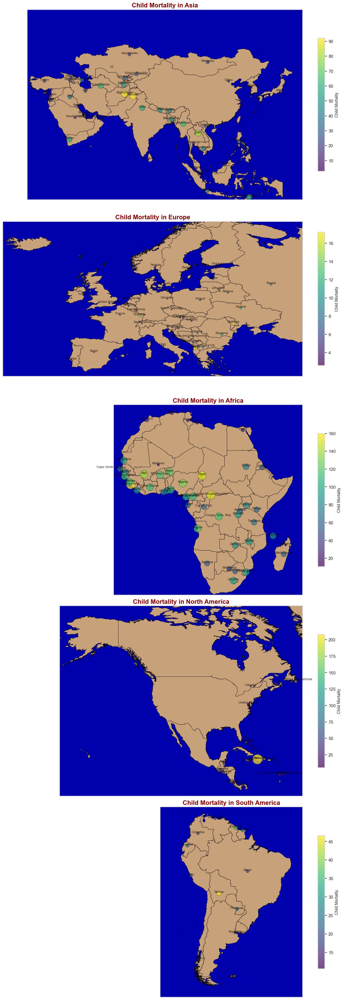

In [425]:


data = pd.DataFrame({
    'country': df["country"],
    'continent': df["continent"],
    'lat': df["Latitude"],
    'lon': df["Longitude"],
    'income': df["child_mort"]
})

shapefile_path = r"ne_10m_admin_0_countries.zip"
world = gpd.read_file(shapefile_path)

continents = ['Asia', 'Europe', 'Africa', 'North America', 'South America']

zoom_bounds = {
    "Europe": (-25, 45, 35, 70),
    "North America": (-170, -50, 5, 75),
    "Asia": (25, 150, -10, 70),
    "Africa": (-20, 55, -35, 40),
    "South America": (-90, -30, -60, 15)
}

fig, axes = plt.subplots(len(continents), 1, figsize=(12, 35), constrained_layout=True, facecolor="none")
fig.patch.set_alpha(0) 

for ax, cont in zip(axes, continents):
    ax.set_facecolor("#0000ac")
    
    continent_shape = world[world['CONTINENT'] == cont]
    continent_shape.plot(ax=ax, color="#c7a17a", edgecolor="black", linewidth=0.5)
    
    data_cont = data[data['continent'] == cont].reset_index(drop=True)
    
    sc = ax.scatter(
        data_cont['lon'], data_cont['lat'],
        s=data_cont['income']*3,
        c=data_cont['income'], cmap="viridis",
        alpha=0.7, edgecolors="black", linewidth=0.5
    )

    for i, row in data_cont.iterrows():
        ax.text(
            row['lon'], row['lat'], row['country'],
            fontsize=8, ha="center", va="bottom",
            color="black", alpha=0.8
        )
    
    
    if cont in zoom_bounds:
        lon_min, lon_max, lat_min, lat_max = zoom_bounds[cont]
        ax.set_xlim(lon_min, lon_max)
        ax.set_ylim(lat_min, lat_max)
    
    ax.set_title(f"Child Mortality in {cont}", fontsize=16, fontweight="bold", color="darkred")
    ax.set_xticks([])
    ax.set_yticks([])
    

    cbar = plt.colorbar(sc, ax=ax, orientation="vertical", shrink=0.7, pad=0.02)
    cbar.set_label("Child Mortality", fontsize=10)
    

    cursor = mplcursors.cursor(sc, hover=True)
    @cursor.connect("add")
    def on_add(sel, data_cont=data_cont):
        idx = sel.index
        country = data_cont.loc[idx, "country"]
        income = data_cont.loc[idx, "income"]
        sel.annotation.set_text(f"{country}\nChild Mort: {income:.2f}")
        sel.annotation.get_bbox_patch().set(fc="white", alpha=0.8)

plt.show()


In [426]:


data = pd.DataFrame({
    'country': df['country'],
    'lat': df['Latitude'],
    'lon': df['Longitude'],
    'child_mort': df['child_mort']
})


fig = px.scatter_geo(
    data,
    lat='lat',
    lon='lon',
    color='child_mort',  
    size='child_mort',    
    hover_name='country', 
    projection='orthographic',
    color_continuous_scale="plasma"
)


fig.update_geos(
    showland=True, landcolor="#8B4513",
    showocean=True, oceancolor="darkblue",
    showcountries=True, countrycolor="white",
    showlakes=False, bgcolor='black',
    projection=dict(type="orthographic", scale=0.85),
    center=dict(lat=20, lon=0)
)


fig.update_layout(
    title='Child Mortality Around the Globe',
    margin={"r":0,"t":50,"l":0,"b":0},
    height=800,
    coloraxis_colorbar=dict(title="Child Mortality"),
    paper_bgcolor='black',
    plot_bgcolor='black',
    font=dict(color='white')
)

fig.show()


<!DOCTYPE html>
<html lang="en">
<head>
<meta charset="UTF-8">
<title>Child Mortality Globe</title>
<style>
  body { margin: 0; background: black; }
  canvas { display: block; }
</style>
</head>
<body>
<script src="https://cdn.jsdelivr.net/npm/three@0.154.0/build/three.min.js"></script>
<script src="https://cdn.jsdelivr.net/npm/three@0.154.0/examples/js/controls/OrbitControls.js"></script>

<script>
// Scene, Camera, Renderer
const scene = new THREE.Scene();
const camera = new THREE.PerspectiveCamera(45, window.innerWidth/window.innerHeight, 0.1, 1000);
camera.position.set(0, 0, 3);

const renderer = new THREE.WebGLRenderer({antialias:true});
renderer.setSize(window.innerWidth, window.innerHeight);
document.body.appendChild(renderer.domElement);

// Controls
const controls = new THREE.OrbitControls(camera, renderer.domElement);
controls.enableZoom = true;

// Earth Texture
const textureLoader = new THREE.TextureLoader();
const earthTexture = textureLoader.load('https://eoimages.gsfc.nasa.gov/images/imagerecords/57000/57730/land_ocean_ice_2048.jpg');

// Earth Sphere
const geometry = new THREE.SphereGeometry(1, 64, 64);
const material = new THREE.MeshPhongMaterial({ map: earthTexture });
const earth = new THREE.Mesh(geometry, material);
scene.add(earth);

// Light
const light = new THREE.PointLight(0xffffff, 1);
light.position.set(5,5,5);
scene.add(light);

// Sample Data Points (lat, lon, size)
const data = [
  {lat: 20, lon: 0, size: 0.02},      // replace with your df values
  {lat: -10, lon: 45, size: 0.03}
];

data.forEach(d => {
  const phi = (90 - d.lat) * (Math.PI/180);
  const theta = (d.lon + 180) * (Math.PI/180);

  const x = Math.sin(phi) * Math.cos(theta);
  const y = Math.cos(phi);
  const z = Math.sin(phi) * Math.sin(theta);

  const pointGeometry = new THREE.SphereGeometry(d.size, 8, 8);
  const pointMaterial = new THREE.MeshBasicMaterial({color: 0xff0000});
  const point = new THREE.Mesh(pointGeometry, pointMaterial);
  point.position.set(x, y, z);
  scene.add(point);
});

// Animate
function animate() {
  requestAnimationFrame(animate);
  earth.rotation.y += 0.0005; // slow rotation
  renderer.render(scene, camera);
}
animate();

window.addEventListener('resize', () => {
  camera.aspect = window.innerWidth/window.innerHeight;
  camera.updateProjectionMatrix();
  renderer.setSize(window.innerWidth, window.innerHeight);
});
</script>
</body>
</html>


In [427]:
col_number=['child_mort', 'exports','health', 'imports', 'income', 'inflation','life_expec', 'total_fer','gdpp']

In [428]:



nn = df.copy()
bins = [0, 1.5, 2.5, 3.5, 10]
labels = ['Very Low', 'Low', 'Medium', 'High']
nn['total_fer_cat'] = pd.cut(nn['total_fer'], bins=bins, labels=labels, right=False)

continent_ratios = nn['continent'].value_counts(normalize=True).sort_index()
age_ratios = nn['total_fer_cat'].value_counts(normalize=True).reindex(labels).fillna(0)


fig = make_subplots(
    rows=1, cols=2,
    specs=[[{"type": "pie"}, {"type": "bar"}]],
    column_widths=[0.5, 0.5]
)


fig.add_trace(
    go.Pie(labels=continent_ratios.index, values=continent_ratios.values, sort=False, pull=[0]*len(continent_ratios)),
    row=1, col=1
)


colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']  
fig.add_trace(
    go.Bar(x=age_ratios.index, y=age_ratios.values, marker_color=colors, opacity=0.7),
    row=1, col=2
)


buttons = []
for i, cont in enumerate(continent_ratios.index):
    filtered = nn[nn['continent'] == cont]
    age_ratios_filtered = filtered['total_fer_cat'].value_counts(normalize=True).reindex(labels).fillna(0)
    

    pull_values = [0.1 if j == i else 0 for j in range(len(continent_ratios))]
    
    buttons.append(
        dict(
            label=cont,
            method="update",
            args=[{
                "y": [age_ratios_filtered.values],  
                "pull": [pull_values]               
            },
            {"title": f"Total Fertility Categories in {cont}"}]
        )
    )

fig.update_layout(
    updatemenus=[dict(
        type="buttons",
        buttons=buttons,
        direction="left", 
        x=0.5,             
        y=-0.15,           
        xanchor="center",   
        yanchor="top",      
        showactive=True,
        pad={"r": 10, "t": 10}  
    )]
)

fig.show()


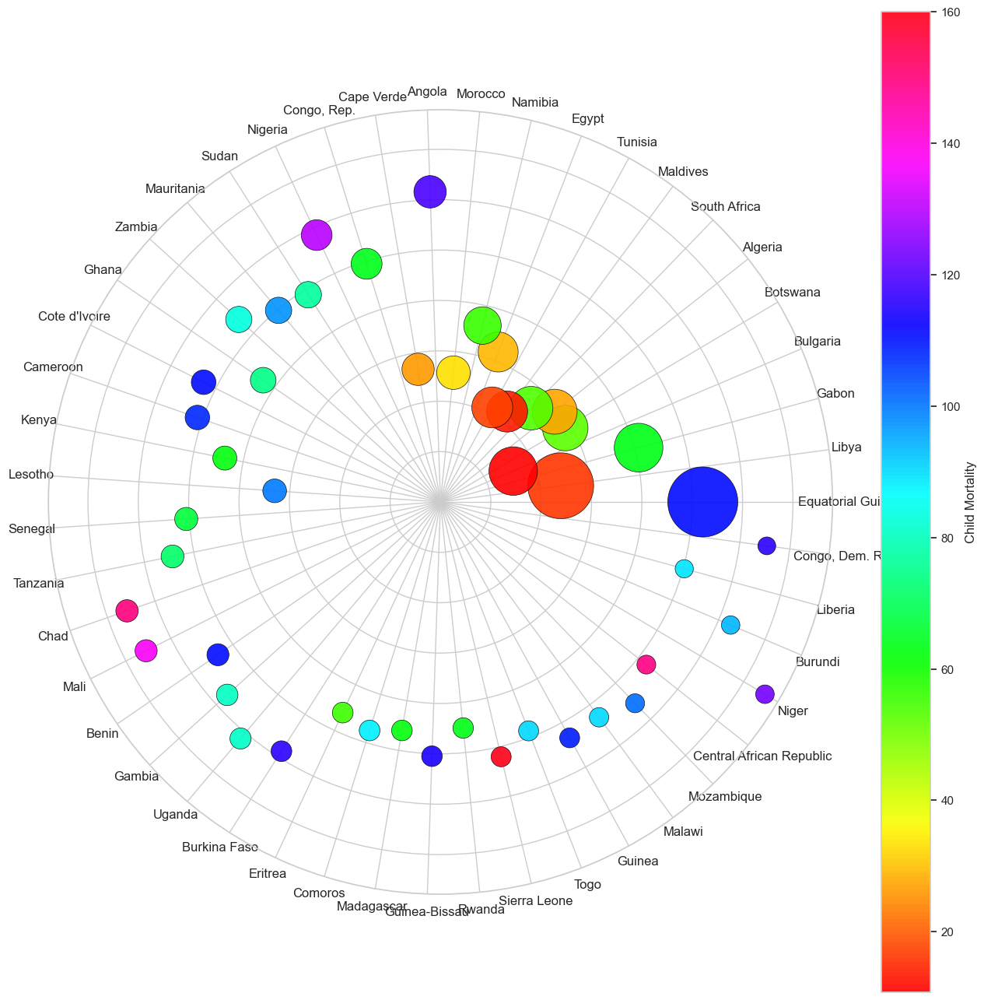

In [429]:

nn = df.copy()


africa = nn[nn['continent'] == 'Africa'].copy()


africa['country_code'] = pd.factorize(africa['country'])[0]
theta = 2 * np.pi * africa['country_code'] / len(africa)  


r = africa['total_fer'].values


area = africa['income'].values / africa['income'].max() * 4000 + 200

colors = africa['child_mort'].values


fig = plt.figure(figsize=(14,14))
ax = fig.add_subplot(projection='polar')
scatter = ax.scatter(theta, r, c=colors, s=area, cmap='hsv', alpha=0.9, edgecolors='black', linewidths=0.5)

ax.set_yticklabels([])


plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05)


cbar = plt.colorbar(scatter, ax=ax, orientation='vertical', pad=0.05)
cbar.set_label('Child Mortality', fontsize=12)

ax.set_title('', va='bottom', fontsize=16)
ax.set_xticks(theta)
ax.set_xticklabels(africa['country'], rotation=90, fontsize=12)

plt.show()


In [430]:
cols_to_drop = [col for col in df.columns if col.startswith("Unnamed")]  # تمام ستون‌هایی که با 'Unnamed' شروع می‌شوند
cols_to_drop += ['rank_child_mort', 'rank_life_expec']  # اضافه کردن ستون‌های مشخص‌شده

df = df.drop(columns=cols_to_drop)

df.drop(["Country","Longitude","Latitude"],axis=1,inplace=True)

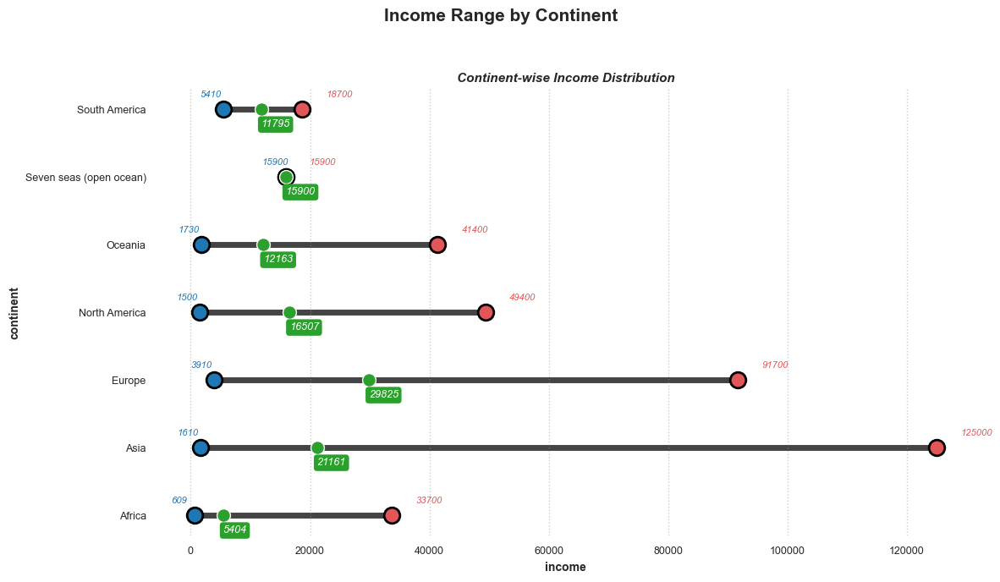

In [431]:
df = pd.read_csv("update2.csv")
title = dict(fontsize=11, style='italic', weight='bold', ha='center')
grid_style = dict(alpha=0.5, color='#9B9A9C', linestyle='dotted', zorder=1)
sct_style = dict(s=180, linewidth=2, edgecolor='black')
xy_label = dict(fontweight='bold', fontsize=10)
ann_style = dict(xytext=(0, 0), textcoords='offset points', va='center', ha='center', style='italic')

plot_c = df[['income', 'continent']].groupby('continent').agg(
    MIN=('income', 'min'),
    AVG=('income', 'mean'),
    MAX=('income', 'max')
).reset_index()

continents = sorted(plot_c['continent'].unique())

fig, ax = plt.subplots(figsize=(12, 7))  

plt.suptitle('Income Range by Continent', fontsize=15, fontweight='bold')

for i, cont in enumerate(continents):
    row = plot_c[plot_c['continent'] == cont]

    # خط بازه
    ax.hlines(y=row['continent'], xmin=row['MIN'], xmax=row['MAX'], linewidth=5, color='#444', zorder=0)

    # نقاط
    ax.scatter(row['MIN'], row['continent'], color='#1f77b4', **sct_style)   
    ax.scatter(row['MAX'], row['continent'], color='#e15759', **sct_style) 
    ax.scatter(row['AVG'], row['continent'], color='#2ca02c', s=130, edgecolor='white', zorder=2) 

    # برچسب‌ها
    ax.annotate(f'{row["MIN"].values[0]:.0f}', xy=(row['MIN'].values[0], row['continent'].values[0]),
                xytext=(-20, 10), textcoords='offset points',
                color='#1f77b4', fontsize=8, style='italic')

    ax.annotate(f'{row["AVG"].values[0]:.0f}', xy=(row['AVG'].values[0], row['continent'].values[0]),
                xytext=(0, -15), textcoords='offset points',
                color='white', fontsize=9,
                bbox=dict(boxstyle='round,pad=0.3', facecolor='#2ca02c', edgecolor='none'),
                style='italic')

    ax.annotate(f'{row["MAX"].values[0]:.0f}', xy=(row['MAX'].values[0], row['continent'].values[0]),
                xytext=(20, 10), textcoords='offset points',
                color='#e15759', fontsize=8, style='italic')

for spine in ax.spines.values():
    spine.set_color('None')

ax.set_xlabel('income', **xy_label)
ax.set_ylabel('continent', **xy_label)
ax.tick_params(axis='both', labelsize=9)
ax.grid(axis='x', which='major', **grid_style)
ax.grid(axis='y', alpha=0)
ax.set_title('Continent-wise Income Distribution', **title)

plt.tight_layout(rect=[0, 0, 1, 0.95])


mng = plt.get_current_fig_manager()
try:
    mng.window.state('zoomed')  
except:
    try:
        mng.full_screen_toggle() 
    except:
        pass

plt.show()


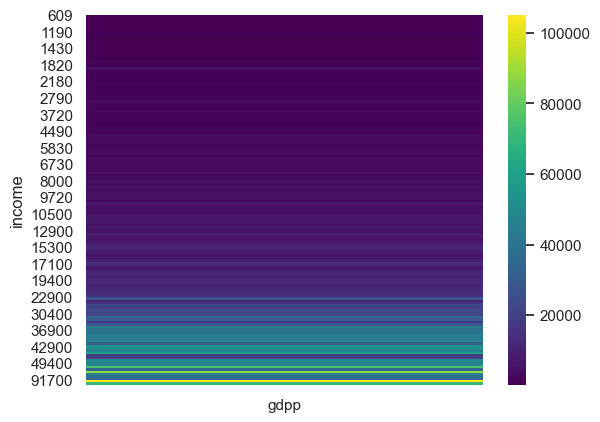

In [432]:
pivot_df = df.pivot_table(values="gdpp", index="income", aggfunc="mean")
sns.heatmap(pivot_df, cmap="viridis")
plt.show()


<!DOCTYPE html>
<html lang="en">
<head>
    <meta charset="UTF-8">
    <meta name="viewport" content="width=device-width, initial-scale=1.0">
    <title>Descriptive Analysis of Feature Means</title>
    <style>
        body {
            font-family: Arial, sans-serif;
            background-color: #f4f4f4;
            color: #333;
            padding: 30px;
        }
        .container {
            background-color: #ffffff;
            border-radius: 12px;
            box-shadow: 0 6px 15px rgba(0,0,0,0.1);
            padding: 25px 30px;
            max-width: 800px;
            margin: auto;
        }
        h2 {
            text-align: center;
            font-weight: bold;
            margin-bottom: 20px;
        }
        ul {
            line-height: 1.8;
        }
        li {
            margin-bottom: 12px;
        }
        .feature {
            font-weight: bold;
        }
    </style>
</head>
<body>
    <div class="container">
        <h2>Descriptive Analysis of Feature Means</h2>
        <ul>
            <li><span class="feature">gdpp (Gross Domestic Product per capita):</span> Very high. Indicates that, on average, countries have a relatively high economic level.</li>
            <li><span class="feature">income:</span> The highest mean value. Most countries have relatively high income, and this feature shows a wide range in the data.</li>
            <li><span class="feature">life_expec (Life expectancy):</span> Small but significant. On average, life expectancy is relatively good, but numerically much lower compared to income and GDP.</li>
            <li><span class="feature">inflation:</span> Very low mean. Most countries have inflation rates within small ranges.</li>
            <li><span class="feature">imports:</span> Low value. Countries have very low import volumes compared to production and income.</li>
            <li><span class="feature">health (Healthcare expenditure):</span> Low but notable. Healthcare spending is lower than other economic indicators.</li>
            <li><span class="feature">exports:</span> Similar to imports, low mean. Countries’ dependence on exports is moderate to low.</li>
            <li><span class="feature">child_mort (Child mortality):</span> Low, but still indicates some regions have healthcare challenges.</li>
            <li><span class="feature">total_fer (Total fertility rate):</span> Moderate value. Average number of children per family is at a balanced level.</li>
        </ul>
    </div>
</body>
</html>


In [433]:
# arr=['exports', 'health', 'imports', 'income', 'inflation',
#        'life_expec', 'total_fer', 'gdpp']
# for  x in arr:
#         fig, ax = plt.subplots(figsize=(20,10))
#         sns.pointplot(x=analiz['child_mort'], y=analiz[x], hue=analiz['continent'], ax=ax)
#         ax.set_title(analiz[x].name)
#         plt.show()


<div style="
    background: rgba(255, 255, 255, 0.05); /* شفاف */
    border-left: 12px solid rgb(0, 0, 0);
    width: 30%;
    margin: 40px auto;
    padding: 24px 32px;
    border-radius: 20px;
    box-shadow: 0 0 25px rgba(0, 0, 0, 0.3), inset 0 0 20px rgbargba(0, 0, 255, 0.2)
    font-family: 'Segoe UI', Tahoma, Geneva, Verdana, sans-serif;
    position: relative;
    overflow: hidden;
    text-align: center;
    backdrop-filter: blur(12px); /* افکت شیشه‌ای */
    -webkit-backdrop-filter: blur(12px); /* برای ساپورت در کروم و سافاری */
    border: 1px solid rgba(255, 255, 255, 0.15); /* خط شیشه‌ای */
">
  <div style="
      position: absolute;
      top: -22px;
      right: -20px;
      background: linear-gradient(135deg, rgb(0, 0, 0), #0066ff);
      color: white;
      font-size: 26px;
      padding: 10px 16px;
      border-radius: 50%;
      box-shadow: 0 0 15px rgba(255, 255, 255, 0.8);
      font-weight: bold;
  "></div>
  <p style="color:rgb(255, 255, 255); font-size: 21px; margin: 0; font-weight: bold; letter-spacing: 2px;">
    Model
  </p>
</div>



In [434]:
from sklearn.preprocessing import MinMaxScaler,StandardScaler
from sklearn.decomposition import PCA
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from matplotlib.colors import ListedColormap

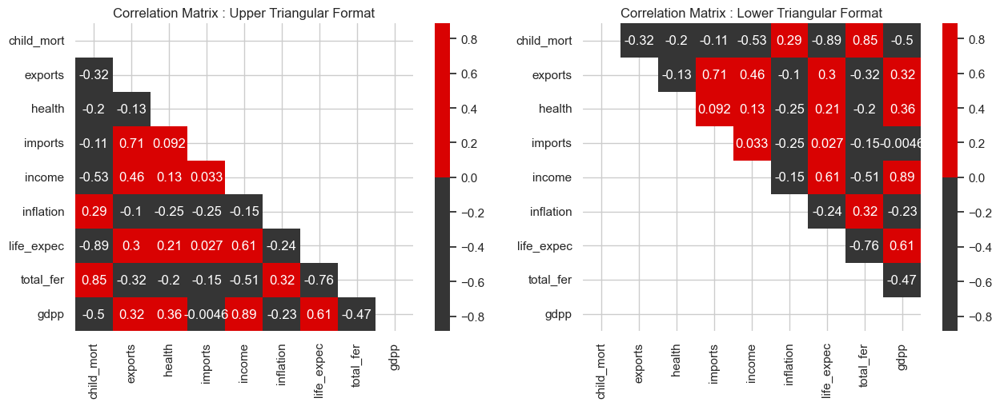

In [435]:


analiz=analiz.iloc[1:,:-9]
numeric_df_heat = analiz.select_dtypes(include=["number"])
ut = np.triu(numeric_df_heat.corr())
lt = np.tril(numeric_df_heat.corr())


two_colors = ListedColormap(["#353535", "#d90202"])  

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15,5))


plt.subplot(1,2,1)
sns.heatmap(numeric_df_heat.corr(), cmap=two_colors, annot=True, cbar=True, mask=ut)
plt.title('Correlation Matrix : Upper Triangular Format')

plt.subplot(1,2,2)
sns.heatmap(numeric_df_heat.corr(), cmap=two_colors, annot=True, cbar=True, mask=lt)
plt.title('Correlation Matrix : Lower Triangular Format')

plt.show()


In [436]:
analiz.to_csv("analiz_new.csv")

<div  style="box-shadow:0 0 10px red;padding:5px;width:fit-content;" >
  <p>Many features have relationships with each other:</p>
  <ul>
    <li><strong>child_mort</strong> clearly increases when <strong>income</strong>, <strong>gdpp</strong> & <strong>exports</strong> decrease. Rise in inflation also leads to high <strong>child_mort</strong> cases. Economic conditions act as an important factor.</li>
    <li>Rise in <strong>exports</strong> clearly increases <strong>gdpp</strong>, <strong>income</strong> & <strong>imports</strong>.</li>
    <li>Spending on <strong>health</strong> slightly increases <strong>life_expec</strong> and decreases <strong>child_mort</strong>.</li>
    <li><strong>income</strong> & <strong>gdpp</strong> display a very high correlation value (0.9). High income leads to higher <strong>life_expec</strong> but significantly decreases <strong>total_fer</strong>.</li>
    <li>High inflation negatively affects financial features, showing high <strong>total_fer</strong> and <strong>child_mort</strong>, typical of a backward nation.</li>
    <li>Higher <strong>life_expec</strong> corresponds to lower <strong>total_fer</strong>. Higher <strong>gdpp</strong> leads to more spending on <strong>health</strong>.</li>
    <li>Some features belong to the same category and react similarly to features of other categories.</li>
  </ul>
<div style="border:1px solid green;background:#0005">
  <p>The 3 categories of features are:</p>
  <ul>
    <li><strong style="text-shadow:0 0 2px cyan;">Health:</strong> child_mort, health, life_expec, total_fer</li>
    <li><strong style="text-shadow:0 0 2px cyan;">Trade:</strong> imports, exports</li>
    <li><strong style="text-shadow:0 0 2px cyan;">Finance:</strong> income, inflation, gdpp</li>
  </ul>
</div>
  <p>Hence, we will dissolve these features into these categories and normalize them!</p>
</div>



<p style="color: white; text-shadow: 0px 0px 3px purple; font-size:20px;border-top:10px solid black">
</p>


  <div style="font-size: 34px;font-weight: bold;text-align:center;border-bottom:2px solid red;text-shadow:0 0 10px red">
PCA
  </div>

<p style="border-bottom:4px solid green;text-align:center;font-size:24px;">Combining Related Columns into Aggregate Indices</p>


In [437]:
model = pd.DataFrame()
model['Health'] = (analiz['child_mort'] / analiz['child_mort'].mean()) + (analiz['health'] / analiz['health'].mean()) + (analiz['life_expec'] / analiz['life_expec'].mean()) + (analiz['total_fer'] / analiz['total_fer'].mean())
model['Trade'] = (analiz['imports'] / analiz['imports'].mean()) + (analiz['exports'] / analiz['exports'].mean())
model['Finance'] = (analiz['income'] / analiz['income'].mean()) + (analiz['inflation'] / analiz['inflation'].mean()) + (analiz['gdpp'] / analiz['gdpp'].mean())
model.head()

,Health,Trade,Finance
1,3.284015,1.600374,11.568774
2,3.485973,2.738753,9.376258
3,2.327751,2.059661,14.046014
4,3.540999,2.194361,7.721641
5,3.318087,2.025056,6.894805


<div style="font-family: Arial, sans-serif; line-height: 1.6; max-width: 700px; margin: 20px auto; padding: 15px; border: 5px solid orange; border-radius: 8px; background-color:black; color:white;">
  <p>In this step, we want to scale the created categories:</p>
  <ul>
    <li><strong>Health</strong> → <strong>Standardization</strong>, because its distribution is approximately normal.</li>
    <li>Other columns → <strong>Normalization</strong>, because their distributions are not normal and values need to be scaled between 0 and 1.</li>
  </ul>
  <p>Thus, each column is scaled using the appropriate method, allowing the model to learn more effectively.</p>
</div>


In [438]:
mms = MinMaxScaler() # Normalization
ss = StandardScaler() # Standardization

model['Health'] = mms.fit_transform(model[['Health']])
model['Trade'] = mms.fit_transform(model[['Trade']])
model['Finance'] = mms.fit_transform(model[['Finance']])
# model.insert(loc = 0, value = list(analiz['country']), column = 'Country')
model.head()

,Health,Trade,Finance
1,0.166688,0.183160,0.820269
2,0.198224,0.313782,0.661196
3,0.017370,0.235860,1.000000
4,0.206816,0.251316,0.541149
5,0.172009,0.231889,0.481160


In [439]:
analiz1=analiz.iloc[:,1:-2]
model_pca = analiz1.copy(deep = True)

col = list(analiz1.columns)
model_pca['health'] = ss.fit_transform(model_pca[['health']]) # Standardization

for i in col:
    model_pca[i] = mms.fit_transform(model_pca[[i]]) # Normalization
model_pca.head()

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
1,0.002921,0.198063,0.476694,0.163476,0.495944,0.093892,0.964497,0.126183,1.000000
2,0.009250,0.319629,0.602237,0.306059,0.441278,0.041835,0.988166,0.058360,0.849262
3,0.031159,0.311125,0.000000,0.136455,1.000000,0.103410,0.934911,0.145110,0.800158
4,0.007303,0.252092,0.596022,0.250291,0.348827,0.068663,0.934911,0.113565,0.659697
5,0.001947,0.230581,0.486016,0.233618,0.339984,0.048064,0.974359,0.130915,0.592321


In [440]:

pca = PCA()
pca_model = pd.DataFrame(pca.fit_transform(model_pca))

results = pd.DataFrame({
    "Explained Variance": pca.explained_variance_,
    "Explained Variance Ratio": pca.explained_variance_ratio_
}, index=[f"PC{i+1}" for i in range(len(pca.explained_variance_))])


html_table = results.to_html(index=True, border=1)

display(HTML(html_table))


,Explained Variance,Explained Variance Ratio
PC1,0.143577,0.555560
PC2,0.035132,0.135941
PC3,0.029062,0.112454
PC4,0.025702,0.099453
PC5,0.009854,0.038129
PC6,0.007824,0.030273
PC7,0.003091,0.011960
PC8,0.002349,0.009091
PC9,0.001845,0.007140


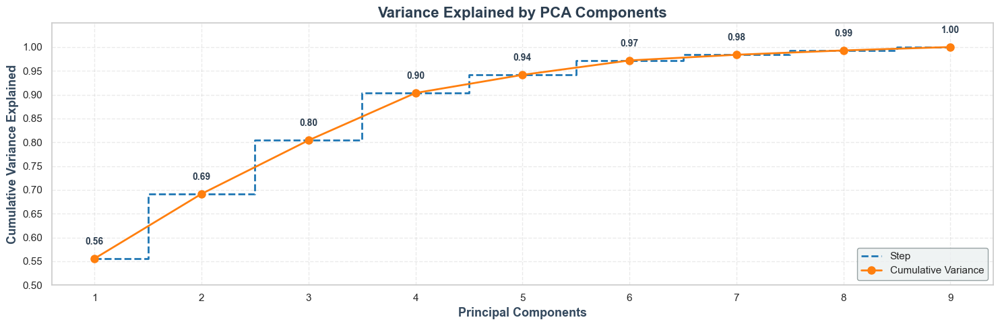

In [441]:
explained_var = pca.explained_variance_ratio_
cumulative_var = np.cumsum(explained_var)

plt.figure(figsize=(15,5))


plt.step(range(1, len(explained_var)+1), cumulative_var, where="mid", 
         color="#1f77b4", linestyle="--", linewidth=2, label="Step")


plt.plot(range(1, len(explained_var)+1), cumulative_var, marker="o", 
         color="#ff7f0e", linewidth=2, markersize=8, label="Cumulative Variance")

for i, v in enumerate(cumulative_var):
    plt.text(i+1, v+0.03, f"{v:.2f}", ha="center", fontsize=10, fontweight="bold", color="#2c3e50")

plt.xlabel("Principal Components", fontsize=13, fontweight="bold", color="#34495e")
plt.ylabel("Cumulative Variance Explained", fontsize=13, fontweight="bold", color="#34495e")
plt.title("Variance Explained by PCA Components", fontsize=16, fontweight="bold", color="#2c3e50")

plt.grid(True, alpha=0.4, linestyle="--")
plt.xticks(range(1, len(explained_var)+1))
plt.yticks(np.arange(0, 1.05, 0.05))
plt.ylim(0.50, 1.05)

plt.legend(frameon=True, fontsize=11, loc="lower right", facecolor="#ecf0f1", edgecolor="#7f8c8d")

plt.tight_layout()
plt.show()


<div style="font-family: Arial, sans-serif; line-height: 1.6; background:#f9f9f9; padding:20px; border-radius:12px; max-width:700px;color:black;">
  <h2>📊 Key Insights</h2>
  
  <h3>Importance of Components:</h3>
  <ul>
    <li>First Component: <b>55% variance</b></li>
    <li>Second Component: <b>68% (≈13% additional)</b></li>
    <li>Third Component: <b>81% (≈13% additional)</b></li>
    <li>Fourth Component: <b>90% (≈9% additional)</b></li>
    <li>Fifth Component: <b>94% (≈4% additional)</b></li>
  </ul>
  <p>→ The first four components contribute most of the variance; the rest have gradually less impact.</p>
  
  <h3>Dimensionality Reduction:</h3>
  <ul>
    <li>If the goal is to cover ≥90% variance, <b>the first 4 components are sufficient</b>.</li>
    <li>The first 5 components cover ~94% of the variance.</li>
    <li>After 6-7 components, the curve flattens → mostly <b>noise</b>.</li>
  </ul>
  
  <h3>Strategic Note for Modeling:</h3>
  <p>To reduce model complexity and avoid <b>overfitting</b>, we can keep only the first 4 or 5 components.<br>
  The rest are mostly redundant.</p>
  
  <h3>Curve Slope:</h3>
  <ul>
    <li><b>At the start:</b> steep slope → important information</li>
    <li><b>After the fourth component:</b> shallow slope → less information, mostly noise</li>
  </ul>
</div>


<div style="font-family: Arial, sans-serif; line-height: 1.6; background:#f9f9f9; padding:20px; border-radius:12px; max-width:700px;color:black;>
  <h2>📊 برداشت‌های مهم</h2>
  
  <h3>اهمیت کامپوننت‌ها:</h3>
  <ul>
    <li>کامپوننت اول: <b>۵۵٪ واریانس</b></li>
    <li>کامپوننت دوم: <b>۶۸٪ (≈ ۱۳٪ اضافه)</b></li>
    <li>کامپوننت سوم: <b>۸۱٪ (≈ ۱۳٪ اضافه)</b></li>
    <li>کامپوننت چهارم: <b>۹۰٪ (≈ ۹٪ اضافه)</b></li>
    <li>کامپوننت پنجم: <b>۹۴٪ (≈ ۴٪ اضافه)</b></li>
  </ul>
  <p>→ کامپوننت‌های اول تا چهارم بیشترین سهم واریانس رو دارن و بقیه کم‌کم تاثیرشون کمه.</p>
  
  <h3>کاهش بعد (Dimensionality Reduction):</h3>
  <ul>
    <li>اگه هدف پوشش دادن ≥ ۹۰٪ واریانس باشه، <b>۴ کامپوننت اول کافی هستند</b>.</li>
    <li>۵ کامپوننت اول تقریباً ۹۴٪ واریانس رو پوشش میدن.</li>
    <li>بعد از ۶-۷ کامپوننت، نمودار تقریباً صاف میشه → بیشتر <b>نویز</b>.</li>
  </ul>
  
  <h3>نکته استراتژیک برای مدل‌سازی:</h3>
  <p>برای کاهش پیچیدگی مدل و جلوگیری از <b>Overfitting</b>، می‌تونیم فقط ۴ یا ۵ کامپوننت اول رو نگه داریم.<br>
  بقیه کامپوننت‌ها تقریباً اضافی هستند.</p>
  
  <h3>شیب نمودار:</h3>
  <ul>
    <li><b>ابتدا:</b> شیب تند → اطلاعات مهم</li>
    <li><b>بعد از کامپوننت چهارم:</b> شیب کم → اطلاعات کمتر و اغلب نویز</li>
  </ul>
</div>


In [442]:
pca_df2 = pca_model.drop(columns = [3,4,5,6,7,8])
pca_df2.head()

,0,1,2
0,-0.711735,0.616184,0.173332
1,-0.730326,0.512569,0.139227
2,-0.694260,0.399015,0.624445
3,-0.562815,0.408417,0.016738
4,-0.526375,0.314637,0.035224


# Here we create a table for charts.

In [443]:
def check_result(data,plot=False):
    if plot:
        plt.style.use("seaborn-v0_8-darkgrid")
        fig, ax = plt.subplots(1, 2)
        ax = np.reshape(ax, (1, 2))
        ax[0, 0] = sns.countplot(data=data, x='cluster', palette="muted", ax=ax[0, 0], hue=analiz["continent"])
        ax[0, 0].set_ylabel('Count',fontsize=14)
        ax[0, 0].set_xticklabels(ax[0, 0].get_xticklabels(), rotation=0)
        for i in range(len(data['cluster'].unique())-1):
            ax[0,0].axvline(i+0.5, color='black', linestyle='--', linewidth=1)
        slices = data['cluster'].value_counts().sort_index().values
        activities = [var for var in data['cluster'].value_counts().sort_index().index]
        ax[0, 1] = plt.pie(slices, labels=activities,
                           colors=sns.color_palette('Blues'), autopct='%1.01f%%')
        plt.title("Percentage",fontsize=14)
        fig.set_size_inches(15, 6)
        fig.suptitle('Count of Each Cluster', fontsize=14)
        plt.show()


In [444]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from kneed import KneeLocator

In [445]:
m1 = model.values
m2 = pca_df2.values 

<div style="
  display: flex;
  justify-content: center;
  align-items: center;
">
  <div style="
    width: 180px;
    padding: 15px 20px;
    border-radius: 12px;
    font-weight: bold;
    font-size: 16px;
    color: #fff;
    background: linear-gradient(135deg, #28054dff 0%, #08214dff 100%);
    box-shadow: 0 0px 7px #06b9b9a7;
    text-align: center;
    transition: transform 0.3s, box-shadow 0.3s;
    cursor: pointer;
  ">
    K_means
  </div>
</div>

<style>

</style>


  <div style="font-size: 22px;width:100%;color: white; text-shadow: 0px 0px 15px rgb(255, 0, 0);text-align: center;">➡️First method ⬅️</div>

In [446]:
data=pd.read_csv("Country-data .csv")
country = data.country
data.drop(columns='country', inplace=True)

# Normalize
scaler = MinMaxScaler().fit_transform(data)
df_0 = pd.DataFrame(scaler, columns=data.columns)

In [447]:
pca = PCA(n_components=9).fit(df_0)
exp = pca.explained_variance_ratio_
print(exp)

[0.55001227 0.13384784 0.12301053 0.09749047 0.03777964 0.03013659
 0.01190434 0.00887791 0.00694042]


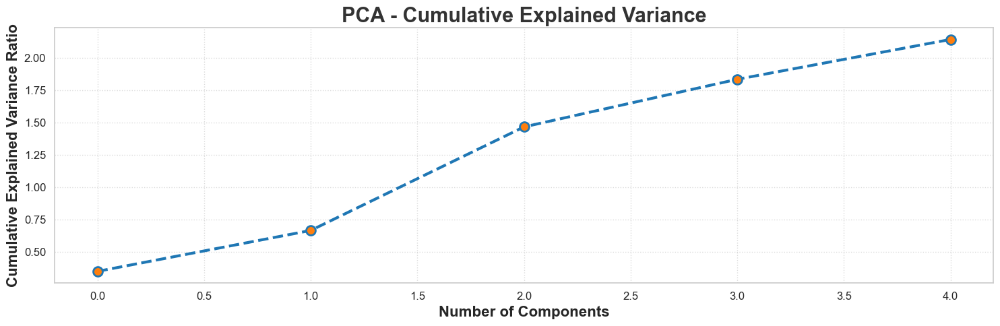

In [448]:

exp = np.random.rand(5) 

plt.figure(figsize=(15,5))
plt.plot(
    np.cumsum(exp), 
    linewidth=3, 
    marker='o', 
    markersize=10, 
    linestyle='--', 
    color='#1f77b4',  
    markerfacecolor='#ff7f0e',  
    markeredgewidth=2
)

plt.title("PCA - Cumulative Explained Variance", fontsize=22, fontweight='bold', color='#333333')
plt.xlabel('Number of Components', fontsize=16, fontweight='bold')
plt.ylabel('Cumulative Explained Variance Ratio', fontsize=16, fontweight='bold')

plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True, linestyle=':', linewidth=1, alpha=0.7)

plt.tight_layout()
plt.show()


In [449]:
from sklearn.decomposition import IncrementalPCA

finla_pca = IncrementalPCA(n_components=5).fit_transform(df_0)
pc = np.transpose(finla_pca)
corrmat = np.corrcoef(pc)

In [450]:
df = pd.DataFrame({
    'PC1':pc[0],
    'PC2':pc[1],
    'PC3':pc[2],
    'PC4':pc[3],
    'PC5':pc[4],
})

In [451]:
best_model = pd.DataFrame(columns=["Algorithm", "Silhouette", "Calinski-Harabasz"])

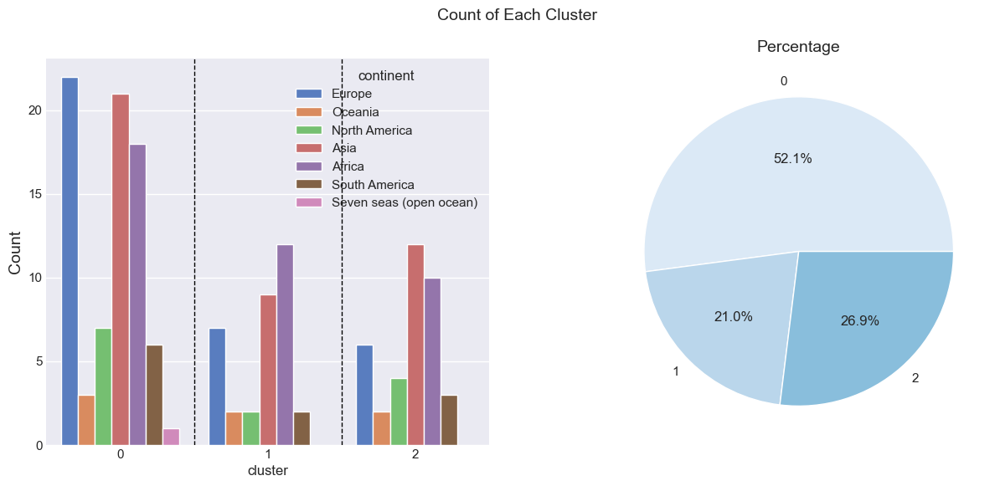

In [452]:

X = df_0.select_dtypes(include=['number']).copy()


kmeans = KMeans(n_clusters=3, random_state=42).fit(X)

df_0['Country'] = country
df_0['km_one'] = kmeans.labels_
df_0['Need'] = df_0['km_one']


poor = df_0.loc[df_0.Country == 'Afghanistan', 'km_one'].values[0]
midle = df_0.loc[df_0.Country == 'Iran', 'km_one'].values[0]
rich = df_0.loc[df_0.Country == 'Canada', 'km_one'].values[0]

df_0.replace({'Need': {poor: 'Poor countries',
                       midle: 'Midle countries',
                       rich: 'Rich countries'}}, inplace=True)


best_model.loc[len(best_model.index)] = [
    "KMeans",
    silhouette_score(X, kmeans.labels_),
    calinski_harabasz_score(X, kmeans.labels_)
]

df_0_kmeans = pd.concat([pd.DataFrame(X), pd.DataFrame({'cluster': kmeans.labels_})], axis=1)
check_result(df_0_kmeans, plot=True)


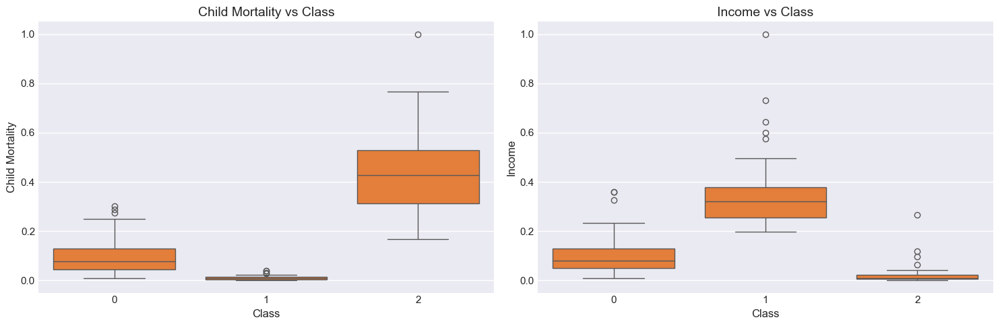

In [453]:
import matplotlib.pyplot as plt
import seaborn as sns

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

sns.boxplot(x='km_one', y='child_mort', data=df_0, color='#FF781F', ax=ax[0])
ax[0].set_title('Child Mortality vs Class', fontsize=14)
ax[0].set_xlabel('Class')
ax[0].set_ylabel('Child Mortality')

sns.boxplot(x='km_one', y='income', data=df_0, color='#FF781F', ax=ax[1])
ax[1].set_title('Income vs Class', fontsize=14)
ax[1].set_xlabel('Class')
ax[1].set_ylabel('Income')

plt.tight_layout()
plt.show()


In [454]:

fig = px.choropleth(df_0[['Country', 'Need']],
                    locationmode='country names',
                    locations='Country',
                    color='Need',
                    color_discrete_map={
                        'Rich countries': 'Green',
                        'Midle countries': 'LightBlue',
                        'Poor countries': 'Red'
                    }
                   )

fig.update_layout(
    margin=dict(l=0, r=0, b=0, t=0, pad=2),
)

fig.show()


<div style="font-size: 22px;width:100%;color: white; text-shadow: 0px 0px 15px rgb(255, 0, 0);text-align: center;">➡️Second method⬅️</div>

In [455]:
k_mean_set={"init":"random","n_init":10,"max_iter":300,"random_state":42}

<div style="background-color:#121212; color:#ffffff; 
            padding:15px; border-radius:10px; 
            font-family:Arial, sans-serif; 
            font-size:18px; width:fit-content; 
            box-shadow:0 0 10px rgba(255,255,255,0.3);">
  Our selected number is <b style="color:green;font-size:24px;box-shadow:0px 0px 9px cyan;border-radius:12px;">3✅</b>
</div>


<div style="margin:auto;width:fit-content;padding:5px 30px 5px 30px;text-align: center; box-shadow: 0px 0px 12px #8c12ca;font-size: 25px;text-shadow: 0px 0px 12px #8c12ca;border-radius: 25px">PCA</div>

In [456]:




sse = {}
sil = []
dbi = []
chi = []
kmax = 10


for k in range(1, kmax):
    kmeans = KMeans(n_clusters=k, max_iter=1000, random_state=42).fit(m2)
    sse[k] = kmeans.inertia_

for k in range(2, kmax+1):
    kmeans = KMeans(n_clusters=k, random_state=42).fit(m2)
    labels = kmeans.labels_
    sil.append(silhouette_score(m2, labels))
    dbi.append(davies_bouldin_score(m2, labels))
    chi.append(calinski_harabasz_score(m2, labels))


highlight_k = 3


fig = make_subplots(
    rows=2, cols=2,
    subplot_titles=("Elbow Method (SSE)", "Silhouette Score",
                    "Davies-Bouldin Index", "Calinski-Harabasz Index")
)

def add_metric_trace(fig, x, y, row, col, color, name, highlight_k, annotation_shift=(0,30)):

    fig.add_trace(
        go.Scatter(x=x, y=y,
                   mode='lines+markers',
                   marker=dict(size=10, color=color, line=dict(width=2, color='black')),
                   line=dict(width=2, color=color),
                   name=name),
        row=row, col=col
    )


    if highlight_k in x:
        idx = x.index(highlight_k)
        highlight_y = y[idx]

    
        fig.add_trace(
            go.Scatter(x=[highlight_k], y=[highlight_y],
                       mode='markers',
                       marker=dict(size=16, color="gold", line=dict(width=3, color="black")),
                       name=f"{name} Highlight"),
            row=row, col=col
        )


        fig.add_shape(type="line",
                      x0=highlight_k, x1=highlight_k,
                      y0=min(y), y1=max(y),
                      line=dict(color="gray", width=2, dash="dash"),
                      row=row, col=col)


        fig.add_annotation(
            x=highlight_k, y=highlight_y,
            text="ok",
            showarrow=True,
            arrowhead=2,
            ax=annotation_shift[0], ay=annotation_shift[1],
            row=row, col=col
        )


add_metric_trace(fig, list(sse.keys()), list(sse.values()), 1, 1, "royalblue", "SSE", highlight_k)
add_metric_trace(fig, list(range(2,kmax+1)), sil, 1, 2, "green", "Silhouette", highlight_k)
add_metric_trace(fig, list(range(2,kmax+1)), dbi, 2, 1, "red", "DBI", highlight_k)
add_metric_trace(fig, list(range(2,kmax+1)), chi, 2, 2, "orange", "CHI", highlight_k)

fig.update_layout(
    height=800,autosize=True,
    title_text="Clustering Evaluation Metrics with Highlighted k=3",
    showlegend=False,
    template="plotly_dark"
)

fig.update_xaxes(dtick=1)

fig.show()


In [457]:

km2 = KMeans(n_clusters=3, max_iter=1000, random_state=42)
km2.fit(m2)


cluster2 = km2.cluster_centers_
centroids2 = np.array(cluster2)


labels2 = km2.labels_


analiz['Class2'] = labels2
pca_df2['Class2'] = labels2


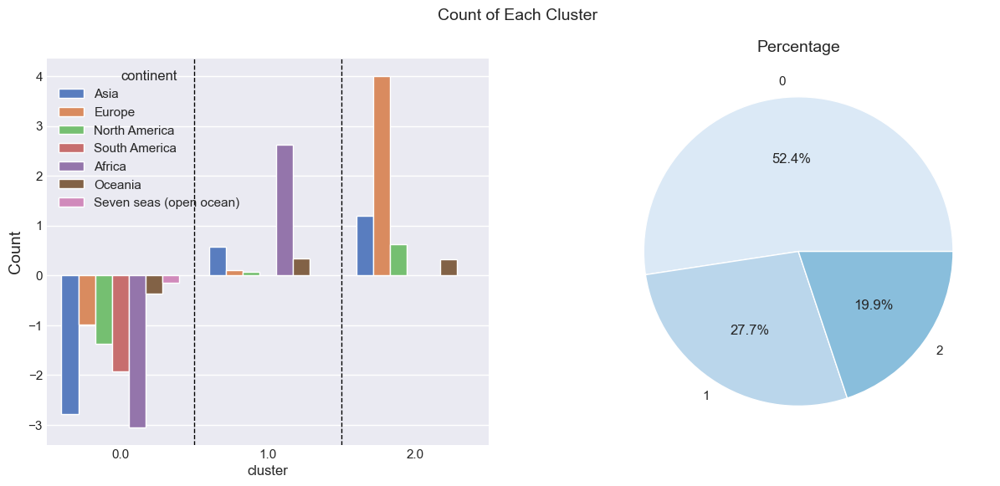

In [458]:

best_model.loc[len(best_model.index)] = [
    "KMeans",
    silhouette_score(m2, labels2),
    calinski_harabasz_score(m2, labels2)
]


df_kmeans = pd.concat([pd.DataFrame(m2), pd.DataFrame({'cluster': labels2})], axis=1)
check_result(df_kmeans, plot=True)

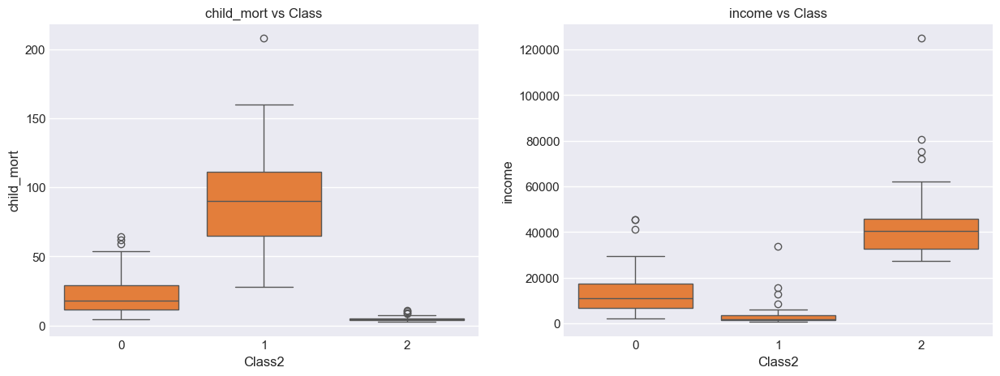

In [459]:
fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (15,5))

plt.subplot(1,2,1)
sns.boxplot(x = 'Class2', y = 'child_mort', data  = analiz, color = '#FF781F');
plt.title('child_mort vs Class')

plt.subplot(1,2,2)
sns.boxplot(x = 'Class2', y = 'income', data  = analiz, color = '#FF781F');
plt.title('income vs Class')

plt.show()

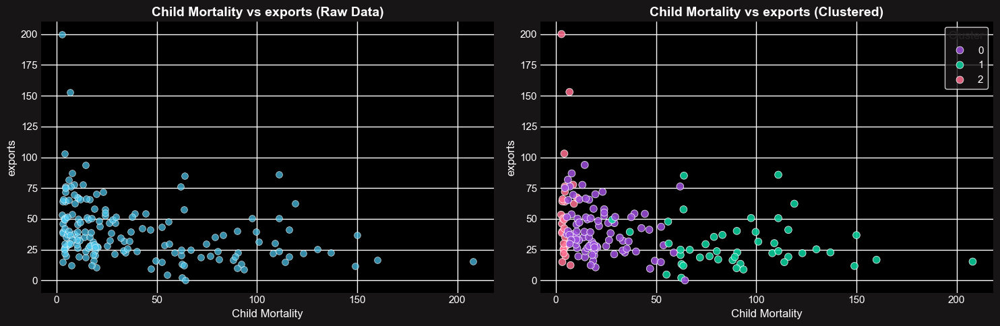

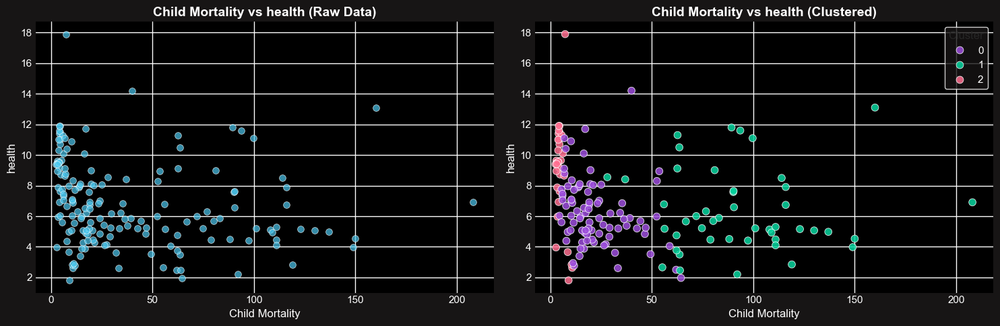

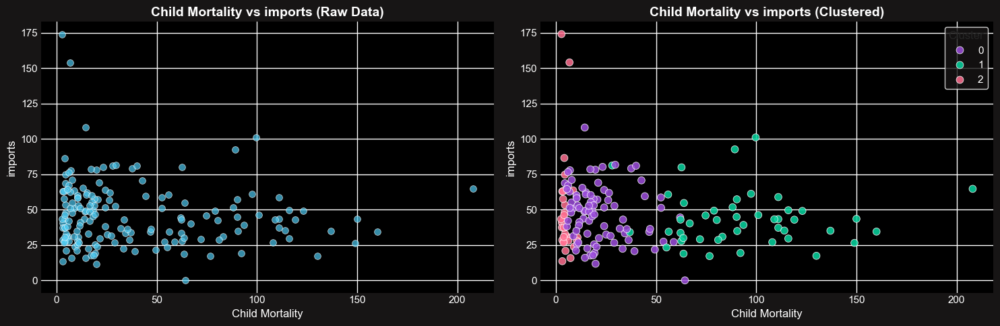

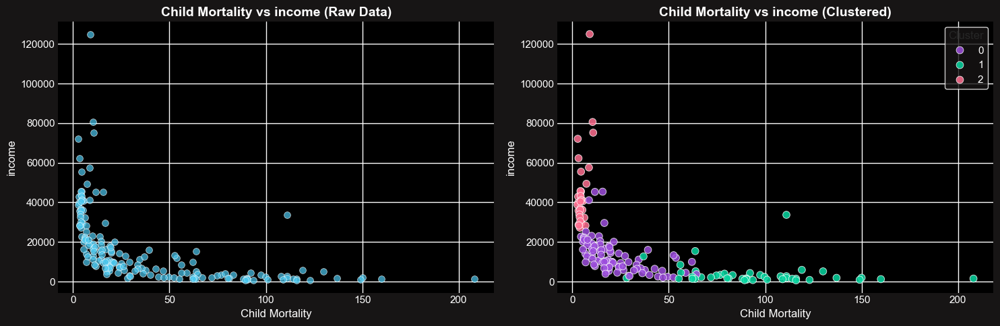

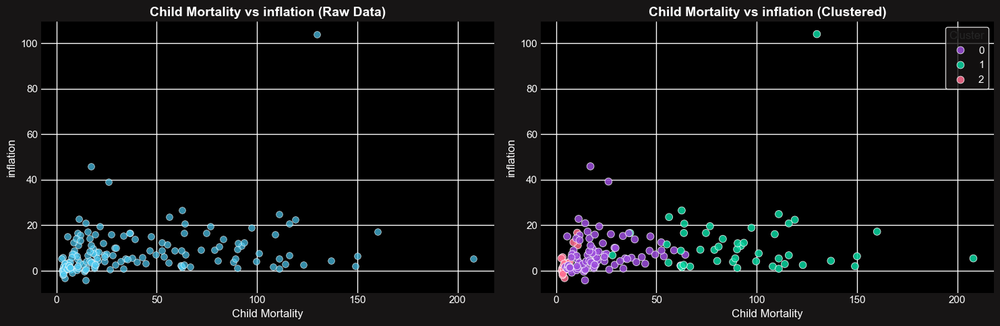

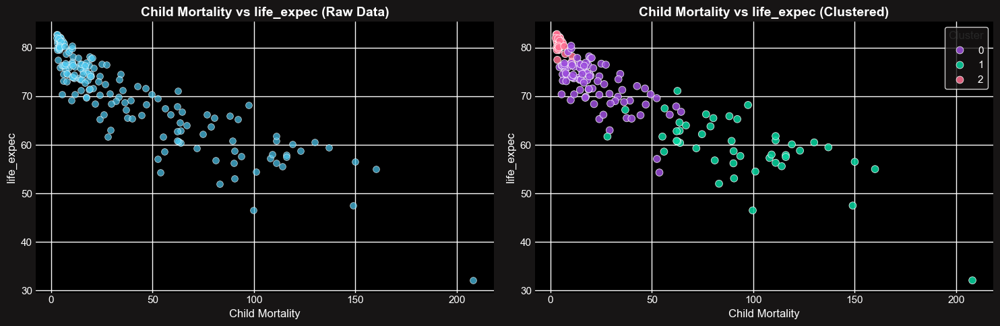

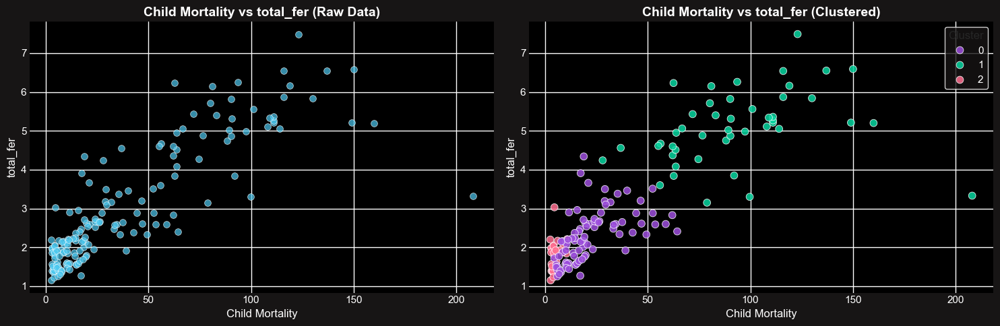

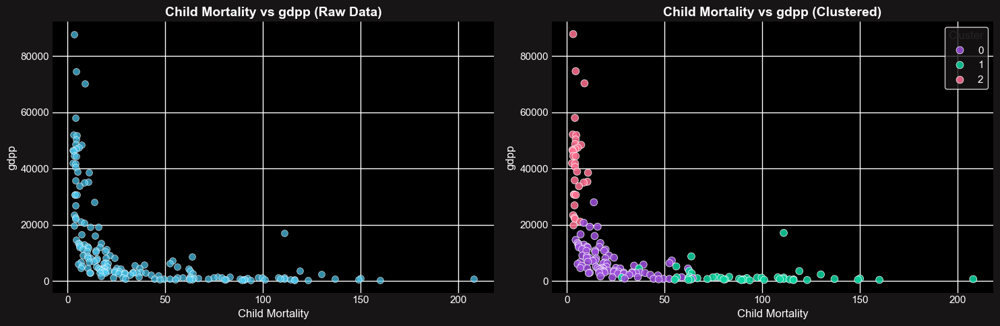

In [460]:
arr = ['exports', 'health', 'imports', 'income', 'inflation',
       'life_expec', 'total_fer', 'gdpp']

palette = ["#9D4EDD", "#06D6A0", "#FF6F91"] 

for x in arr:
    fig, axes = plt.subplots(1, 2, figsize=(15, 5))
    
    fig.patch.set_facecolor("#171515")
    for ax in axes:
        ax.set_facecolor("#000000")
    
    sns.scatterplot(
        x=analiz["child_mort"], 
        y=analiz[x], 
        ax=axes[0], 
        color="#4CC9F0", 
        alpha=0.7, 
        edgecolor="w",
        s=50
    )
    axes[0].set_title(f"Child Mortality vs {x} (Raw Data)", fontsize=14, fontweight="bold", color="white")
    axes[0].set_xlabel("Child Mortality", fontsize=12, color="white")
    axes[0].set_ylabel(x, fontsize=12, color="white")
    axes[0].tick_params(colors="white")
    
    sns.scatterplot(
        x=analiz["child_mort"], 
        y=analiz[x], 
        hue=km2.labels_, 
        palette=palette,
        ax=axes[1], 
        alpha=0.85, 
        edgecolor="w", 
        s=60
    )
    
    axes[1].set_title(f"Child Mortality vs {x} (Clustered)", fontsize=14, fontweight="bold", color="white")
    axes[1].set_xlabel("Child Mortality", fontsize=12, color="white")
    axes[1].set_ylabel(x, fontsize=12, color="white")
    axes[1].tick_params(colors="white")
    axes[1].legend(title="Cluster", loc="best", frameon=True, facecolor="#171515", edgecolor="white", labelcolor="white")
    
    plt.tight_layout()
    plt.show()


In [461]:
pca_df2.insert(0,column = 'Country', value = analiz['country'])



In [462]:
pca_df2['Class2'].loc[pca_df2['Class2'] == 0] = 'No Help Needed'
pca_df2['Class2'].loc[pca_df2['Class2'] == 1] = 'Help Needed'
pca_df2['Class2'].loc[pca_df2['Class2'] == 2] = 'Might Need Help'


fig = px.choropleth(
    pca_df2[['Country','Class2']],
    locationmode='country names',
    locations='Country',
    color='Class2',  
    title='Needed Help Per Country (World)',
    color_discrete_map={
        'Help Needed':'Red',
        'Might Need Help':'Yellow',
        'No Help Needed': 'Green'
    }
)

fig.update_geos(fitbounds="locations", visible=True)
fig.update_layout(
    legend_title_text='Labels',
    legend_title_side='top',
    title_pad_l=260,
    title_y=0.86
)

fig.show(engine='kaleido')


In [463]:
import plotly.graph_objects as go
model['Class_km2'] = km2.labels_
X = model[['Health', 'Trade', 'Finance']].values
labels = model['Class_km2'].values
centroids = np.array([
    X[labels == i].mean(axis=0) for i in np.unique(labels)
])

scatter = go.Scatter3d(
    x=X[:,0],
    y=X[:,1],
    z=X[:,2],
    mode='markers',
    marker=dict(
        size=5,
        color=labels,    
        colorscale='Viridis',
        opacity=0.8,
        line=dict(width=0.5, color='black')
    ),
    text=[f'Class_km2: {l}' for l in labels], 
    hoverinfo='text'
)


centroid_scatter = go.Scatter3d(
    x=centroids[:,0],
    y=centroids[:,1],
    z=centroids[:,2],
    mode='markers',
    marker=dict(
        size=5,
        color='red',
        symbol='x',
        line=dict(color='black', width=2)
    ),
    name='Centroids'
)

layout = go.Layout(
    scene=dict(
        xaxis_title='Health',
        yaxis_title='Trade',
        zaxis_title='Finance',
        aspectmode='cube',
        camera=dict(
            eye=dict(x=1.2, y=1.2, z=1.2) 
        )
    ),
    title='3D Scatter with KMeans Clusters',
    autosize=True,
    height=500    
)




fig = go.Figure(data=[scatter, centroid_scatter], layout=layout)
fig.show()


روش 2 

<div style="
  display: flex;
  justify-content: center;
  align-items: center;
">
  <div style="
    width: 180px;
    padding: 15px 20px;
    border-radius: 12px;
    font-weight: bold;
    font-size: 16px;
    color: #fff;
    background: linear-gradient(135deg, #4d0505ff 0%, #084d48ff 100%);
    box-shadow: 0 0px 7px #2a06b9a7;
    text-align: center;
    transition: transform 0.3s, box-shadow 0.3s;
    cursor: pointer;
  ">
    DBSCAN
  </div>
</div>

<style>

</style>


In [464]:
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors
from itertools import product

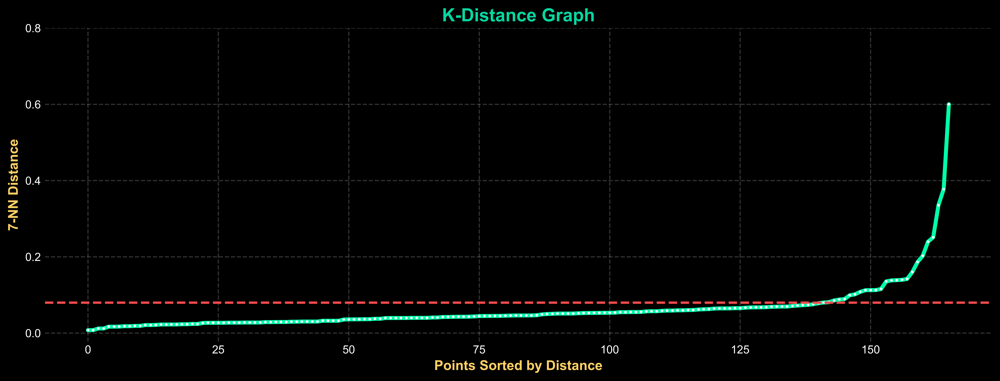

In [465]:

knn = NearestNeighbors(n_neighbors=7)
model_kn = knn.fit(m1)


distances, indices = knn.kneighbors(m1)
distances = np.sort(distances, axis=0)
distances = distances[:,1]


plt.style.use("dark_background")

plt.figure(figsize=(15,5), dpi=600)


plt.plot(distances, 
         color="#00FFAA",          
         linewidth=3.5, 
         marker='*', 
         markersize=2, 
         markerfacecolor='black',  
         markeredgecolor='white')  


plt.axhline(y=0.08, color='#FF4C4C', linestyle='--', linewidth=2)

plt.yticks(np.arange(0, max(distances)+0.2, 0.2), color='white', fontsize=10)
plt.xticks(color='white', fontsize=10)


plt.grid(True, linestyle='--', alpha=0.4, color='gray')


plt.xlabel('Points Sorted by Distance', fontsize=12, fontweight='bold', color='#FFD166')
plt.ylabel('7-NN Distance', fontsize=12, fontweight='bold', color='#FFD166')
plt.title('K-Distance Graph', fontsize=16, fontweight='bold', color='#06D6A0')

plt.show()



   <h2>DBSCAN Parameter Selection</h2>
    <ul>
        <li>We select <b>minPts = 8</b>, since it must be <b>≥ 2 × number of features (3)</b>.</li>
        <li>The value assigned to <b>n_neighbors</b> is:<br>
            <code>n_neighbors = minPts - 1 = 7</code>
        </li>
        <li>From the k-distance graph, we select:<br>
            <code>eps = 0.08</code>
        </li>
    </ul>


In [466]:
db = DBSCAN(eps = 0.08, min_samples = 8).fit(m1)
core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)
print('Number of Clusters : ', n_clusters_)
print('Number of Outliers : ', n_noise_)

analiz['Class3'] = labels
# model['Class3'] = labels

Number of Clusters :  3
Number of Outliers :  66


In [467]:
print(analiz['Class3'].value_counts())


Class3
 1    83
-1    66
 0     9
 2     8
Name: count, dtype: int64


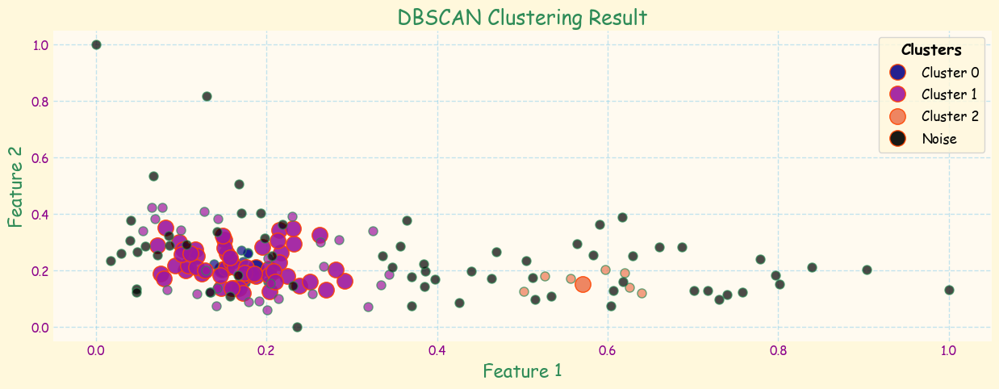

In [468]:

from matplotlib import font_manager

plt.rcParams['figure.facecolor'] = '#FFF8DC'  
plt.rcParams['axes.facecolor'] = '#FFFAF0'    
plt.rcParams['axes.edgecolor'] = '#FF4500'    
plt.rcParams['axes.labelcolor'] = '#2E8B57'   
plt.rcParams['xtick.color'] = '#8B008B'
plt.rcParams['ytick.color'] = '#8B008B'
plt.rcParams['grid.color'] = '#87CEEB'
plt.rcParams['grid.linestyle'] = '--'
plt.rcParams['font.size'] = 14
plt.rcParams['font.family'] = 'Comic Sans MS'


unique_labels = set(labels)
colors = [plt.cm.plasma(each) for each in np.linspace(0, 1, len(unique_labels))]

plt.figure(figsize=(15, 5), dpi=100)

for k, col in zip(unique_labels, colors):
    if k == -1:  
        col = [0, 0, 0, 1]   
        label_name = "Noise"
    else:
        label_name = f"Cluster {k}"
    
    class_member_mask = labels == k

    xy = m1[class_member_mask & core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], "o", 
             markerfacecolor=tuple(col), 
             markeredgecolor="#FF4500", 
             markersize=14,
             alpha=0.9,
             label=label_name if k != -1 else "Noise")

    xy = m1[class_member_mask & ~core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], "o", 
             markerfacecolor=tuple(col), 
             markeredgecolor="#2E8B57", 
             markersize=8,
             alpha=0.7)


plt.legend(title="Clusters", fontsize=12, loc="best", frameon=True, facecolor='#FFF8DC', labelcolor='black')

plt.gca().get_legend().get_title().set_color('black')  
plt.gca().get_legend().get_title().set_fontsize(14)  
plt.gca().get_legend().get_title().set_fontweight('bold')  



plt.grid(True, alpha=0.5)
plt.xlabel("Feature 1", fontsize=16)
plt.ylabel("Feature 2", fontsize=16)
plt.title("DBSCAN Clustering Result", fontsize=18, color="#2E8B57")
plt.show()


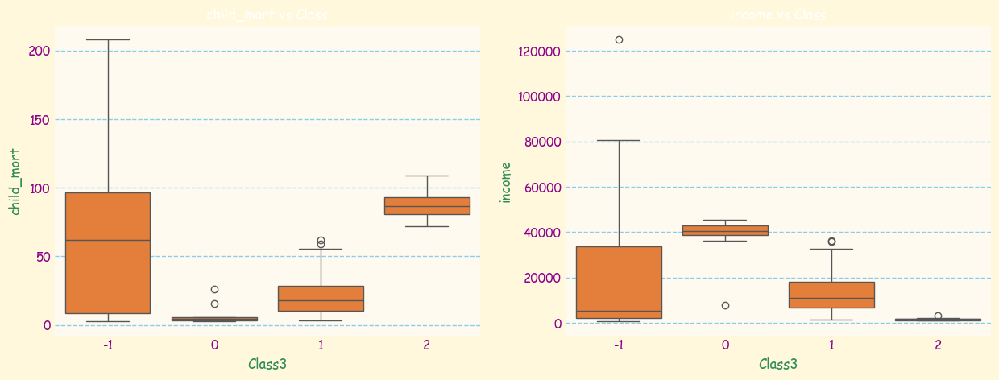

In [469]:
fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (15,5))

plt.subplot(1,2,1)
sns.boxplot(x = 'Class3', y = 'child_mort', data  = analiz, color = '#FF781F');
plt.title('child_mort vs Class')

plt.subplot(1,2,2)
sns.boxplot(x = 'Class3', y = 'income', data  = analiz, color = '#FF781F');
plt.title('income vs Class')

plt.show()

<div style="font-family: Arial, sans-serif; background-color: #f4f4f4; padding: 20px; border-radius: 8px; border: 1px solid #ddd; color: #333;width:fit-content">
    <h3 style="color: #2E8B57;">DBSCAN Cluster Labels</h3>
    <ul style="list-style-type: none; padding-left: 0;">
        <li style="font-size: 16px; margin: 5px 0; color: #FF6347;">
            <strong>-1</strong>: Noise / Outliers
        </li>
        <li style="font-size: 16px; margin: 5px 0; color: #FFA500;">
            <strong>0</strong>: Might Need Help
        </li>
        <li style="font-size: 16px; margin: 5px 0; color: #32CD32;">
            <strong>1</strong>: No Help Needed
        </li>
        <li style="font-size: 16px; margin: 5px 0; color: #FF4500;">
            <strong>2</strong>: Help Needed
        </li>
    </ul>
</div>


In [470]:
import plotly.express as px
# analiz.insert(0,column = 'Country', value = analiz['country'])
analiz['Class3'] = analiz['Class3'].map({
    0: 'No Help Needed',
    1: 'Might Need Help',
    2: 'Help Needed',
    -1:"Noise / Outliers"
})

fig = px.choropleth(
    analiz,
    locationmode="country names",
    locations="Country",
    title="Needed Help Per Country (World)",
    color="Class3",
    color_discrete_map={
        'Help Needed': 'Red',
        'No Help Needed': 'Green',
        'Might Need Help': 'Yellow'
    }
)

fig.update_geos(fitbounds="locations", visible=True)
fig.update_layout(
    legend_title_text='Labels',
    legend_title_side='top',
    title_pad_l=260,
    title_y=0.86
)
fig.show()


# PCA Data


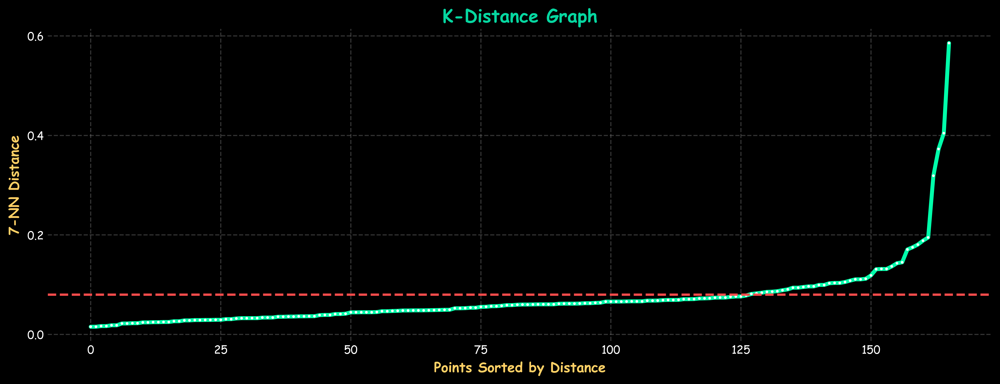

In [471]:

knn = NearestNeighbors(n_neighbors=7)
model_kn = knn.fit(m2)


distances, indices = knn.kneighbors(m2)
distances = np.sort(distances, axis=0)
distances = distances[:,1]


plt.style.use("dark_background")

plt.figure(figsize=(15,5), dpi=600)


plt.plot(distances, 
         color="#00FFAA",          
         linewidth=3.5, 
         marker='*', 
         markersize=2, 
         markerfacecolor='black',  
         markeredgecolor='white')  


plt.axhline(y=0.08, color='#FF4C4C', linestyle='--', linewidth=2)

plt.yticks(np.arange(0, max(distances)+0.2, 0.2), color='white', fontsize=10)
plt.xticks(color='white', fontsize=10)


plt.grid(True, linestyle='--', alpha=0.4, color='gray')


plt.xlabel('Points Sorted by Distance', fontsize=12, fontweight='bold', color='#FFD166')
plt.ylabel('7-NN Distance', fontsize=12, fontweight='bold', color='#FFD166')
plt.title('K-Distance Graph', fontsize=16, fontweight='bold', color='#06D6A0')

plt.show()


In [472]:

from itertools import product
from sklearn.metrics import silhouette_score, calinski_harabasz_score

eps_values = np.arange(0.01,0.25,0.01) 
min_samples = np.arange(2,20,5) 
DBSCAN_params = list(product(eps_values, min_samples))

silhouette = []
num_of_clusters = []
calinski_harabasz = []

for param in DBSCAN_params:
    dbscan = DBSCAN(eps=param[0], min_samples=param[1])
    dbscan.fit(m2)
    
    labels = dbscan.labels_

    n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
    num_of_clusters.append(n_clusters)

    if n_clusters > 1:
        silhouette.append(silhouette_score(m2, labels))
        calinski_harabasz.append(calinski_harabasz_score(m2, labels))
    else:
        silhouette.append(np.nan)
        calinski_harabasz.append(np.nan)


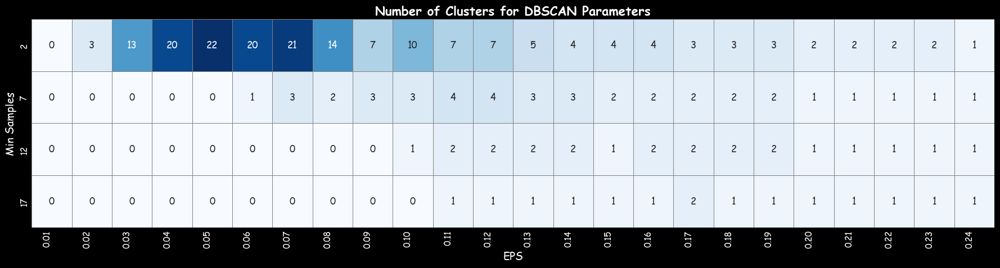

In [473]:

tmp = pd.DataFrame.from_records(DBSCAN_params, columns=['EPS', 'Min'])
tmp['ClustersNumber'] = num_of_clusters


p = pd.pivot_table(tmp, values='ClustersNumber', index='Min', columns='EPS')


fig, ax = plt.subplots(figsize=(18, 5))
sns.heatmap(
    p,
    annot=True,
    annot_kws={"size": 12},
    cmap="Blues",
    linewidths=0.5,
    linecolor='gray',
    ax=ax,
    cbar=False
)

ax.set_title('Number of Clusters for DBSCAN Parameters', fontsize=16, weight='bold')
ax.set_xlabel('EPS', fontsize=14)
ax.set_ylabel('Min Samples', fontsize=14)
ax.set_xticklabels([f'{x:.2f}' for x in p.columns], rotation=90, ha='right')

plt.tight_layout()
plt.show()


In [474]:
db1 = DBSCAN(eps = 0.14, min_samples = 7).fit(m2)
core_samples_mask = np.zeros_like(db1.labels_, dtype=bool)
core_samples_mask[db1.core_sample_indices_] = True
labels = db1.labels_

# Number of clusters in labels, ignoring noise if present
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)
print('Number of Clusters : ', n_clusters_)
print('Number of Outliers : ', n_noise_)

analiz['Class_pca3'] = labels
pca_df2['Class_pca3'] = labels

Number of Clusters :  3
Number of Outliers :  26


In [475]:
print(analiz['Class_pca3'].value_counts())



Class_pca3
 1    116
-1     26
 0     18
 2      6
Name: count, dtype: int64


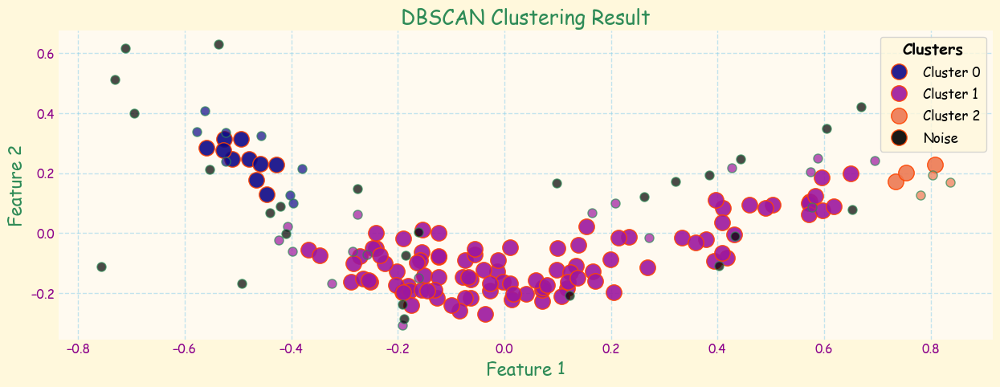

In [476]:

from matplotlib import font_manager

plt.rcParams['figure.facecolor'] = '#FFF8DC'  
plt.rcParams['axes.facecolor'] = '#FFFAF0'    
plt.rcParams['axes.edgecolor'] = '#FF4500'    
plt.rcParams['axes.labelcolor'] = '#2E8B57'   
plt.rcParams['xtick.color'] = '#8B008B'
plt.rcParams['ytick.color'] = '#8B008B'
plt.rcParams['grid.color'] = '#87CEEB'
plt.rcParams['grid.linestyle'] = '--'
plt.rcParams['font.size'] = 14
plt.rcParams['font.family'] = 'Comic Sans MS'


unique_labels = set(labels)
colors = [plt.cm.plasma(each) for each in np.linspace(0, 1, len(unique_labels))]

plt.figure(figsize=(15, 5), dpi=100)

for k, col in zip(unique_labels, colors):
    if k == -1:  
        col = [0, 0, 0, 1]   
        label_name = "Noise"
    else:
        label_name = f"Cluster {k}"
    
    class_member_mask = labels == k

    xy = m2[class_member_mask & core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], "o", 
             markerfacecolor=tuple(col), 
             markeredgecolor="#FF4500", 
             markersize=14,
             alpha=0.9,
             label=label_name if k != -1 else "Noise")

    xy = m2[class_member_mask & ~core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], "o", 
             markerfacecolor=tuple(col), 
             markeredgecolor="#2E8B57", 
             markersize=8,
             alpha=0.7)


plt.legend(title="Clusters", fontsize=12, loc="best", frameon=True, facecolor='#FFF8DC', labelcolor='black')

plt.gca().get_legend().get_title().set_color('black')  
plt.gca().get_legend().get_title().set_fontsize(14)  
plt.gca().get_legend().get_title().set_fontweight('bold')  



plt.grid(True, alpha=0.5)
plt.xlabel("Feature 1", fontsize=16)
plt.ylabel("Feature 2", fontsize=16)
plt.title("DBSCAN Clustering Result", fontsize=18, color="#2E8B57")
plt.show()


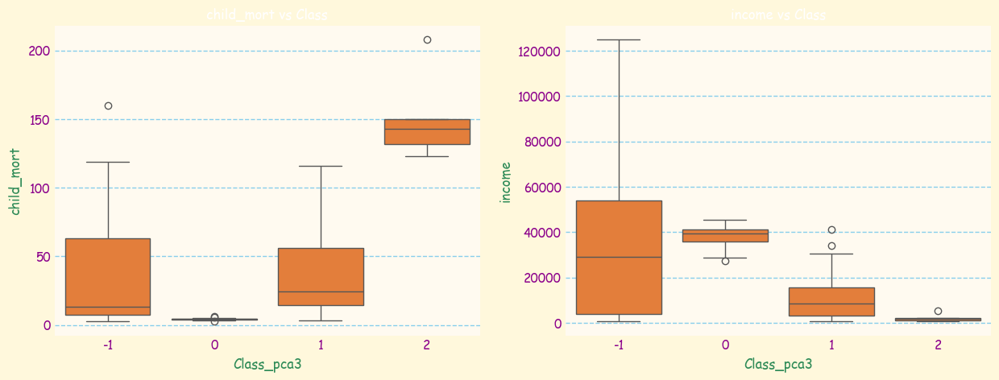

In [477]:
fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (15,5))

plt.subplot(1,2,1)
sns.boxplot(x = 'Class_pca3', y = 'child_mort', data  = analiz, color = '#FF781F');
plt.title('child_mort vs Class')

plt.subplot(1,2,2)
sns.boxplot(x = 'Class_pca3', y = 'income', data  = analiz, color = '#FF781F');
plt.title('income vs Class')

plt.show()

In [478]:
pca_df2['Class_pca3'].loc[pca_df2['Class_pca3'] == -1] = 'Noise / Outliers'
pca_df2['Class_pca3'].loc[pca_df2['Class_pca3'] == 0] = 'No Help Needed'
pca_df2['Class_pca3'].loc[pca_df2['Class_pca3'] == 1] = 'Might Need Help'
pca_df2['Class_pca3'].loc[pca_df2['Class_pca3'] == 2] ='Help Needed'

fig = px.choropleth(pca_df2[['Country','Class_pca3']],
                    locationmode = 'country names',
                    locations = 'Country',
                    title = 'Needed Help Per Country (World)',
                    color_discrete_sequence=["orange", "red", "green",'black'],
                    color = pca_df2['Class_pca3'],  
                    color_discrete_map={'Noise / Outliers' : 'Black',
                                        'Help Needed':'Red',
                                        'Might Need Help':'Yellow',
                                        'No Help Needed':'Green'})
fig.update_geos(fitbounds = "locations", visible = True)
fig.update_layout(legend_title_text = 'Labels',legend_title_side = 'top',title_pad_l = 260,title_y = 0.86)
fig.show(engine = 'kaleido')

<div style="
  display: flex;
  justify-content: center;
  align-items: center;
">
  <div style="
    width: 180px;
    padding: 15px 20px;
    border-radius: 12px;
    font-weight: bold;
    font-size: 16px;
    color: #fff;
    background: linear-gradient(135deg, #ceaf00ff 0%, #0a4d08ff 100%);
    box-shadow: 0 0px 7px #2a06b9a7;
    text-align: center;
    transition: transform 0.3s, box-shadow 0.3s;
    cursor: pointer;
  ">
    Hierarchical 
  </div>
</div>

<style>

</style>


In [479]:
from scipy.cluster.hierarchy import dendrogram, linkage

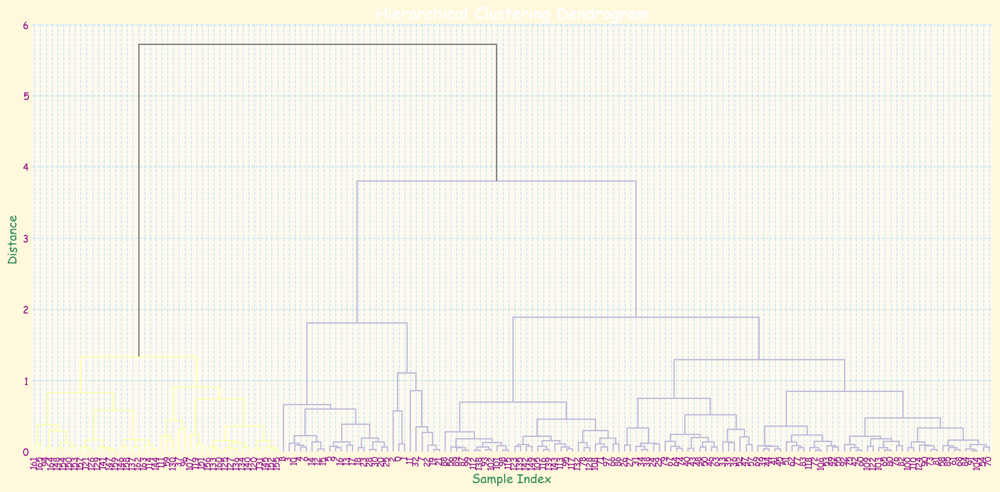

In [480]:
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage

linkage_data = linkage(m2, method='ward', metric='euclidean')

plt.figure(figsize=(16, 8))
dend = dendrogram(
    linkage_data,
    leaf_rotation=90,
    leaf_font_size=10,
    color_threshold=0.7*max(linkage_data[:,2]),
    above_threshold_color='grey'
)

plt.title('Hierarchical Clustering Dendrogram', fontsize=18, fontweight='bold')
plt.xlabel('Sample Index', fontsize=14)
plt.ylabel('Distance', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.5)

plt.xticks(rotation=90, fontsize=10) 
plt.tight_layout()
plt.show()


In [481]:
from sklearn.cluster import AgglomerativeClustering

hierarchical_cluster = AgglomerativeClustering(
    n_clusters=3, 
    linkage='ward', 
   
)
labels = hierarchical_cluster.fit_predict(m1)
pred_agc = pd.Series(labels)
pred_agc = pd.Series(hierarchical_cluster.labels_)
analiz['Class-Hierarchical'] = pred_agc
model['Class-Hierarchical'] = pred_agc

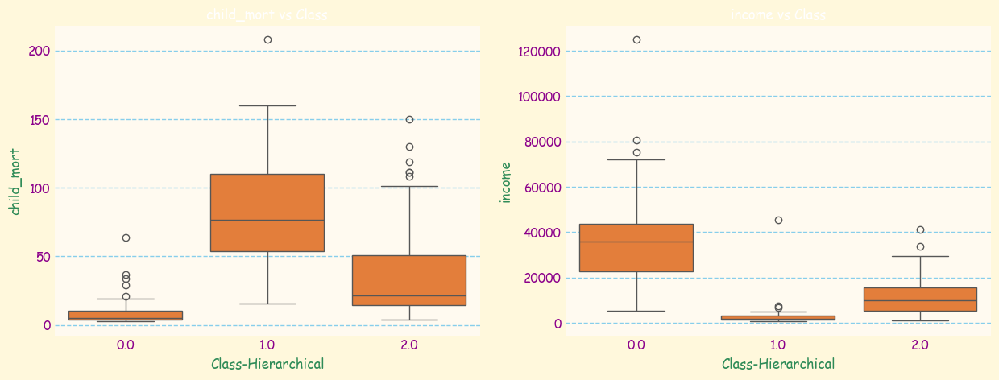

In [482]:
fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (15,5))

plt.subplot(1,2,1)
sns.boxplot(x = 'Class-Hierarchical', y = 'child_mort', data  = analiz, color = '#FF781F')
plt.title('child_mort vs Class')

plt.subplot(1,2,2)
sns.boxplot(x = 'Class-Hierarchical', y = 'income', data  = analiz, color = '#FF781F')
plt.title('income vs Class')

plt.show()

In [483]:
model['Country'] = df_0['Country']
model['Class-Hierarchical'].loc[model['Class-Hierarchical'] == 0] = 'No Help Needed'
model['Class-Hierarchical'].loc[model['Class-Hierarchical'] == 1] = 'Help Needed'
model['Class-Hierarchical'].loc[model['Class-Hierarchical'] == 2] = 'Might Need Help'

fig = px.choropleth(model[['Country','Class-Hierarchical']],
                    locationmode = 'country names',
                    locations = 'Country',
                    title = 'Needed Help Per Country (World)',
                    color = model['Class-Hierarchical'],  
                    color_discrete_map = {'Help Needed' : 'Red',
                                          'Might Need Help' : 'Yellow',
                                          'No Help Needed' : 'Green'})
fig.update_geos(fitbounds = "locations", visible = True)
fig.update_layout(legend_title_text = 'Labels',legend_title_side = 'top',title_pad_l = 260,title_y = 0.86)
fig.show(engine = 'kaleido')

# pca

In [484]:
pcc= pd.DataFrame({
    'PC1':pc[0],
    'PC2':pc[1],
    'PC3':pc[2],
    'PC4':pc[3],
})

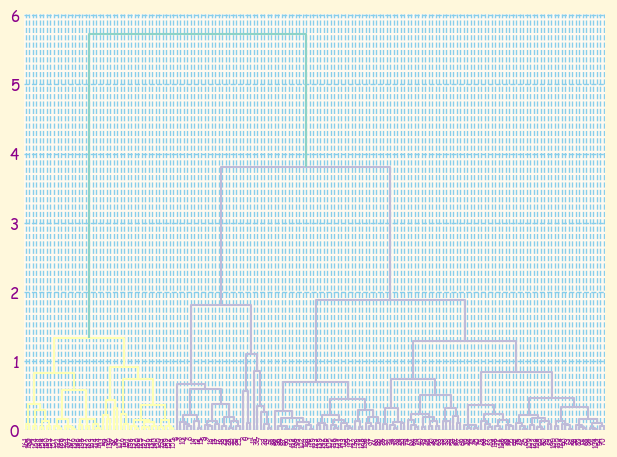

In [485]:
linkage_data = linkage(m2, method = 'ward', metric = 'euclidean')
dendrogram(linkage_data)
plt.tight_layout()
plt.show()

In [486]:
from sklearn.cluster import AgglomerativeClustering
import pandas as pd


hierarchical_cluster = AgglomerativeClustering(
    n_clusters=3,
    linkage='ward'
)
labels_agc = hierarchical_cluster.fit_predict(m2)


pred_agc = pd.Series(labels_agc, name='Class-Hierarchical2')


analiz = analiz.reset_index(drop=True)
pca_df2 = pca_df2.reset_index(drop=True)


analiz['Class-Hierarchical2'] = pred_agc
pca_df2['Class-Hierarchical2'] = pred_agc


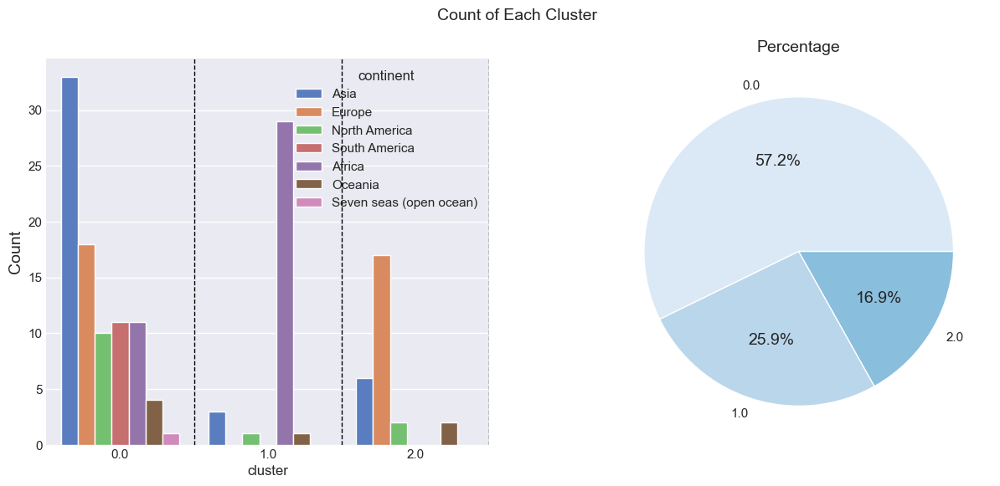

In [487]:
best_model.loc[len(best_model.index)] = [
    "Agglomerative",
    silhouette_score(m2, pred_agc),
    calinski_harabasz_score(m2, pred_agc)
]

df_agc = pd.concat([pcc.reset_index(drop=True), pd.DataFrame({'cluster': pred_agc})], axis=1)

check_result(df_agc, plot=True)


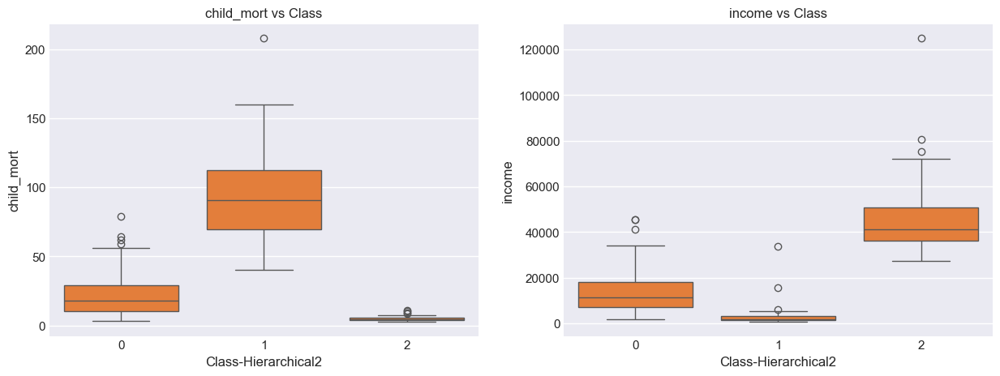

In [488]:
fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (15,5))

plt.subplot(1,2,1)
sns.boxplot(x = 'Class-Hierarchical2', y = 'child_mort', data  = analiz, color = '#FF781F')
plt.title('child_mort vs Class')

plt.subplot(1,2,2)
sns.boxplot(x = 'Class-Hierarchical2', y = 'income', data  = analiz, color = '#FF781F')
plt.title('income vs Class')

plt.show()

In [489]:
pca_df2['Class-Hierarchical2'].loc[pca_df2['Class-Hierarchical2'] == 0] = 'Might Need Help'
pca_df2['Class-Hierarchical2'].loc[pca_df2['Class-Hierarchical2'] == 1] = 'Help Needed'
pca_df2['Class-Hierarchical2'].loc[pca_df2['Class-Hierarchical2'] == 2] = 'No Help Needed'

fig = px.choropleth(pca_df2[['Country','Class-Hierarchical2']],
                    locationmode = 'country names',
                    locations = 'Country',
                    title = 'Needed Help Per Country (World)',
                    color = pca_df2['Class-Hierarchical2'],  
                    color_discrete_map={'Help Needed':'Red',
                                        'Might Need Help':'Yellow',
                                        'No Help Needed':'Green'})
fig.update_geos(fitbounds = "locations", visible = True)
fig.update_layout(legend_title_text = 'Labels',legend_title_side = 'top',title_pad_l = 260,title_y = 0.86)
fig.show(engine = 'kaleido')

<div style="
  display: flex;
  justify-content: center;
  align-items: center;
">
  <div style="
    width: 180px;
    padding: 15px 20px;
    border-radius: 12px;
    font-weight: bold;
    font-size: 16px;
    color: #fff;
    background: linear-gradient(135deg,rgb(16, 5, 77) 0%, #084d48ff 100%);
    box-shadow: 0 0px 7pxrgba(255, 255, 255, 0.66);
    text-align: center;
    transition: transform 0.3s, box-shadow 0.3s;
    cursor: pointer;
  ">
    Mean Shift
  </div>
</div>

<style>

</style>


In [490]:
from sklearn.cluster import MeanShift, estimate_bandwidth
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.decomposition import IncrementalPCA
from sklearn.metrics import silhouette_score, calinski_harabasz_score

In [491]:

numeric_cols = df_0.select_dtypes(include=['int64', 'float64']).columns

scaler = MinMaxScaler().fit_transform(df_0[numeric_cols])

df_0_0 = pd.DataFrame(scaler, columns=numeric_cols)


for col in df_0.columns:
    if col not in numeric_cols:
        df_0_0[col] = df_0[col]

df_0_0.head()


,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,Country,km_one,Need
0,0.426485,0.049482,0.358608,0.257765,0.008047,0.126144,0.475345,0.736593,0.003073,Afghanistan,2,Poor countries
1,0.068160,0.139531,0.294593,0.279037,0.074933,0.080399,0.871795,0.078864,0.036833,Albania,0,Midle countries
2,0.120253,0.191559,0.146675,0.180149,0.098809,0.187691,0.875740,0.274448,0.040365,Algeria,0,Midle countries
3,0.566699,0.311125,0.064636,0.246266,0.042535,0.245911,0.552268,0.790221,0.031488,Angola,2,Poor countries
4,0.037488,0.227079,0.262275,0.338255,0.148652,0.052213,0.881657,0.154574,0.114242,Antigua and Barbuda,0,Midle countries


In [492]:
from sklearn.decomposition import PCA

# فقط ستون‌های عددی رو نگه دار
df_num = df_0.select_dtypes(include=['number'])

# اجرای PCA
pca = PCA(n_components=9).fit(df_num)
exp = pca.explained_variance_ratio_
print(exp)


[0.80101479 0.10291566 0.03291075 0.02586007 0.01265877 0.0098419
 0.00763126 0.00304471 0.00231347]


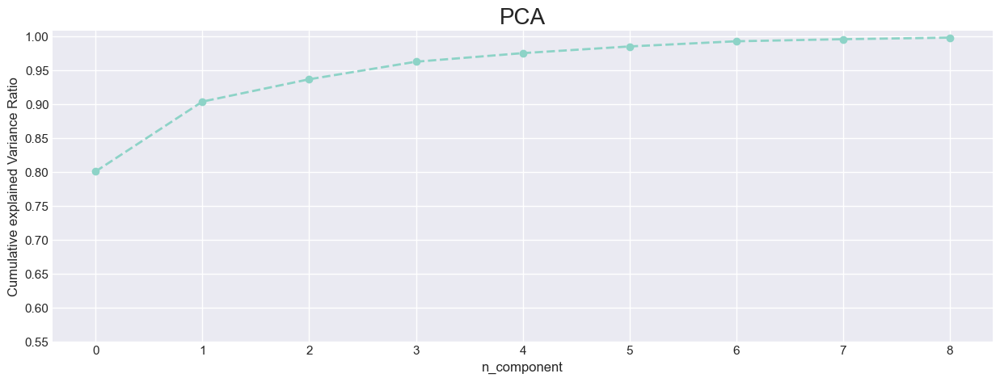

In [493]:
plt.figure(figsize=(15,5))
plt.plot(np.cumsum(exp), linewidth=2, marker = 'o', linestyle = '--')
plt.title("PCA", fontsize=20)
plt.xlabel('n_component')
plt.ylabel('Cumulative explained Variance Ratio')

plt.yticks(np.arange(0.55, 1.05, 0.05))
plt.show()

In [494]:
from sklearn.decomposition import IncrementalPCA
import numpy as np

# فقط ستون‌های عددی رو نگه دار
df_num = df_0.select_dtypes(include=['number'])

# اجرای IncrementalPCA
final_pca = IncrementalPCA(n_components=5).fit_transform(df_num)

# محاسبه ماتریس همبستگی
pc = np.transpose(final_pca)
corrmat = np.corrcoef(pc)

print(corrmat)


[[ 1.00000000e+00 -1.20674538e-05  3.07462374e-05  1.16705039e-05
  -9.46183917e-06]
 [-1.20674538e-05  1.00000000e+00 -2.74708955e-04 -7.31223535e-05
  -1.44559446e-04]
 [ 3.07462374e-05 -2.74708955e-04  1.00000000e+00 -1.42210645e-04
  -9.47048386e-04]
 [ 1.16705039e-05 -7.31223535e-05 -1.42210645e-04  1.00000000e+00
   4.22241020e-03]
 [-9.46183917e-06 -1.44559446e-04 -9.47048386e-04  4.22241020e-03
   1.00000000e+00]]


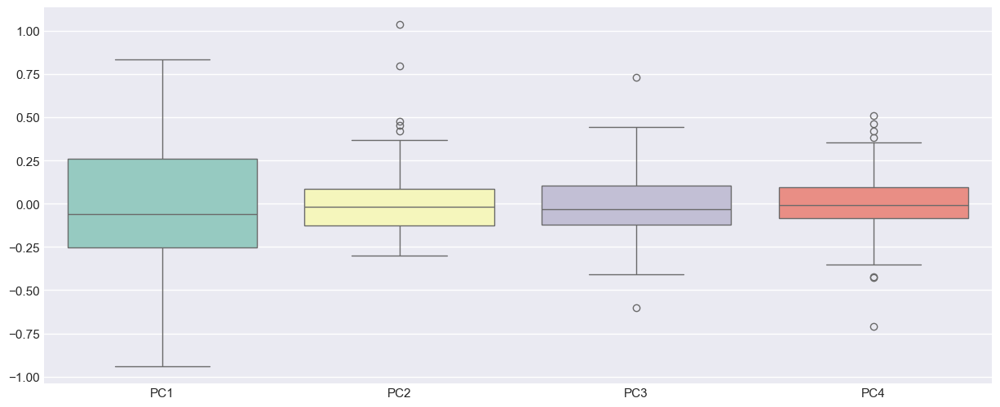

In [495]:
fig, ax = plt.subplots(figsize=(15,6))
sns.boxplot(data=pcc)
plt.show()

In [496]:
best_model = pd.DataFrame({'model':[], 'sil_score':[], 'ch_score':[]})

In [497]:
bandwidth = estimate_bandwidth(pcc, n_samples=10, n_jobs=-1)
m_shift = MeanShift(bandwidth=bandwidth)
m_shift.fit(pcc)
pred = m_shift.labels_
np.unique(pred)
sh_score = silhouette_score(pcc, pred)
ch_score = calinski_harabasz_score(pcc, pred)
print(f"Number Of Clusters: {np.unique(pred)}")
print(f"Silhouette Coefficient: {sh_score}")
print(f"Calinski Harabasz Coefficient: {ch_score}")

Number Of Clusters: [0 1 2 3 4]
Silhouette Coefficient: 0.31206005053139685
Calinski Harabasz Coefficient: 10.241275843432017


In [498]:
best_model.loc[len(best_model.index)] = [f"Mean Shift",silhouette_score(pcc, pred),calinski_harabasz_score(pcc, pred)]
centroids = m_shift.cluster_centers_
centroids = pd.DataFrame(data=centroids, columns = [pcc.columns])
df_mshift = pd.concat([pcc, pd.DataFrame({'cluster': pred}, index=pcc.index)], axis = 1)



In [499]:
analiz=analiz.iloc[:,1:-2]

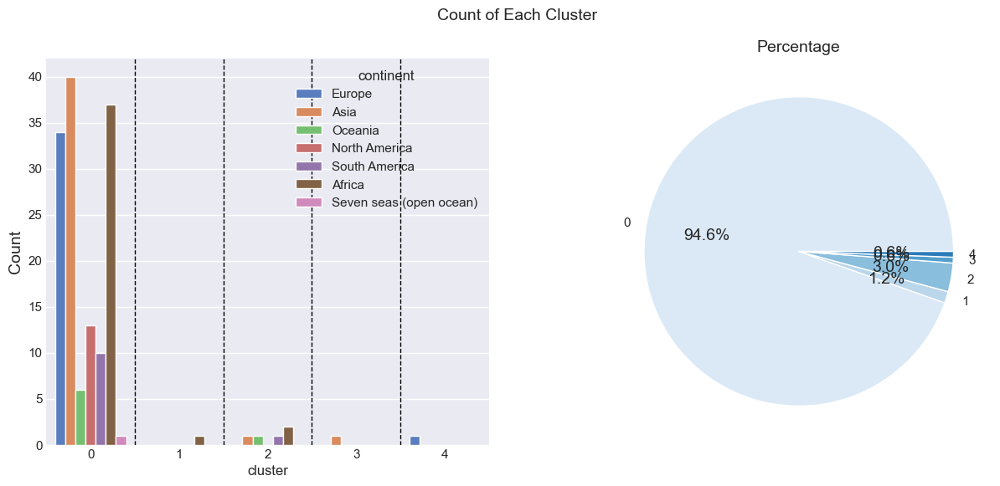

In [500]:

check_result(df_mshift, plot=True)

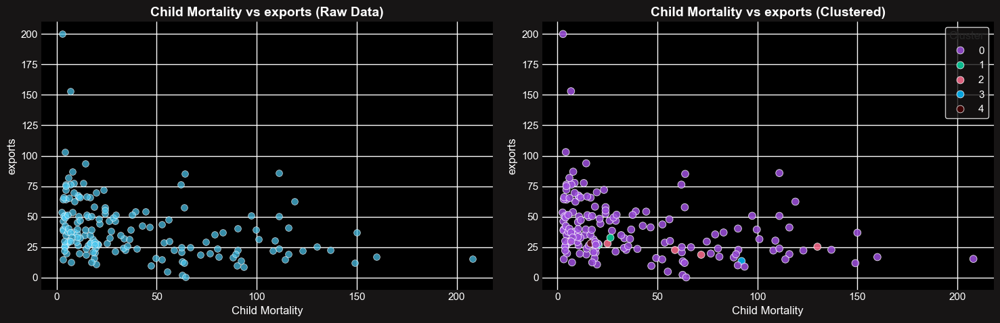

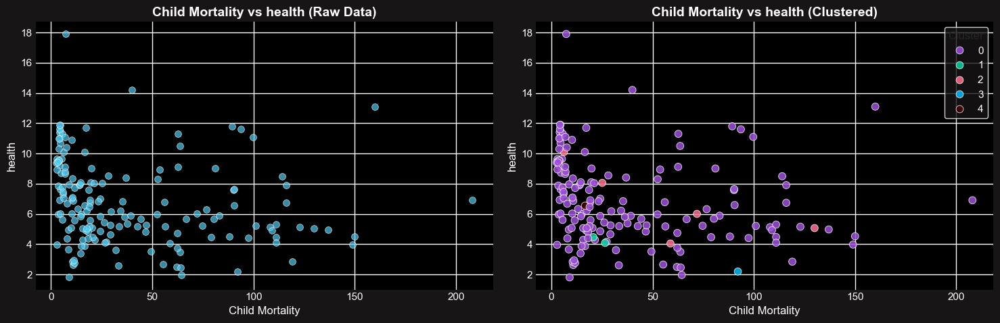

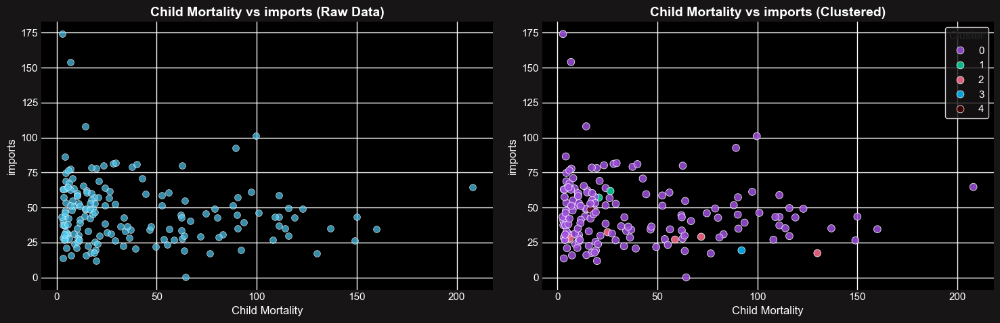

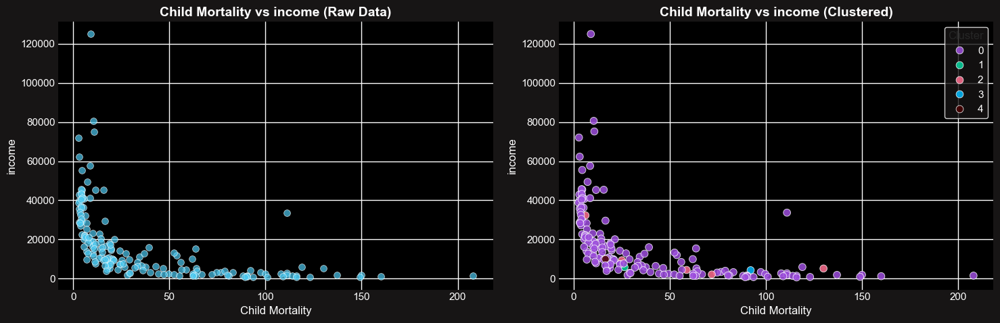

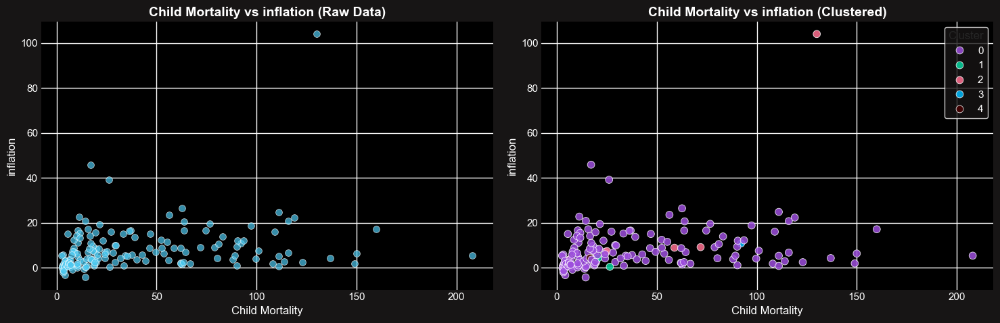

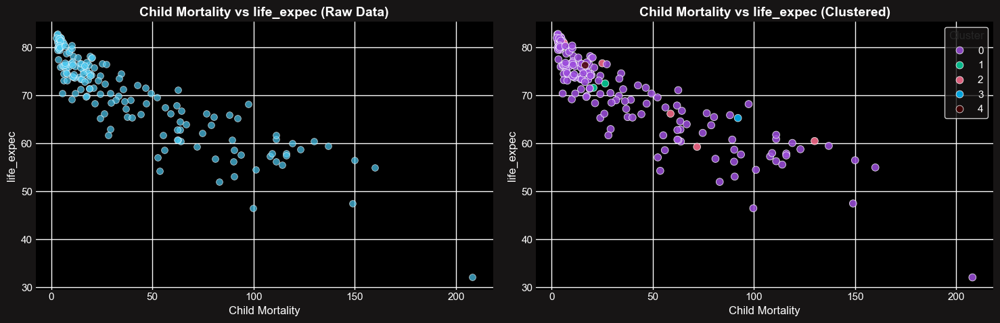

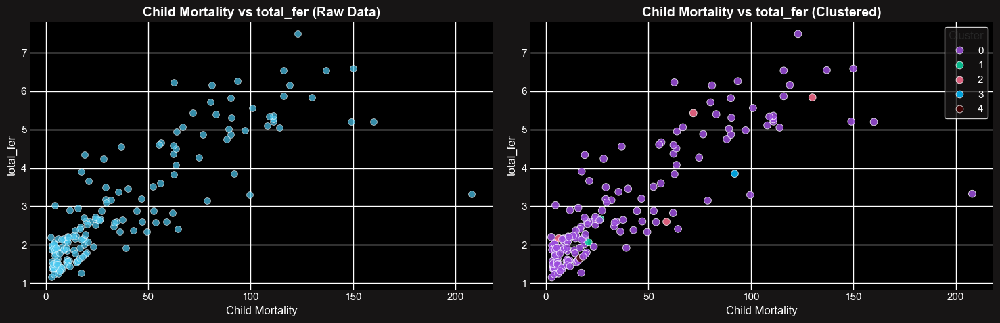

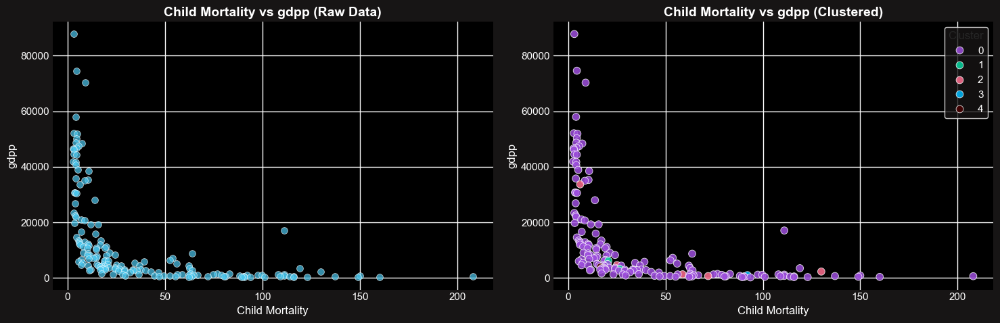

In [501]:
# هماهنگ کردن طول‌ها
if len(pred) > len(analiz):
    pred = pred[:len(analiz)]
elif len(pred) < len(analiz):
    analiz = analiz.iloc[:len(pred)]

# حالا حلقه رسم بدون خطا اجرا میشه
arr = ['exports', 'health', 'imports', 'income', 'inflation',
       'life_expec', 'total_fer', 'gdpp']

palette = ["#9D4EDD", "#06D6A0", "#FF6F91","#00BBFF","#470000"] 

for x in arr:
    fig, axes = plt.subplots(1, 2, figsize=(15, 5))
    
    fig.patch.set_facecolor("#171515")
    for ax in axes:
        ax.set_facecolor("#000000")
    
    # 🔹 نمودار خام
    sns.scatterplot(
        x=analiz["child_mort"], 
        y=analiz[x], 
        ax=axes[0], 
        color="#4CC9F0", 
        alpha=0.7, 
        edgecolor="w",
        s=50
    )
    axes[0].set_title(f"Child Mortality vs {x} (Raw Data)", fontsize=14, fontweight="bold", color="white")
    axes[0].set_xlabel("Child Mortality", fontsize=12, color="white")
    axes[0].set_ylabel(x, fontsize=12, color="white")
    axes[0].tick_params(colors="white")
    
    # 🔹 نمودار خوشه‌بندی شده
    sns.scatterplot(
        x=analiz["child_mort"], 
        y=analiz[x], 
        hue=pred, 
        palette=palette,
        ax=axes[1], 
        alpha=0.85, 
        edgecolor="w", 
        s=60
    )
    
    axes[1].set_title(f"Child Mortality vs {x} (Clustered)", fontsize=14, fontweight="bold", color="white")
    axes[1].set_xlabel("Child Mortality", fontsize=12, color="white")
    axes[1].set_ylabel(x, fontsize=12, color="white")
    axes[1].tick_params(colors="white")
    axes[1].legend(title="Cluster", loc="best", frameon=True, facecolor="#171515", edgecolor="white", labelcolor="white")
    
    plt.tight_layout()
    plt.show()


In [502]:
from sklearn.cluster import KMeans, MeanShift, DBSCAN, AgglomerativeClustering
from sklearn.metrics import silhouette_score, calinski_harabasz_score
from sklearn.preprocessing import StandardScaler
import pandas as pd
import numpy as np
df_p=df.iloc[:,1:-3]
X_numeric = df_p.select_dtypes(include=np.number)
X = X_numeric.copy()
# scaler = StandardScaler()
# m2 = scaler.fit_transform(X)

best_model = pd.DataFrame(columns=["Algorithm", "Silhouette", "Calinski-Harabasz"])

# KMeans
kmeans = KMeans(n_clusters=3, random_state=42).fit(m2)
best_model.loc[len(best_model)] = [
    "KMeans",
    silhouette_score(m2, kmeans.labels_),
    calinski_harabasz_score(m2, kmeans.labels_)
]

# MeanShift
from sklearn.cluster import estimate_bandwidth
bandwidth = estimate_bandwidth(m2, n_samples=10)
ms = MeanShift(bandwidth=bandwidth).fit(m2)
best_model.loc[len(best_model)] = [
    "MeanShift",
    silhouette_score(m2, ms.labels_),
    calinski_harabasz_score(m2, ms.labels_)
]


db = DBSCAN(eps=0.14, min_samples=7).fit(m2)
labels_db = db.labels_
if len(set(labels_db)) > 1: 
    sh_db = silhouette_score(m2, labels_db)
    ch_db = calinski_harabasz_score(m2, labels_db)
else:
    sh_db = np.nan
    ch_db = np.nan
best_model.loc[len(best_model)] = [
    "DBSCAN",
    sh_db,
    ch_db
]


hc = AgglomerativeClustering(n_clusters=3, linkage='ward').fit(m2)
best_model.loc[len(best_model)] = [
    "Hierarchical",
    silhouette_score(m2, hc.labels_),
    calinski_harabasz_score(m2, hc.labels_)
]


print(best_model)


      Algorithm  Silhouette  Calinski-Harabasz
0        KMeans    0.465868         189.885008
1     MeanShift    0.326033          24.970466
2        DBSCAN    0.183815          29.349391
3  Hierarchical    0.469833         180.124354


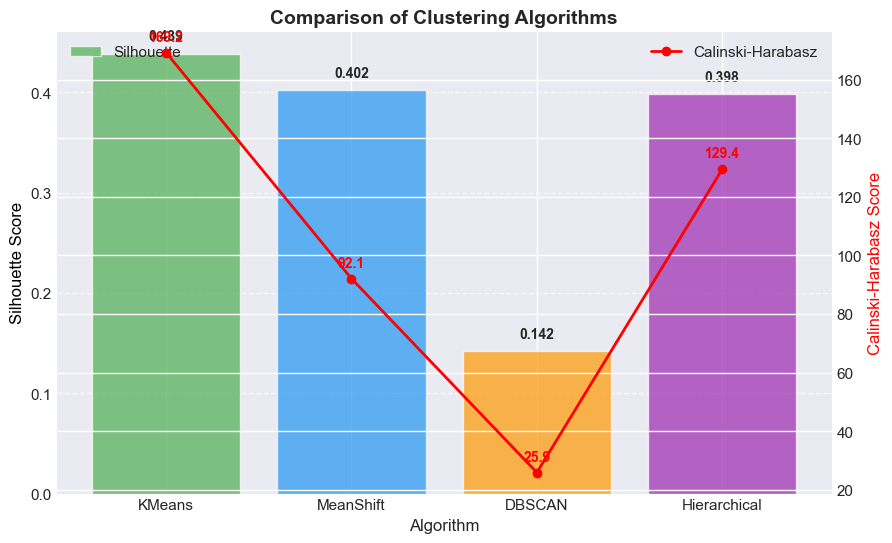

In [503]:

data = {
    "Algorithm": ["KMeans", "MeanShift", "DBSCAN", "Hierarchical"],
    "Silhouette": [0.438632, 0.402368, 0.142061, 0.398270],
    "Calinski-Harabasz": [169.246855, 92.082467, 25.910206, 129.432046]
}

cc = pd.DataFrame(data)


fig, ax1 = plt.subplots(figsize=(10,6))


colors = ["#4CAF50", "#2196F3", "#FF9800", "#9C27B0"]


bars = ax1.bar(cc["Algorithm"], cc["Silhouette"], color=colors, alpha=0.7, label="Silhouette")


for bar in bars:
    height = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width()/2, height + 0.01, f"{height:.3f}", 
             ha="center", va="bottom", fontsize=10, weight="bold")


ax2 = ax1.twinx()
line = ax2.plot(cc["Algorithm"], cc["Calinski-Harabasz"], color="red", marker="o", linewidth=2, label="Calinski-Harabasz")

for i, val in enumerate(cc["Calinski-Harabasz"]):
    ax2.text(i, val + 3, f"{val:.1f}", ha="center", va="bottom", fontsize=10, color="red", weight="bold")


ax1.set_xlabel("Algorithm", fontsize=12)
ax1.set_ylabel("Silhouette Score", fontsize=12, color="black")
ax2.set_ylabel("Calinski-Harabasz Score", fontsize=12, color="red")
plt.title("Comparison of Clustering Algorithms", fontsize=14, weight="bold")

ax1.legend(loc="upper left")
ax2.legend(loc="upper right")

ax1.grid(axis="y", linestyle="--", alpha=0.7)

plt.show()
